# Class for Solving Evans Systems

### Note: Define all needed symbols outside the class

In this file we solve the system starting at $x=+\infty$

In [1]:
from sympy import *
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
from IPython.display import display, Markdown, Latex

In [3]:
plt.rcParams['figure.figsize'] = 15, 5

In [4]:
class SystemSolve():
    def __init__(self,dim,terms,A,deriv,e_val, e_vec,print_on=True, comp=False):
        self.dim = dim
        self.terms = terms
        self.A = A
        self.deriv = deriv
        self._createB()
        self.p = print_on
        self.comp = comp
        self._setEigs(e_val, e_vec)
        return
    
    def _createB(self):
        self.B = []
        for i in range(self.terms):
            b = []
            for j in range(1,self.dim+1):
                b.append(sympify('B{}_{}'.format(i,j)))
            self.B.append(b)
        return
    
    def _setEigs(self, e_val, e_vec):
        self.e_val = e_val
        self.B_tups = []
        b_tups = []
        for i in range(self.dim):
            b_tups.append((self.B[0][i],e_vec[i]))
        
        self.B_tups = b_tups
        #self.B_tups.append(b_tups)
        return
    
    def createSys(self):
        W = []
        W_deriv = []

        for j in range(self.dim):
            w = sympify(0)
            for i in range(self.terms):
                w += self.B[i][j]*sigma**i
            w_deriv = diff(w, sigma)

            W.append(w)
            W_deriv.append(w_deriv)

        # Store W and W' as numpy arrays
        self.W = np.array(W)
        self.W_deriv = np.array(W_deriv)

        # Replace matrix A by A-lam*I
        Anew = self.A - np.eye(self.dim)*self.e_val
        
        # Define system of equations from each row of A
        eqs = []
        for i in range(self.dim):
            eq = np.dot(Anew[i],self.W)-self.W_deriv[i]*self.deriv
            eqs.append(eq)
   
        # Isolate coefficients for each power of sigma
        eq_der = [eq.copy() for eq in eqs]
        heqs = []

        for i in range(self.terms):
            if i==0: prod = 1
            else: 
                prod *= i

            if self.p: print('\n\npower = {}'.format(i)) 
            res = [eqd.subs(sigma,0)/prod for eqd in eq_der]

            if self.p:
                for r in res:
                    print('\n')
                    print(r)

            heqs.append(res)    
            eq_der = [diff(eqd,sigma) for eqd in eq_der]

        # Solve for the coefficients of W
        up = 1
        stop = True
        for j in range(len(heqs)):
            if j == len(heqs)-1 and stop:
                break
            if self.p:
                p1 = '-'*21+'\nsystem when sigma = '
                p2 = str(j)+'\n'+'-'*21+'\n'
                print(p1+p2)
                
            if j == 0:
                try: 
                    matrix, vector = linear_eq_to_matrix(heqs[j],self.B[j+up])
                    soln = matrix.LUsolve(vector)
                except: 
                    #print('failed')
                    up = 0
                    stop = False

            matrix, vector = linear_eq_to_matrix(heqs[j],self.B[j+up])
            soln = matrix.LUsolve(vector)

            for i in range(self.dim):
                val = soln[i].subs(self.B_tups)
                if self.comp: val = complex(val)
                
                if j != 0 or stop: 
                    self.B_tups.append((self.B[j+up][i],val))
                if self.p: 
                    val = str(self.B[j+up][i]) +' = '+str(val)
                    print(val,'\n\n')

    def evalW(self, sig_val):
        to_sub = self.B_tups + [(sigma,sig_val)]
        
        W_vals = []
        
        for i in range(self.dim):
            val = self.W[i].subs(self.B_tups).subs(sigma,sig_val)
            if self.comp: val = complex(val)
            W_vals.append(val)
        return W_vals
    
    def checkBNorms(self):
        norms = []
        for b in self.B:
            norm = sympify(0)
            for i in b:
                norm = norm + Abs(i)
            norm = (norm)**(1/2)
            
            norm = norm.subs(self.B_tups)
            print(norm)
            norms.append(norm)

        return norms

## Evans Function

In [5]:
# define symbols
sigma, alpha = symbols('sigma, alpha') 

In [6]:
def solve_evans(lam, G=5/3, nu=.1):
    # define parameters
    #G = 5/3
    mu = 1
    #nu = .1
    vp = G/(G+2)
    ep = 2/((G+2)**2)
    dim = 5
    
    # define e(sigma)
    a0 = ep
    a1 = (mu*vp - 2*nu*vp + nu - (4*G*a0*mu*nu - 6*G*mu*nu*vp**2 + 8*G*mu*nu*vp - \
          2*G*mu*nu + mu**2*vp**2 - 4*mu*nu*vp**2 + 2*mu*nu*vp + 4*nu**2*vp**2 - 4*nu**2*vp + nu**2)**(1/2))/(2*G*nu)
    a2 = (a1*mu - a1*nu - 3*mu*vp/2 + mu)/(3*G*a1*nu - mu*vp + 4*nu*vp - 2*nu)
    a3 = (2*G*a2**2*nu + a2*mu - 2*a2*nu - mu/2)/(4*G*a1*nu - mu*vp + 6*nu*vp - 3*nu)
    a4 = (5*G*a2*a3*nu + a3*mu - 3*a3*nu)/(5*G*a1*nu - mu*vp + 8*nu*vp - 4*nu)
    a5 = (6*G*a2*a4*nu - 3*G*a3**2*nu + a4*mu - 4*a4*nu)/(6*G*a1*nu - mu*vp + 10*nu*vp - 5*nu)
    e_coeffs = [a0,a1,a2,a3,a4,a5]
    e = sympify(0)
    for j in range(0,len(e_coeffs)):
        e = e+e_coeffs[j]*sigma**j
    e_deriv = diff(e,sigma)
    
    
    v = sigma + vp
    vx = (v*(v-1)+G*e)/mu
    ex = v*(-.5*(v-1)**2+e)
    ux = vx
    uxx = (vx*(2*v-1)+G*ex)/mu

    g = (G*e-(nu+1)*ux)/nu
    h = -ex/v
    f = 2*v - 1

    #print('here 1')
    A = np.array([[0,1,0,0,0],\
                  [lam*v/nu,v/nu,v*ux/nu-uxx,lam*g,g-h],\
                  [0,0,0,lam,1],\
                  [0,0,0,0,1],\
                  [0,G,lam*v+G*ux,lam*v,f-lam]])

    # define A(sigma, lambda)
    u_x = (1/mu)*((sigma+vp)*(sigma+vp-1)+G*e)
    u_xx = (1/mu)*((1/mu)*((sigma+vp)*(sigma+vp-1)+G*e)*\
           (2*(sigma+vp)-1)+G*((sigma+vp)/nu *(-(sigma+vp-1)**2/2+e)))
    g = (1/nu)*(G*e-(nu+1)*((sigma+vp)*(sigma+vp-1)+G*e))
    f = 2*(sigma+vp)-1
    h = (-1/nu)*(-(sigma+vp-1)**2/2+e)
    A = np.array([[0,1,0,0,0],\
                  [lam*(sigma+vp)/nu,(sigma+vp)/nu,(sigma+vp)*u_x/nu-u_xx,lam*g,g-h],\
                  [0,0,0,lam,1],\
                  [0,0,0,0,1],\
                  [0,G,lam*(sigma+vp)+G*u_x,lam*(sigma+vp),f-lam]])

    # compute eigenpair for A+
    A_lim_det = -alpha*((vp/nu-alpha)*(-alpha*(-alpha*(2*vp-1-lam-alpha)-lam*vp)+\
                lam*vp*(lam+alpha))-G*(alpha*(lam*G*ep/nu+alpha*G*ep/nu))) -\
                (lam*vp/nu)*(-alpha*(-alpha*(2*vp-1-lam-alpha)-lam*vp)+lam*vp*(lam+alpha))
    A_lim_det = Poly(A_lim_det, alpha)
    
    cfs = A_lim_det.coeffs()

    if isinstance(lam, complex):
        cfs = [complex(cfs_) for cfs_ in cfs]
   
    #e_vals = np.polynomial.polynomial.polyroots(cfs)

    e_vals = np.roots(cfs)

    #temp = G*ep*(lam+e_val)/(nu*e_val**2-vp*(lam+e_val))
    e_vecs = [[G*ep*(lam+e_val)/(nu*e_val**2-vp*(lam+e_val)),\
               e_val*G*ep*(lam+e_val)/(nu*e_val**2-vp*(lam+e_val)),\
               (lam+e_val)/e_val,1,e_val] for e_val in e_vals]
    e_vecs = [[el/np.linalg.norm(np.array(e_vec)) for el in e_vec] for e_vec in e_vecs]
    return A, ux, e_vals, e_vecs

In [7]:
G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

## Test the code for $\lambda = 10$ with 5 terms in series

In [9]:
A, ux, e_vals, e_vecs = solve_evans(10)
my_sys = SystemSolve(5,5,A,ux,e_vals[1],e_vecs[1])
my_sys.createSys()



power = 0


10.564589700204*B0_1 + 1.0*B0_2


45.4545454545455*B0_1 + 15.1100442456585*B0_2 + 24.7933884297521*B0_4 + 2.47933884297521*B0_5


10.564589700204*B0_3 + 10.0*B0_4 + 1.0*B0_5


10.564589700204*B0_4 + 1.0*B0_5


1.66666666666667*B0_2 + 4.54545454545454*B0_3 + 4.54545454545454*B0_4 + 0.473680609294894*B0_5


power = 1


11.4205293151334*B1_1 + 1.0*B1_2


100.0*B0_1 + 10.0*B0_2 - 4.62326723772085*B0_3 + 17.6503052402029*B0_4 + 2.62939283444398*B0_5 + 45.4545454545455*B1_1 + 15.9659838605879*B1_2 + 24.7933884297521*B1_4 + 2.47933884297521*B1_5


11.4205293151334*B1_3 + 10.0*B1_4 + 1.0*B1_5


11.4205293151334*B1_4 + 1.0*B1_5


8.57343397511769*B0_3 + 10*B0_4 + 2*B0_5 + 1.66666666666667*B1_2 + 4.54545454545454*B1_3 + 4.54545454545454*B1_4 + 1.32962022422428*B1_5


power = 2


-1.22531505711011*B1_1 + 12.2764689300628*B2_1 + B2_2


0.156604841111204*B0_3 - 112.253150571101*B0_4 - 14.8734247144495*B0_5 + 100.0*B1_1 + 8.77468494288989*B1_2 - 4.62326723772085*B1_3 + 17.6503052402029

### Test various real values for $\lambda$

## $\lambda$ = 5

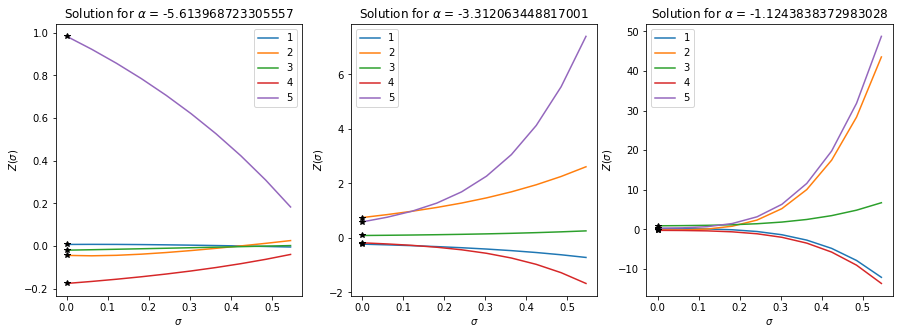

## $\lambda$ = 10

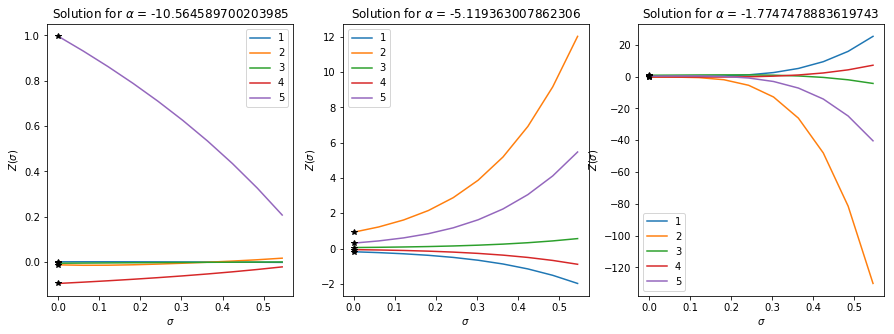

## $\lambda$ = 20

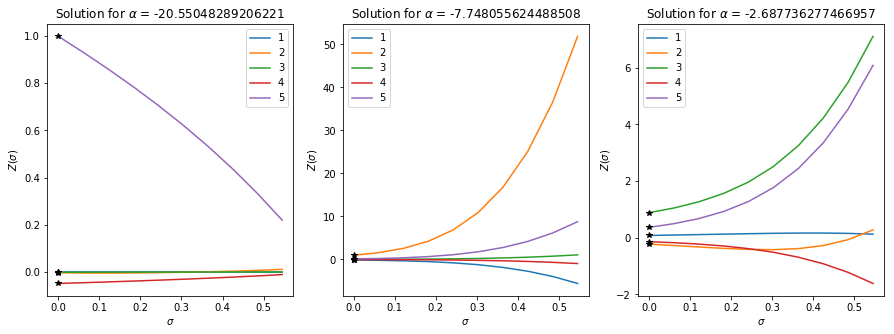

## $\lambda$ = 50

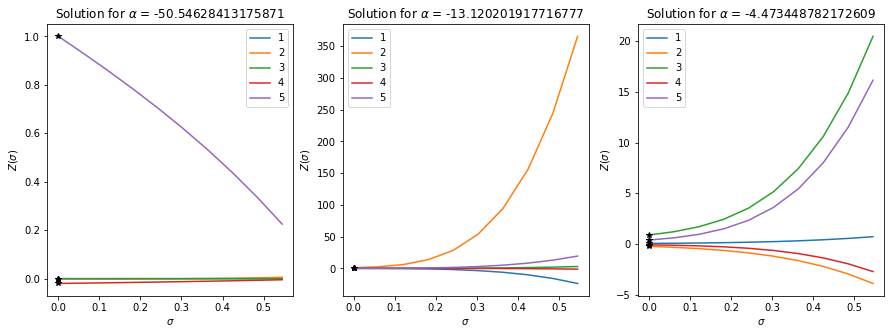

## $\lambda$ = 75

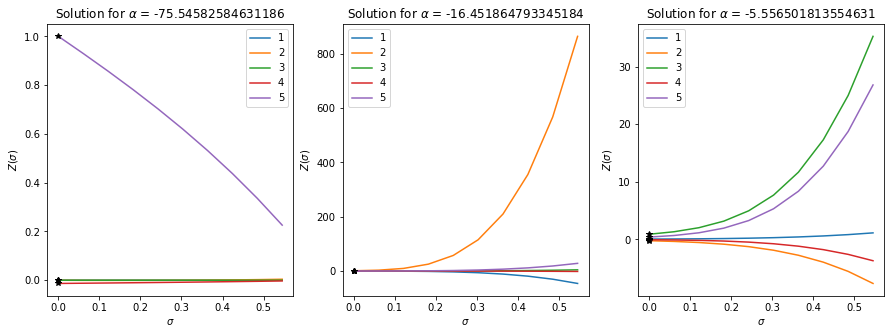

## $\lambda$ = 100

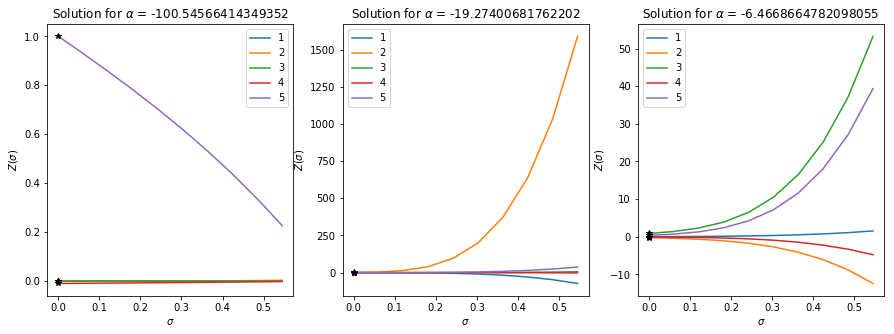

## $\lambda$ = 150

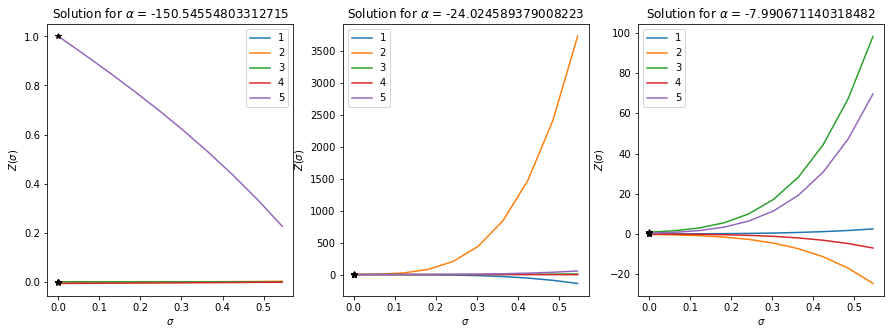

In [106]:
lambdas = [5,10,20,50,75,100,150]
for lmbda in lambdas:
    loc = 0
    A, u_x, e_vals, e_vecs = solve_evans(lmbda)
    display(Markdown('## $\lambda$ = {}'.format(lmbda)))
    for j in range(len(e_vals)):
        if e_vals[j] < 0:
            loc += 1
            sys_ = SystemSolve(5, 5, A, u_x, e_vals[j], e_vecs[j], False)
            sys_.createSys()

            sigs = np.linspace(sp,sm,10)
            W_ = np.zeros((5,len(sigs)))
            for i,sig in enumerate(sigs):
                w_val = sys_.evalW(sig)
                W_[:,i] = w_val
            
            plt.subplot(1,3,loc)
            for i in range(len(W_[:,0])):
                plt.plot(sigs[:], -W_[i][:],label=i+1)
                plt.plot(0,-e_vecs[j][i],'*k')
            plt.legend()
            plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[j],lmbda))
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$Z(\sigma)$')
    plt.show()

In [19]:
plt.rcParams['figure.figsize'] = 15, 5

### Testing based on values of $\Lambda$ in paper

# $\Lambda$ = 398.6

### $\lambda$ = -398.6j

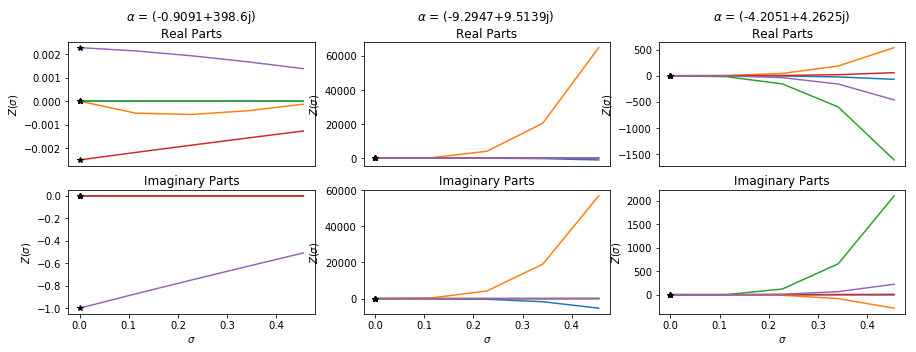

### $\lambda$ = (281.8528-281.8528j)

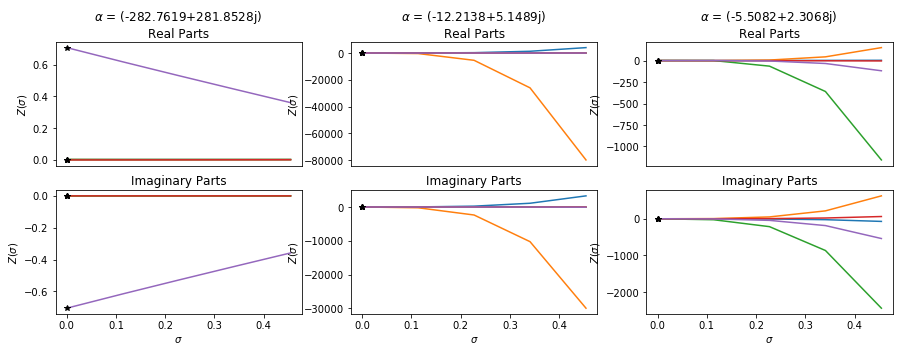

### $\lambda$ = (398.6+0j)

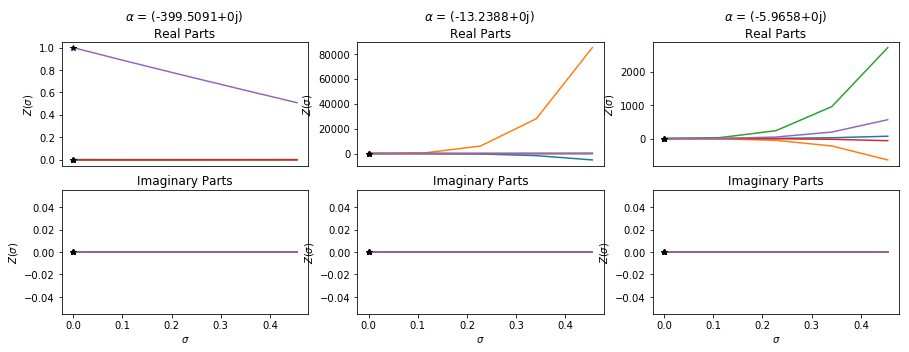

### $\lambda$ = (281.8528+281.8528j)

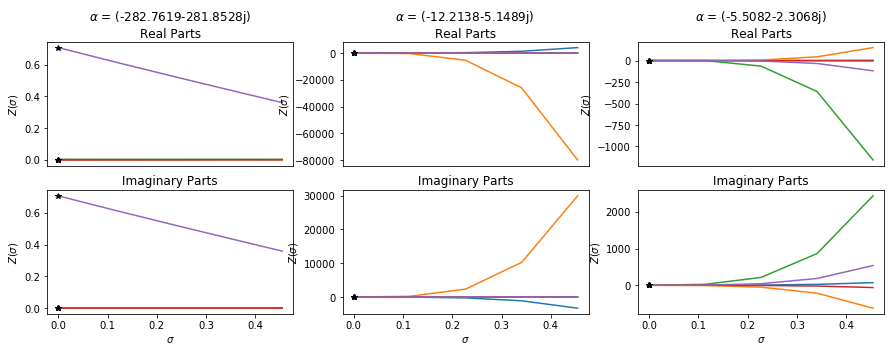

### $\lambda$ = 398.6j

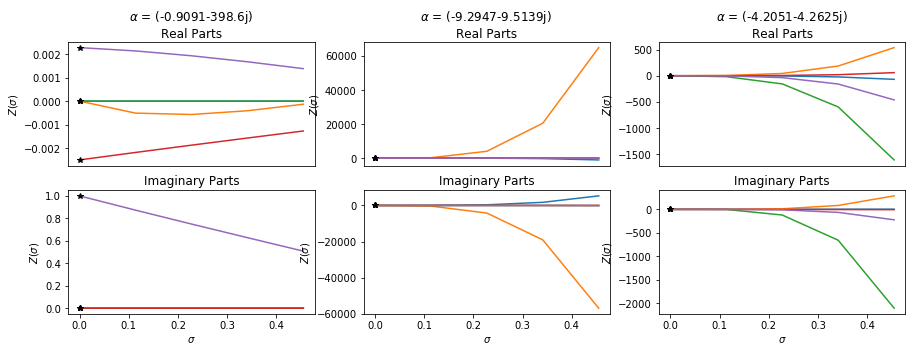

# $\Lambda$ = 388.8

### $\lambda$ = -388.8j

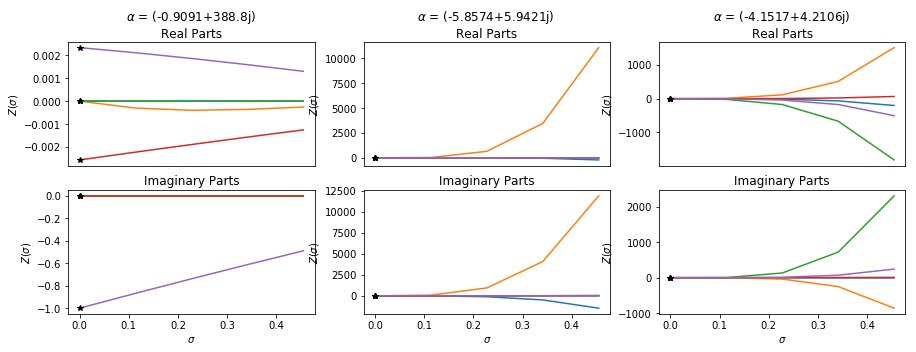

### $\lambda$ = (274.9231-274.9231j)

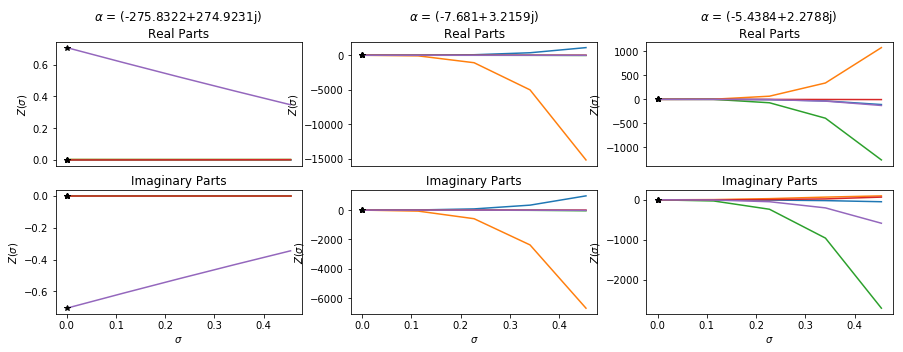

### $\lambda$ = (388.8+0j)

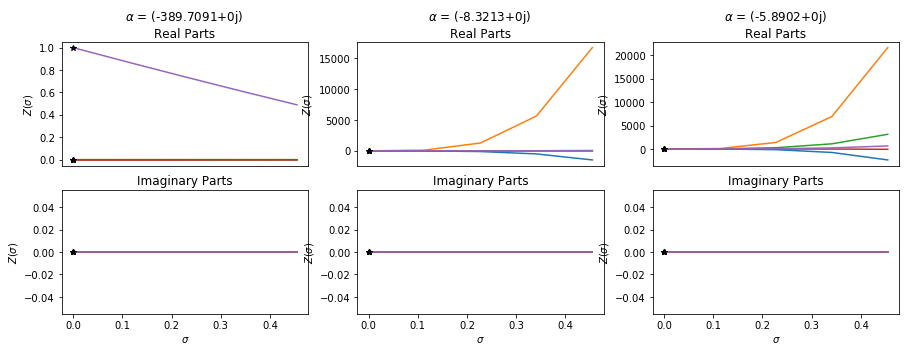

### $\lambda$ = (274.9231+274.9231j)

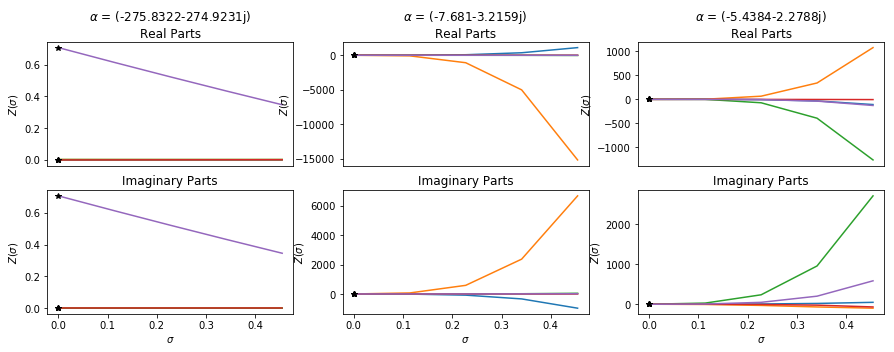

### $\lambda$ = 388.8j

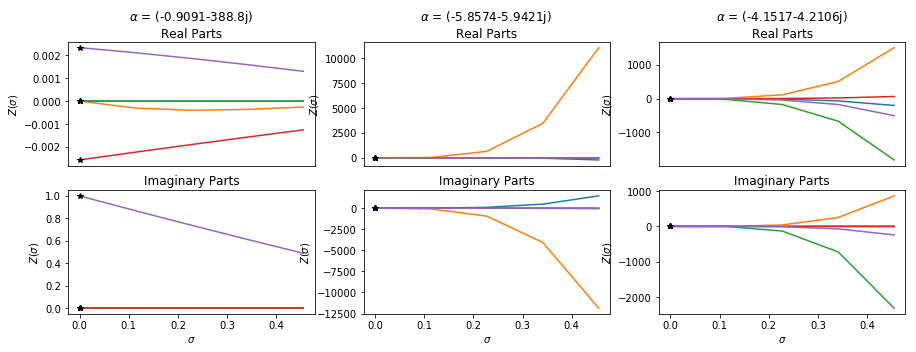

# $\Lambda$ = 385.3

### $\lambda$ = -385.3j

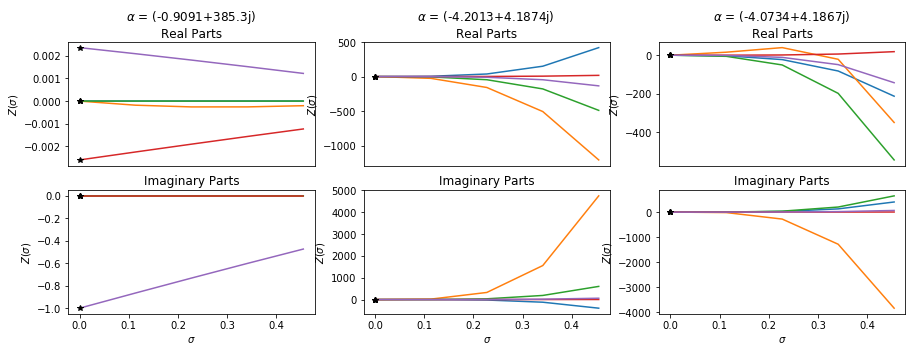

### $\lambda$ = (272.4482-272.4482j)

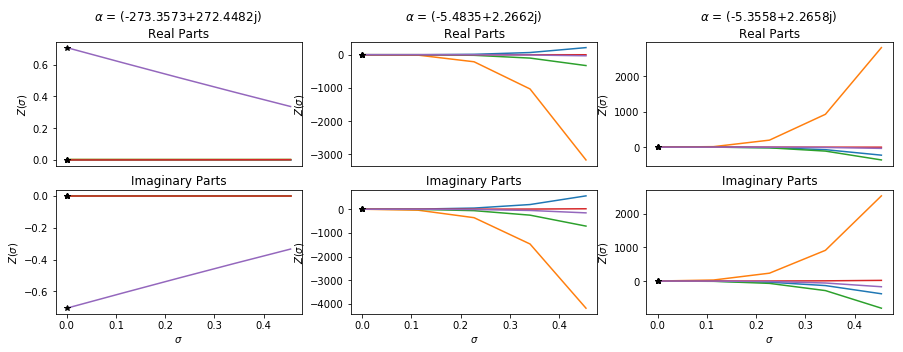

### $\lambda$ = (385.3+0j)

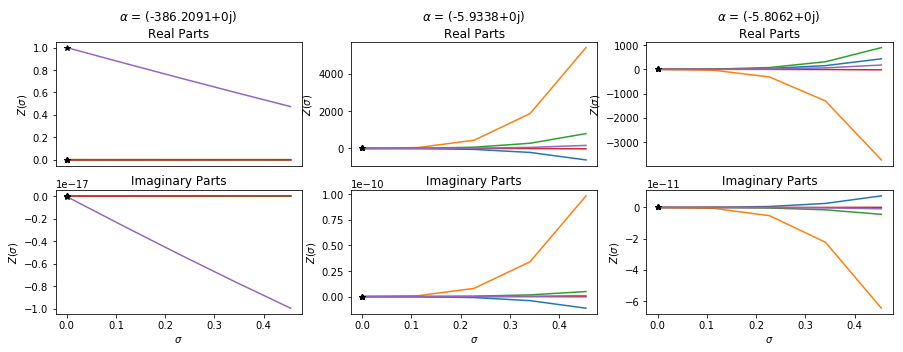

### $\lambda$ = (272.4482+272.4482j)

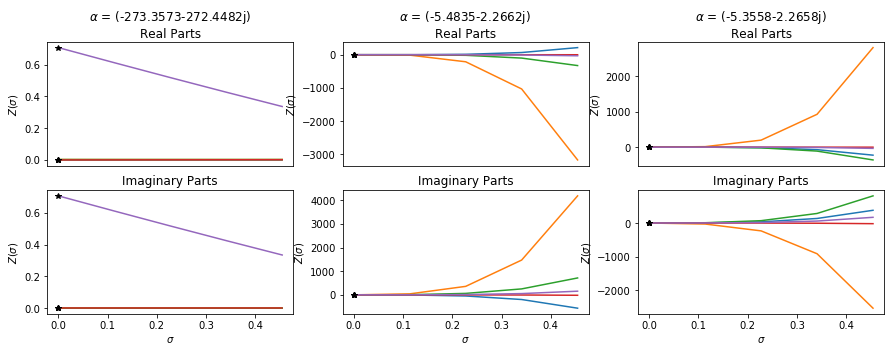

### $\lambda$ = 385.3j

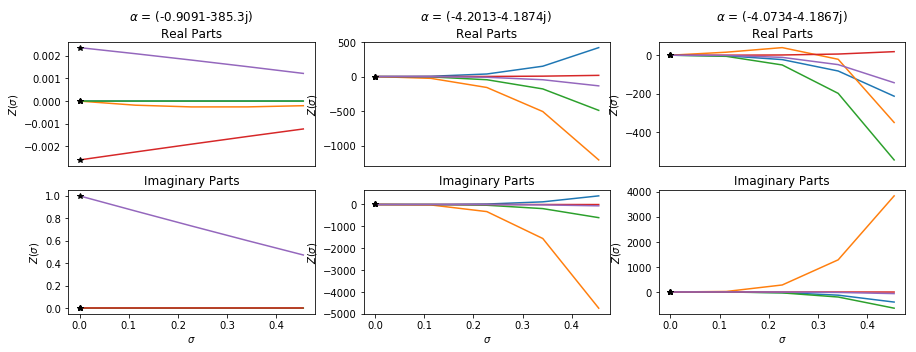

# $\Lambda$ = 733.8

### $\lambda$ = -733.8j

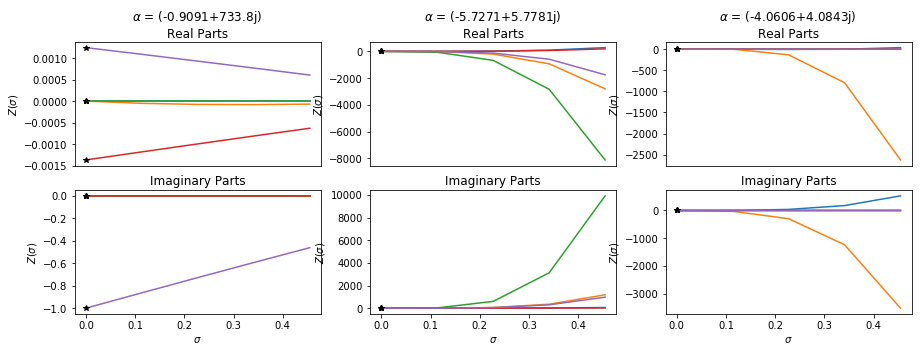

### $\lambda$ = (518.875-518.875j)

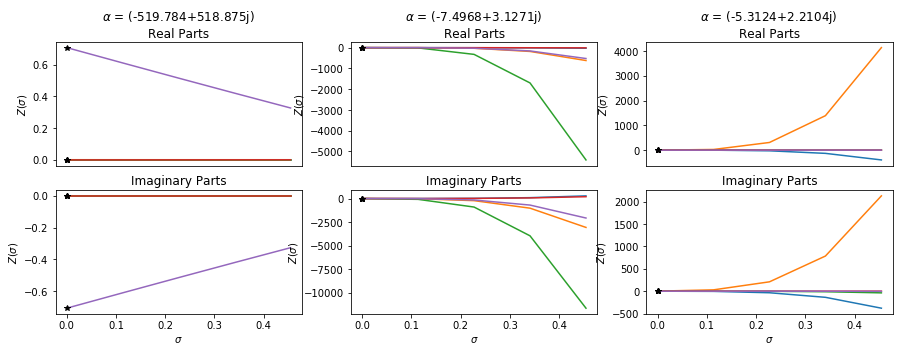

### $\lambda$ = (733.8+0j)

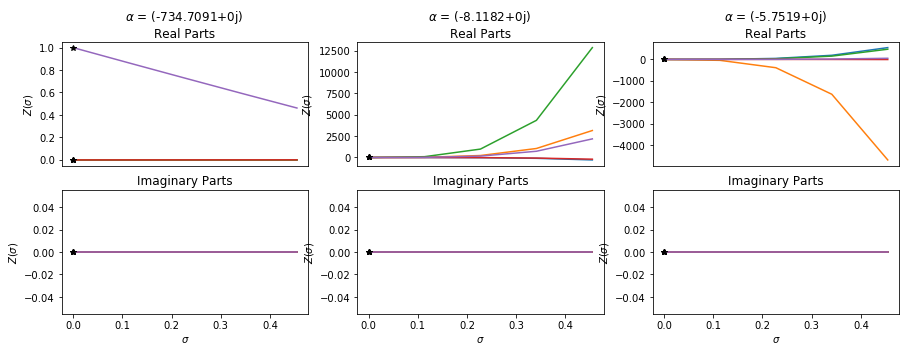

### $\lambda$ = (518.875+518.875j)

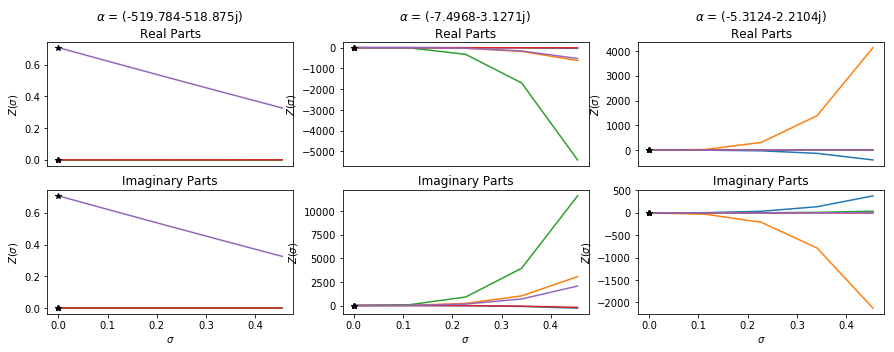

### $\lambda$ = 733.8j

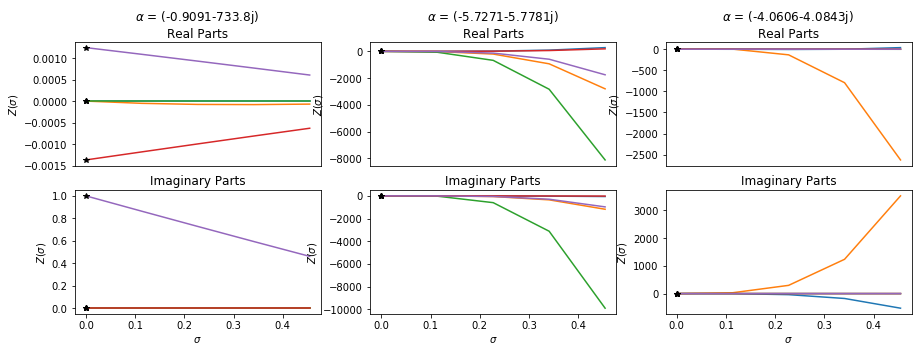

# $\Lambda$ = 1755.6

### $\lambda$ = -1755.6j

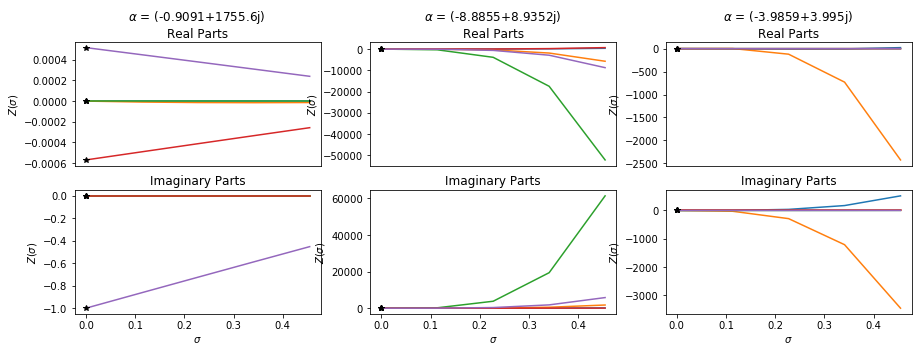

### $\lambda$ = (1241.3967-1241.3967j)

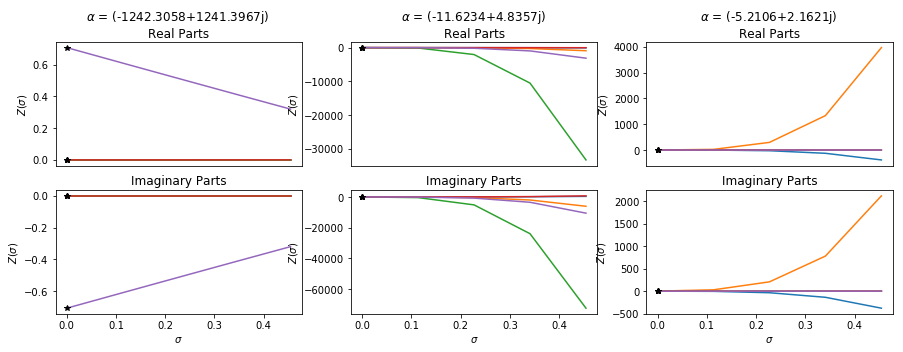

### $\lambda$ = (1755.6+0j)

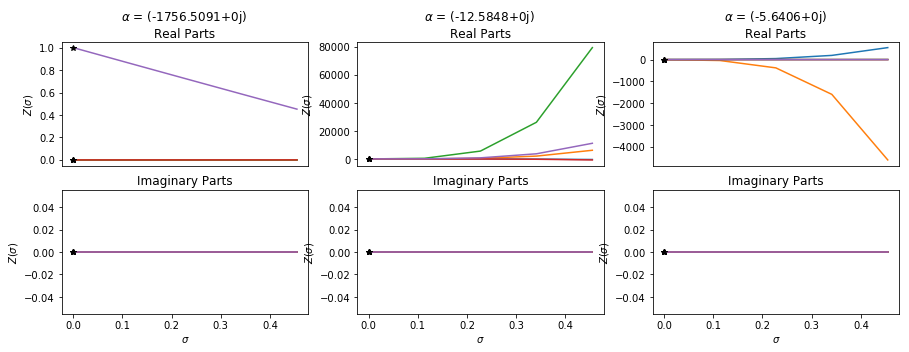

### $\lambda$ = (1241.3967+1241.3967j)

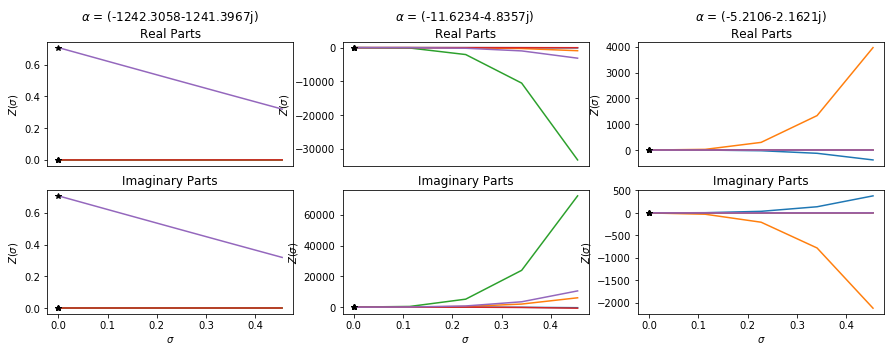

### $\lambda$ = 1755.6j

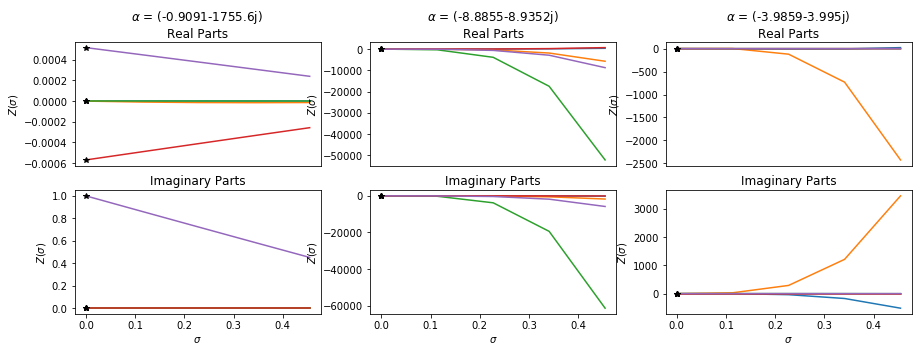

# $\Lambda$ = 211.7

### $\lambda$ = -211.7j

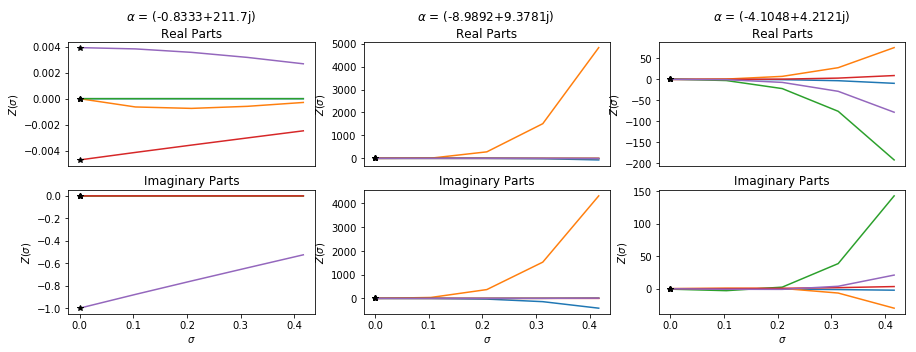

### $\lambda$ = (149.6945-149.6945j)

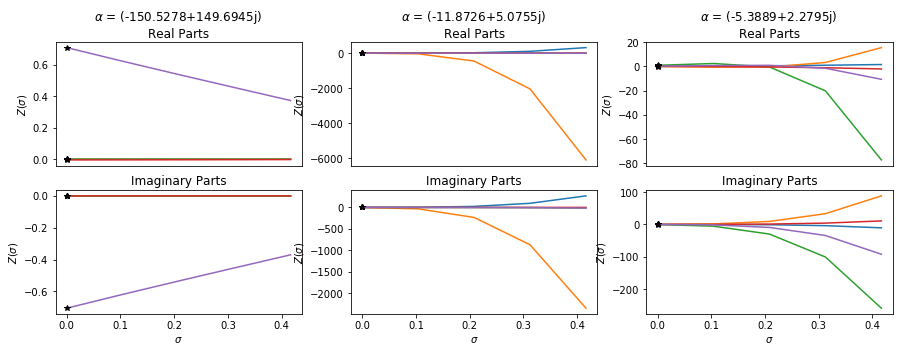

### $\lambda$ = (211.7+0j)

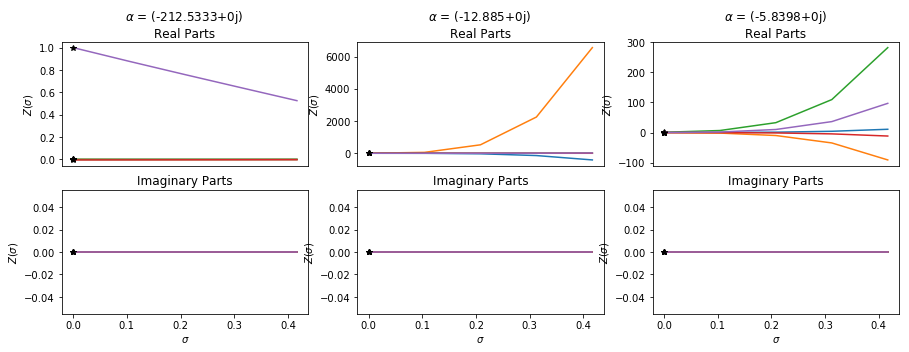

### $\lambda$ = (149.6945+149.6945j)

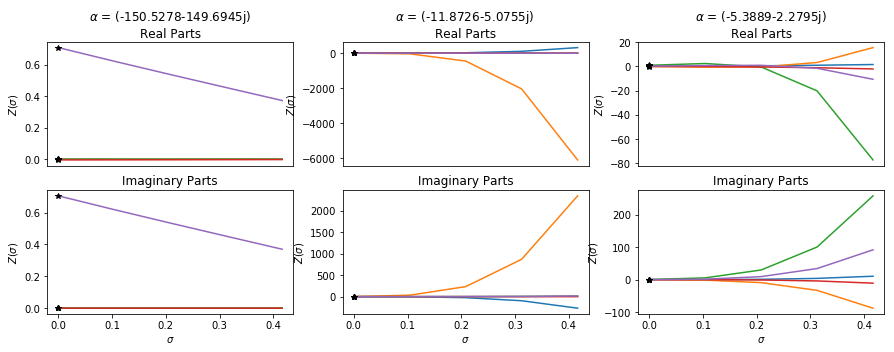

### $\lambda$ = 211.7j

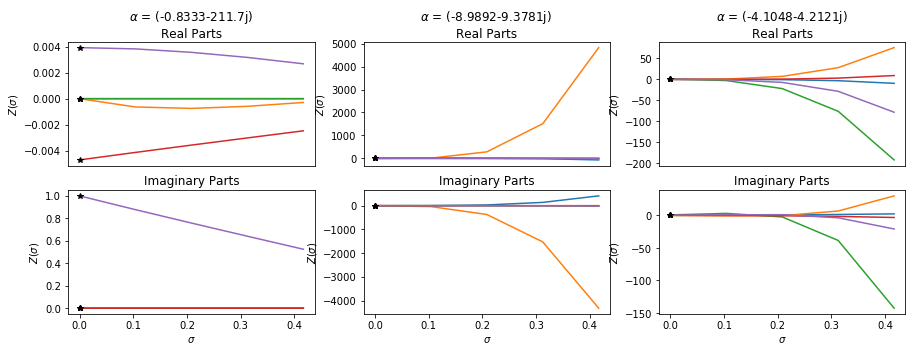

# $\Lambda$ = 182.3

### $\lambda$ = -182.3j

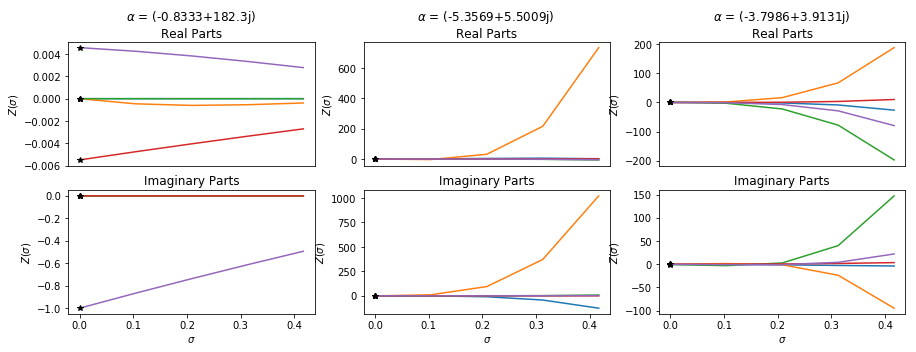

### $\lambda$ = (128.9056-128.9056j)

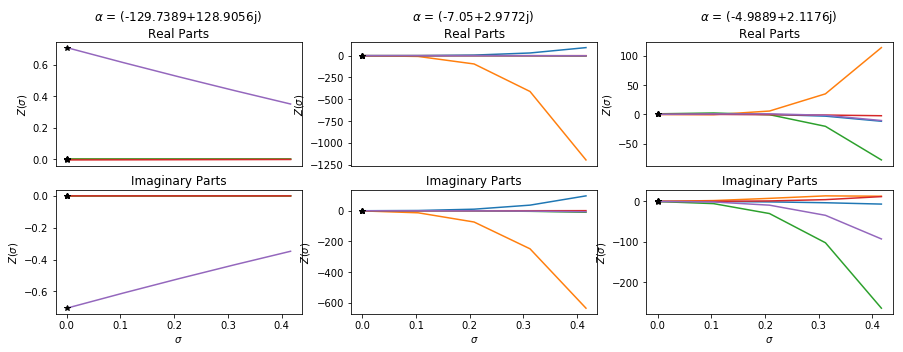

### $\lambda$ = (182.3+0j)

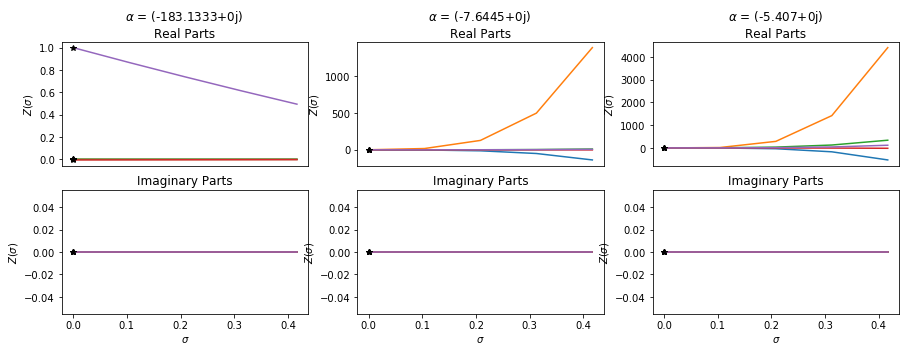

### $\lambda$ = (128.9056+128.9056j)

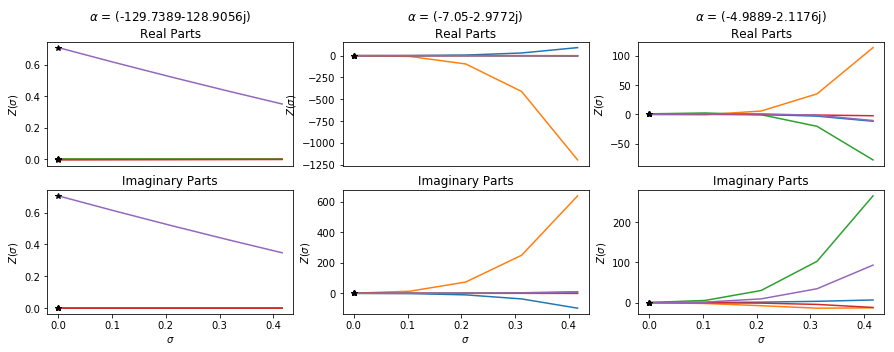

### $\lambda$ = 182.3j

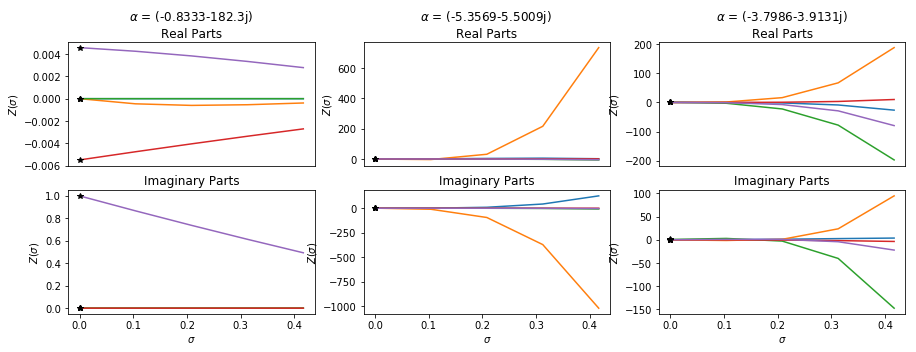

# $\Lambda$ = 175.1

### $\lambda$ = -175.1j

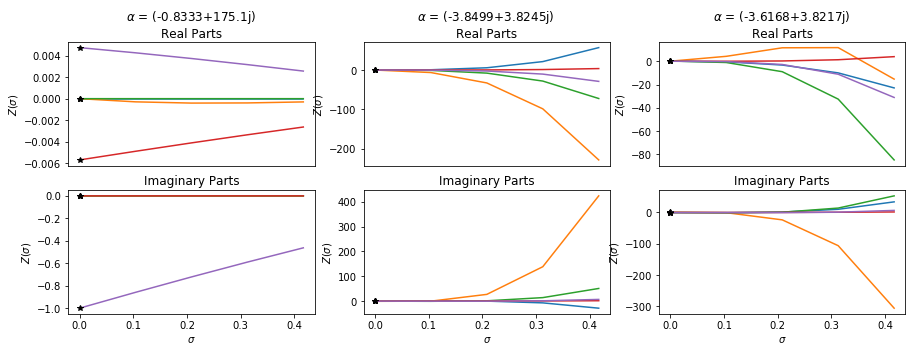

### $\lambda$ = (123.8144-123.8144j)

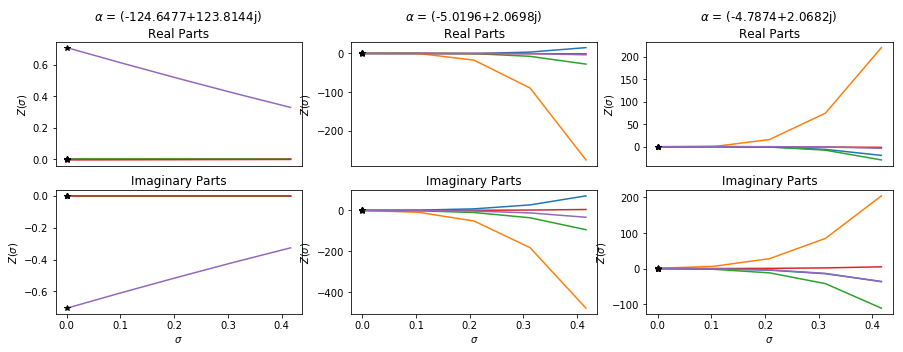

### $\lambda$ = (175.1+0j)

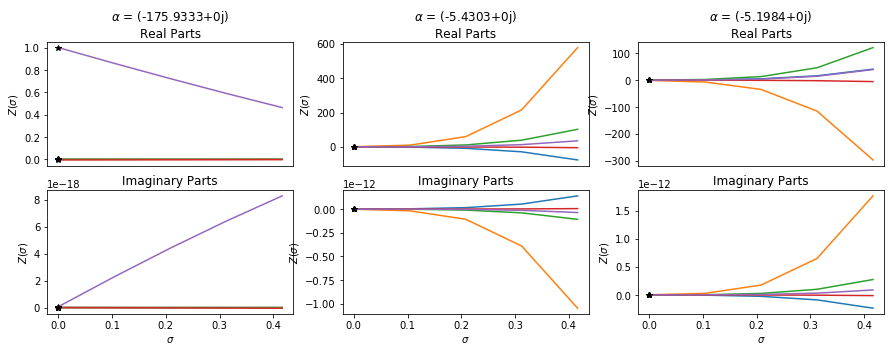

### $\lambda$ = (123.8144+123.8144j)

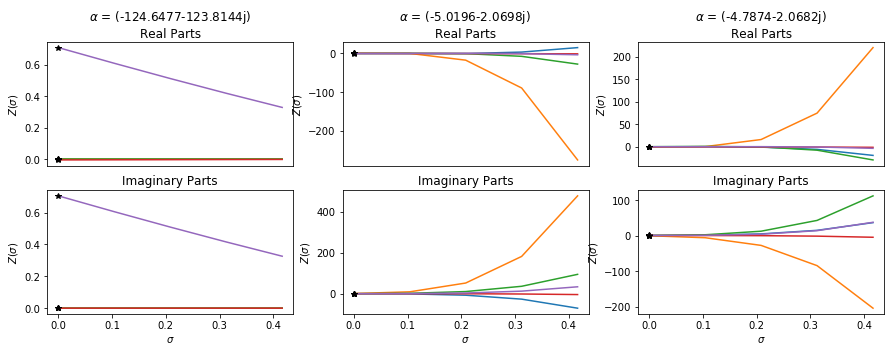

### $\lambda$ = 175.1j

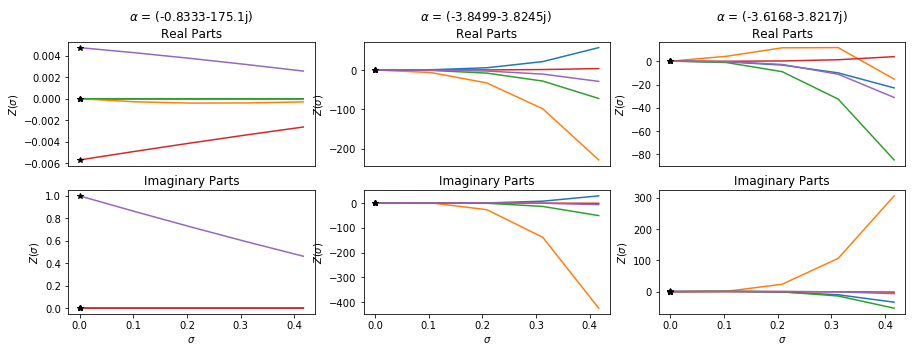

# $\Lambda$ = 325.0

### $\lambda$ = -325j

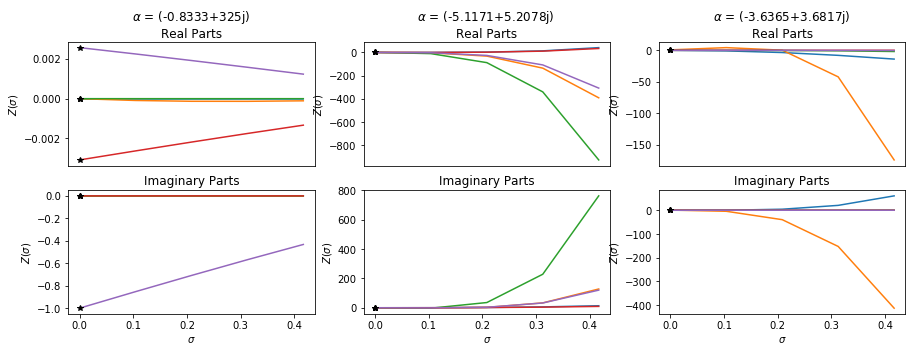

### $\lambda$ = (229.8097-229.8097j)

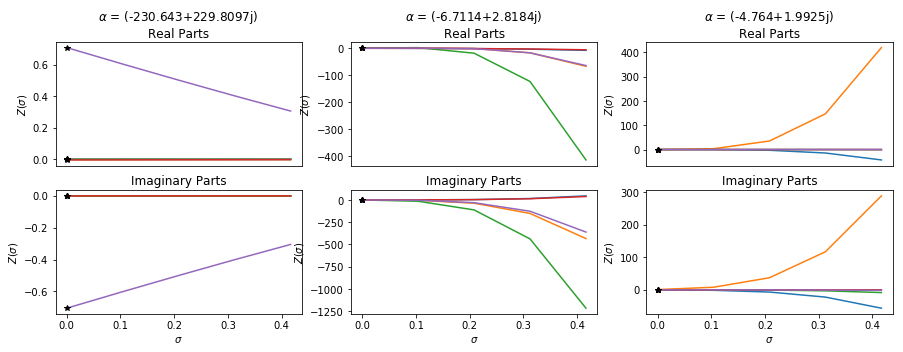

### $\lambda$ = (325+0j)

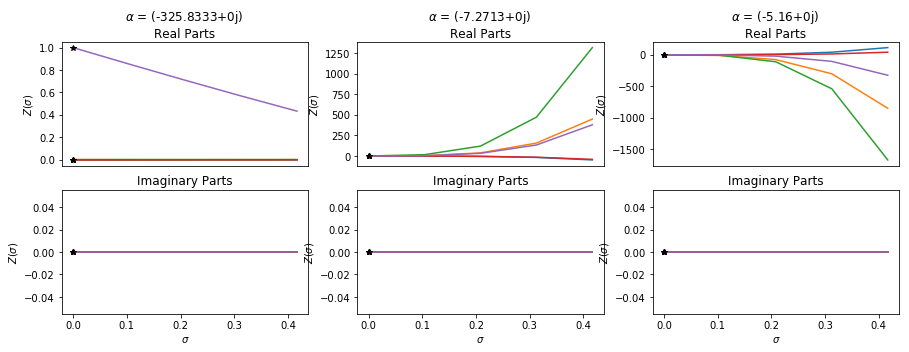

### $\lambda$ = (229.8097+229.8097j)

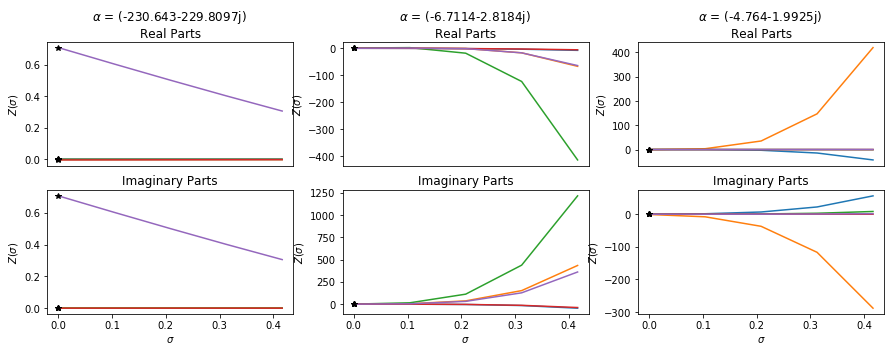

### $\lambda$ = 325j

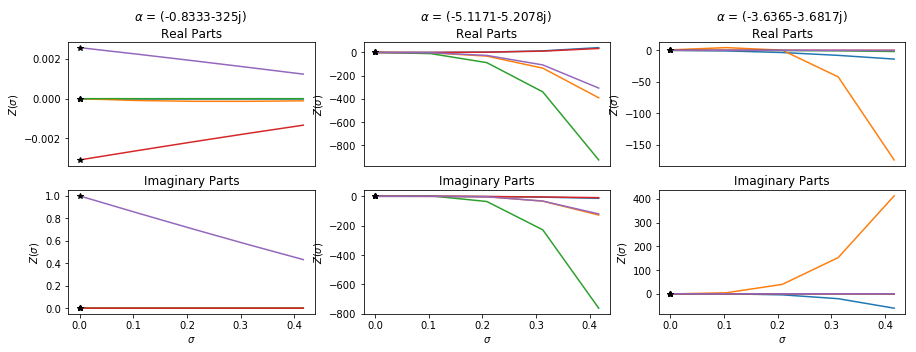

# $\Lambda$ = 762.0

### $\lambda$ = -762j

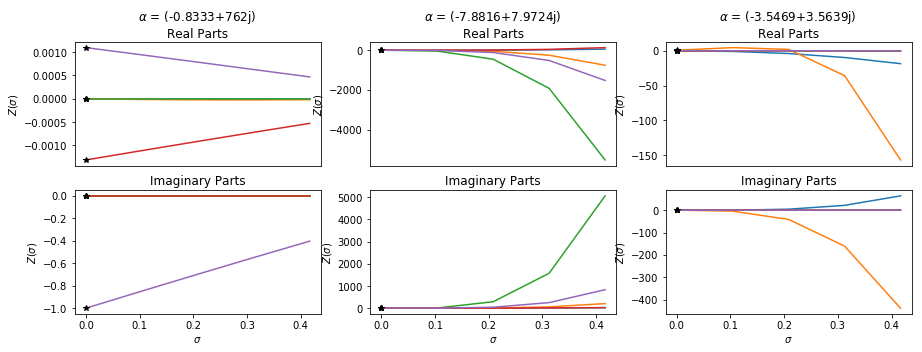

### $\lambda$ = (538.8154-538.8154j)

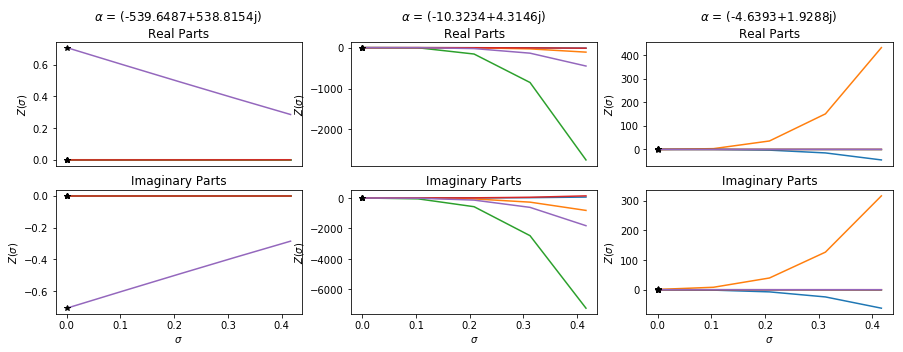

### $\lambda$ = (762+0j)

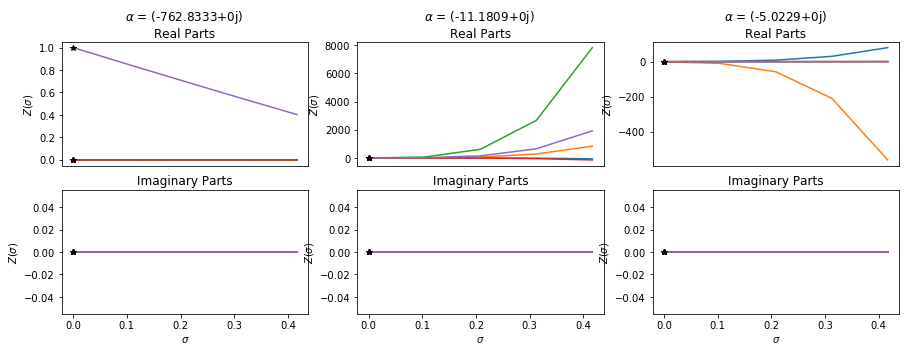

### $\lambda$ = (538.8154+538.8154j)

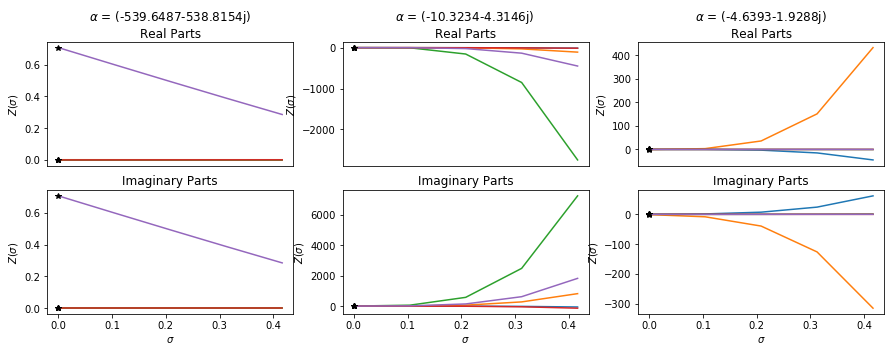

### $\lambda$ = 762j

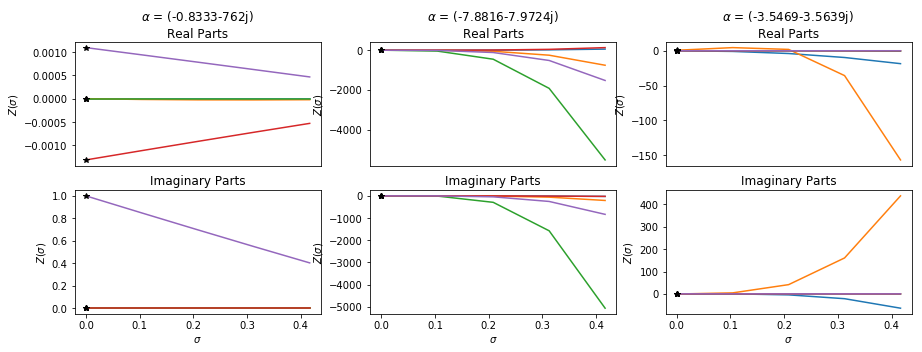

# $\Lambda$ = 222.5

### $\lambda$ = -222.5j

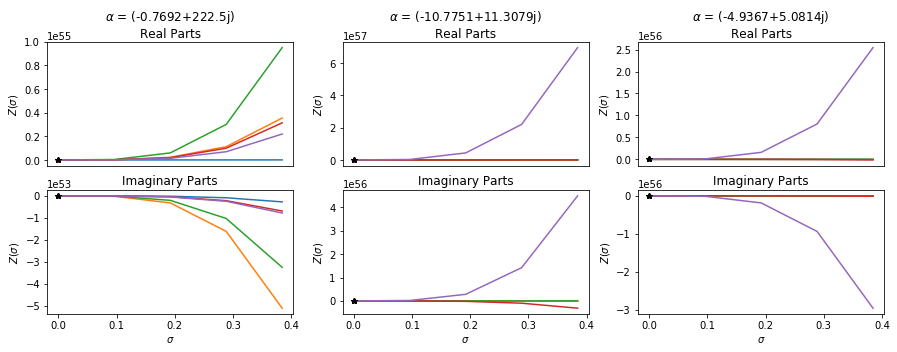

### $\lambda$ = (157.3313-157.3313j)

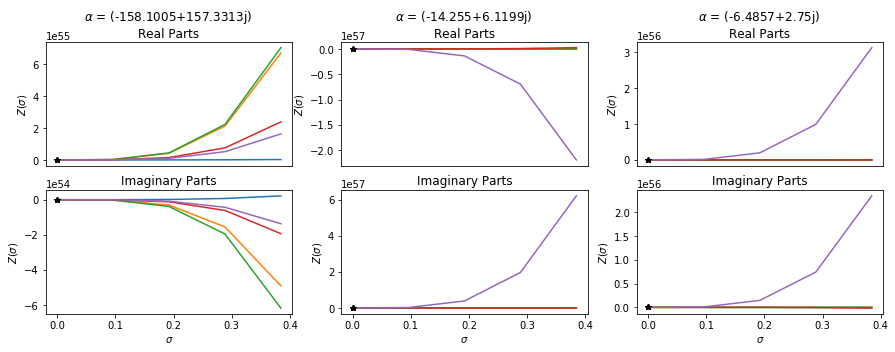

### $\lambda$ = (222.5+0j)

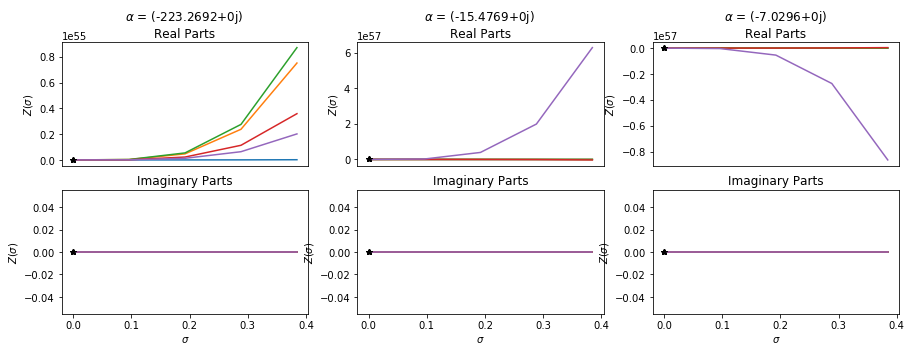

### $\lambda$ = (157.3313+157.3313j)

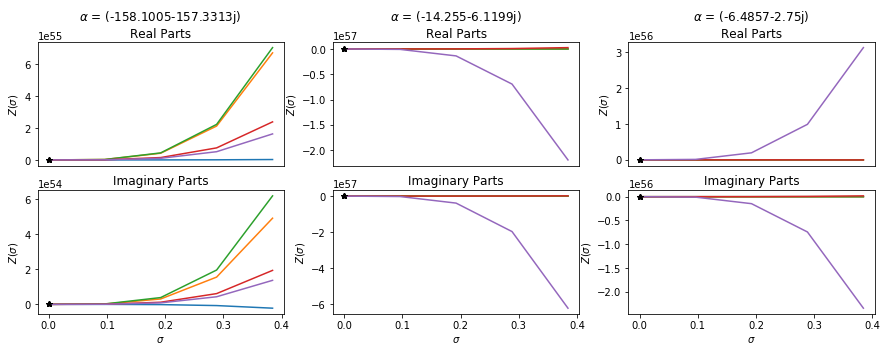

### $\lambda$ = 222.5j

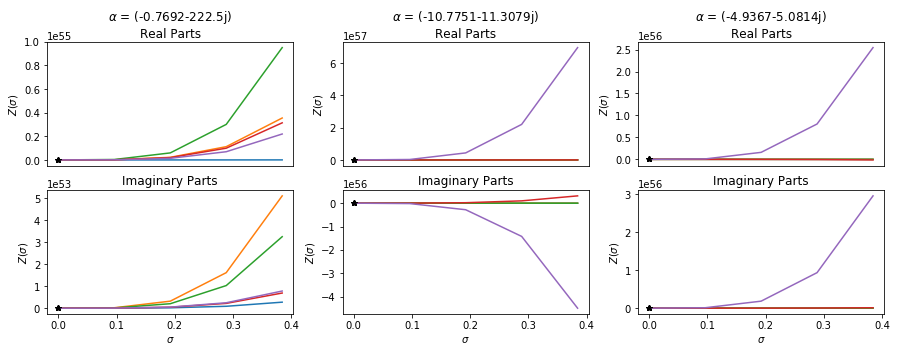

# $\Lambda$ = 123.4

### $\lambda$ = -123.4j

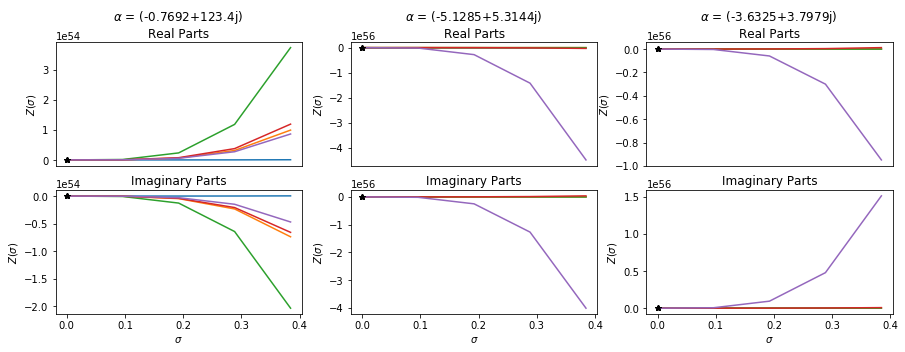

### $\lambda$ = (87.257-87.257j)

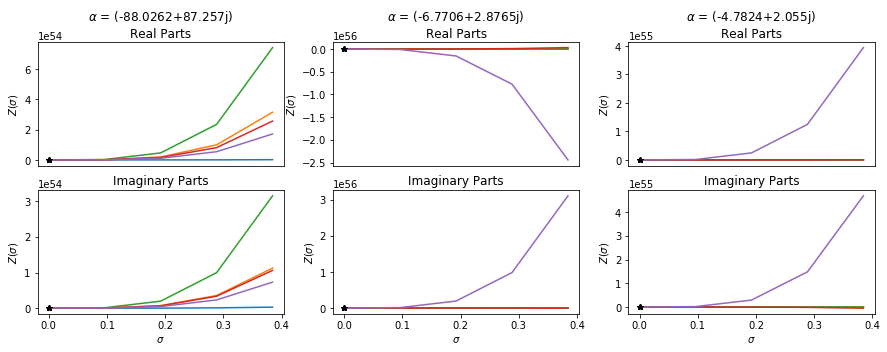

### $\lambda$ = (123.4+0j)

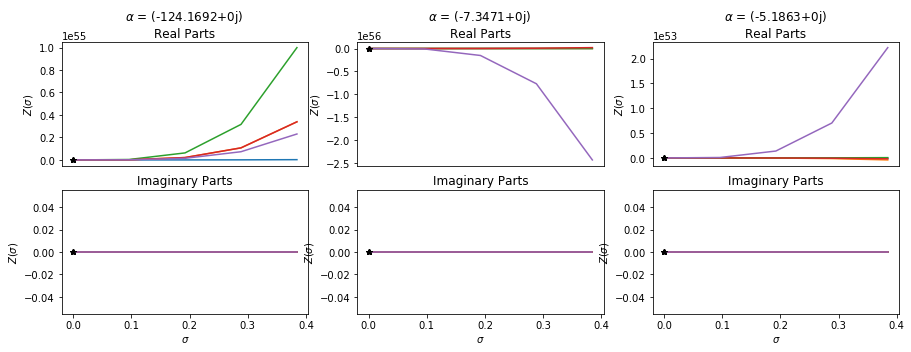

### $\lambda$ = (87.257+87.257j)

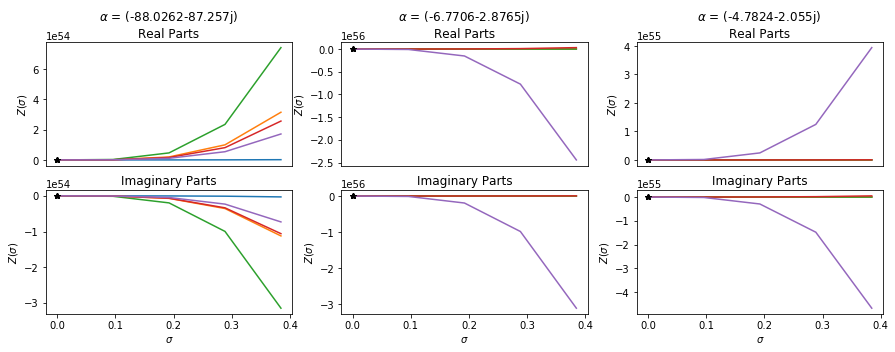

### $\lambda$ = 123.4j

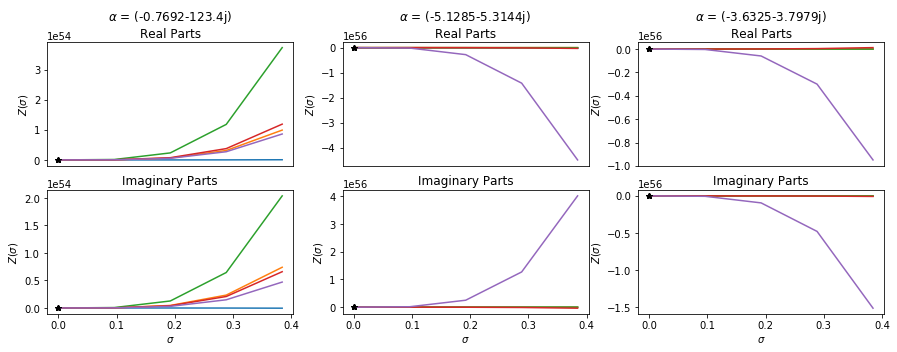

# $\Lambda$ = 111.5

### $\lambda$ = -111.5j

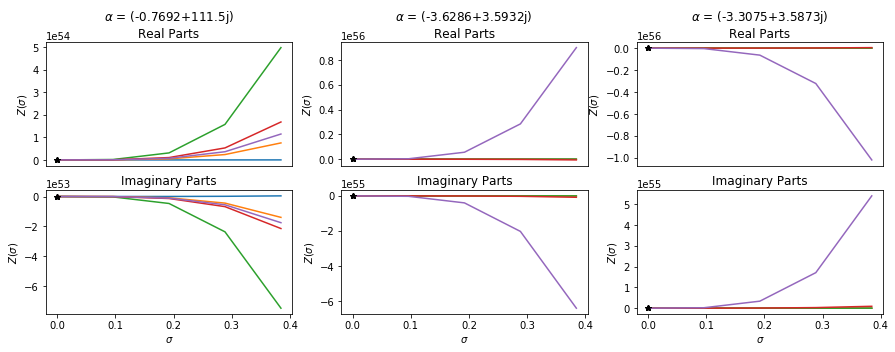

### $\lambda$ = (78.8424-78.8424j)

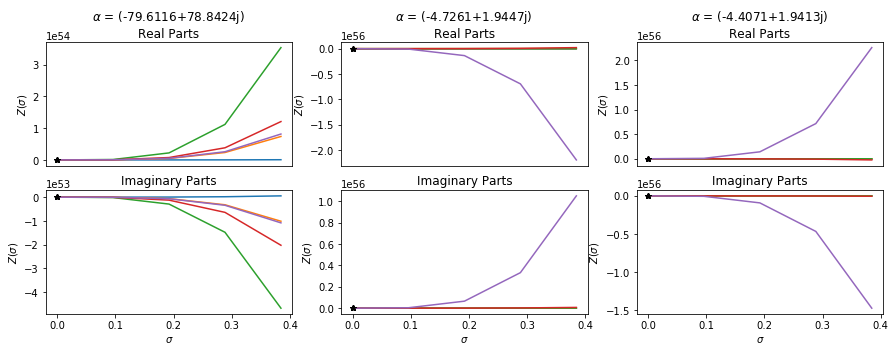

### $\lambda$ = (111.5+0j)

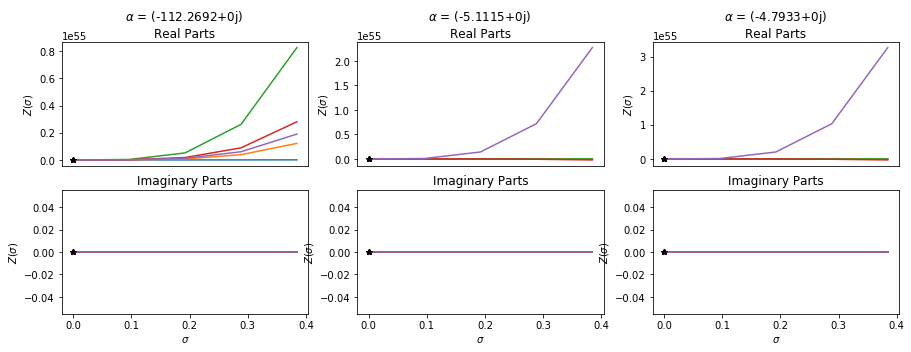

### $\lambda$ = (78.8424+78.8424j)

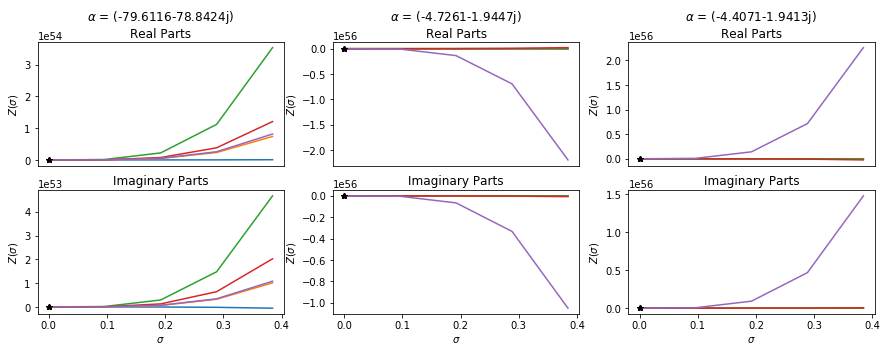

### $\lambda$ = 111.5j

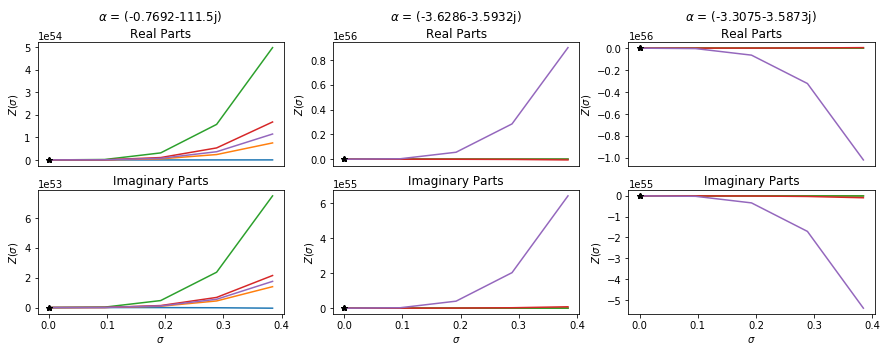

# $\Lambda$ = 198.4

### $\lambda$ = -198.4j

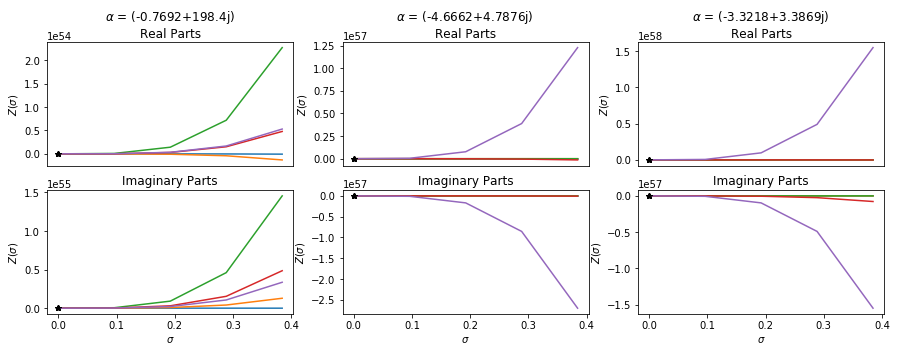

### $\lambda$ = (140.29-140.29j)

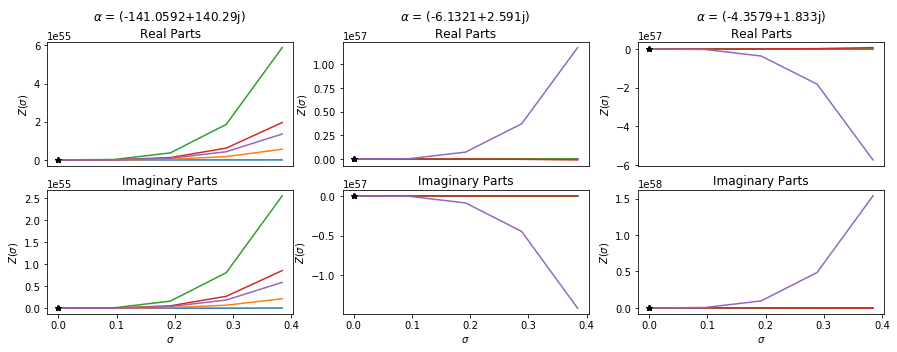

### $\lambda$ = (198.4+0j)

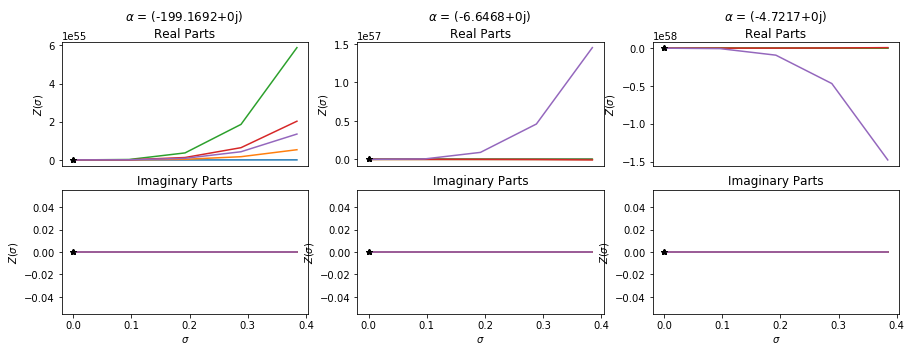

### $\lambda$ = (140.29+140.29j)

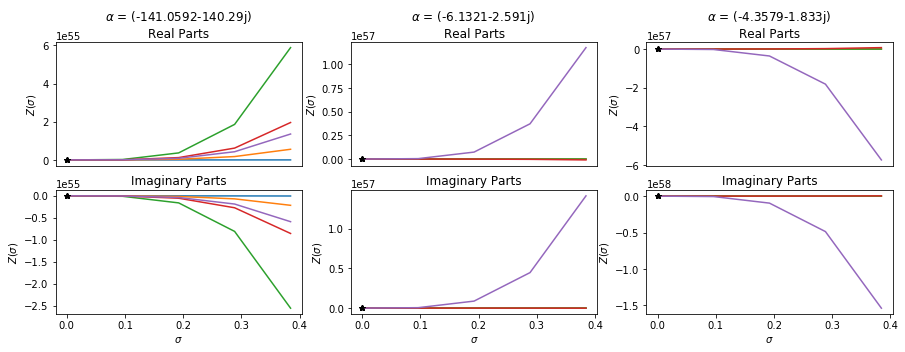

### $\lambda$ = 198.4j

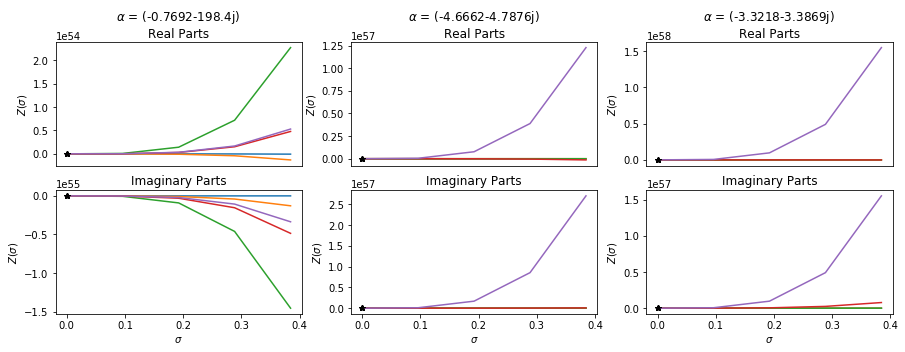

# $\Lambda$ = 449.8

### $\lambda$ = -449.8j

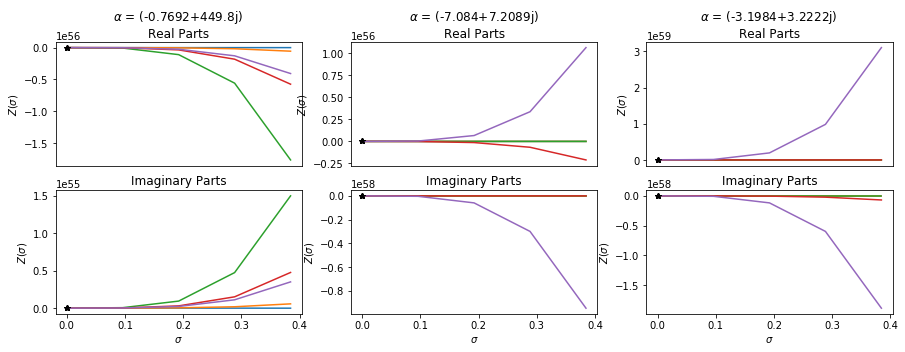

### $\lambda$ = (318.0566-318.0566j)

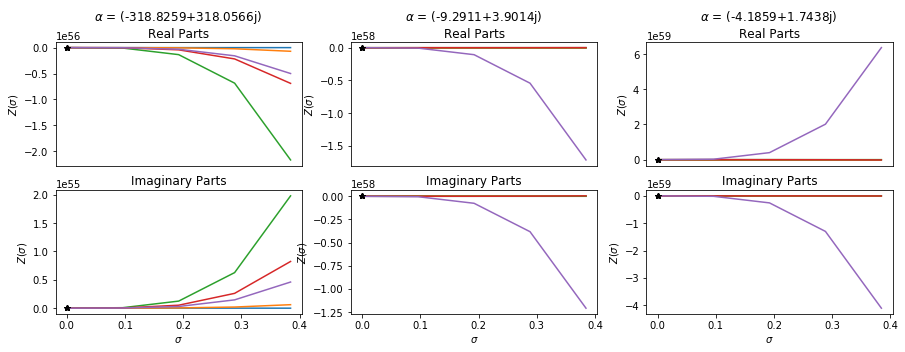

### $\lambda$ = (449.8+0j)

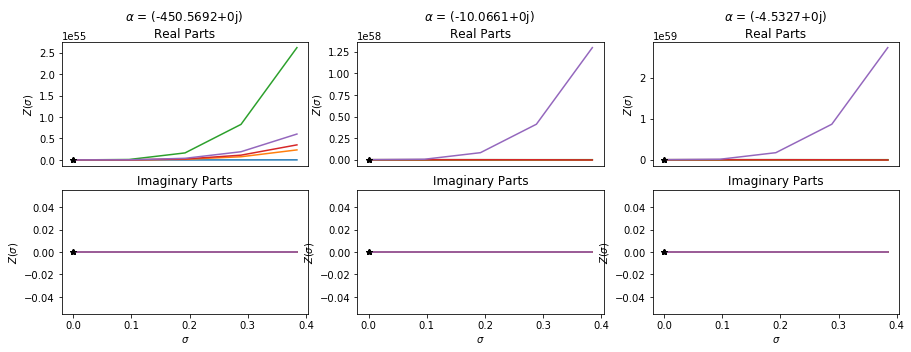

### $\lambda$ = (318.0566+318.0566j)

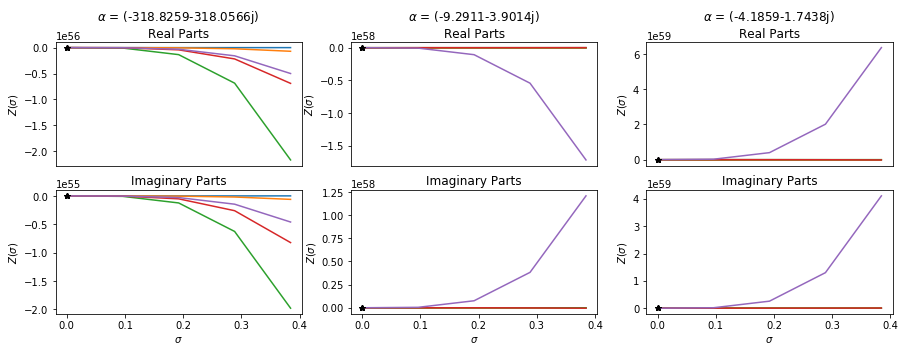

### $\lambda$ = 449.8j

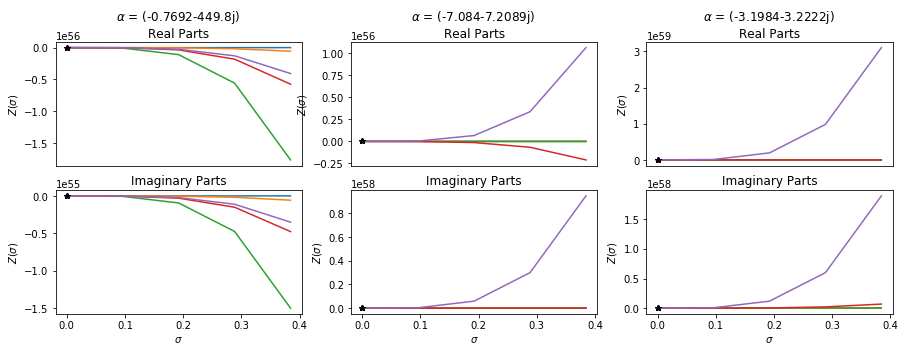

# $\Lambda$ = 226.8

### $\lambda$ = -226.8j

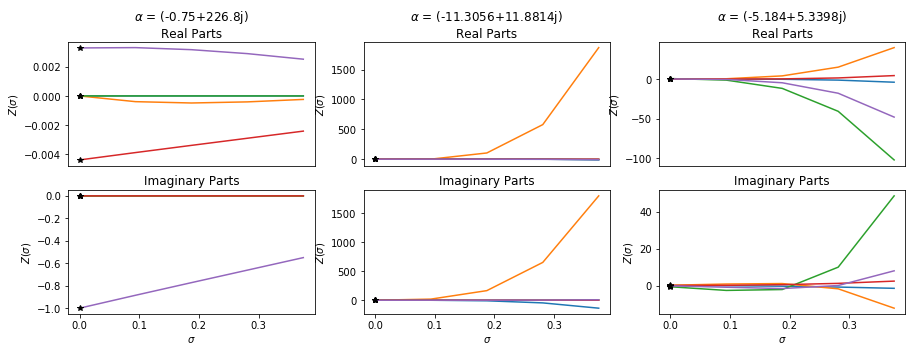

### $\lambda$ = (160.3718-160.3718j)

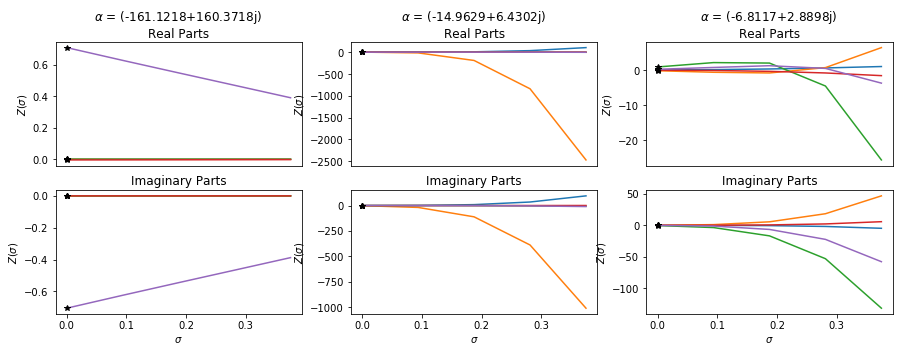

### $\lambda$ = (226.8+0j)

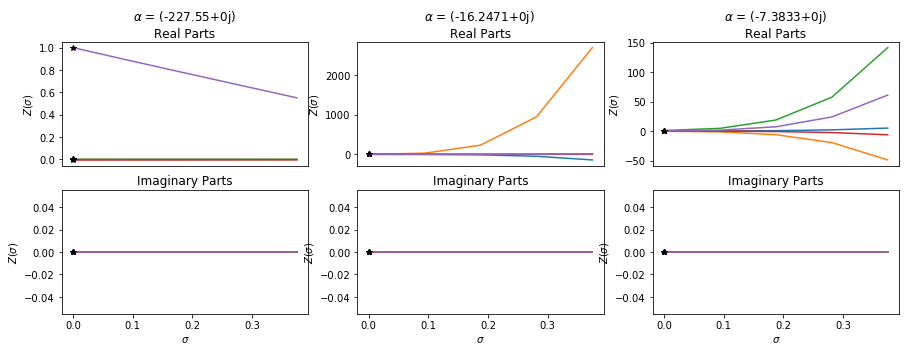

### $\lambda$ = (160.3718+160.3718j)

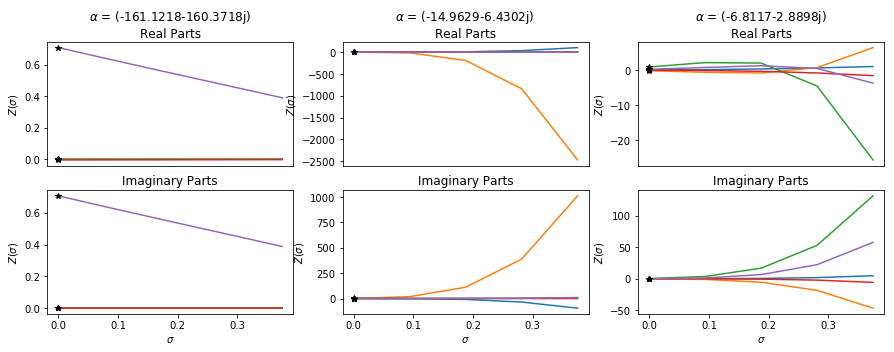

### $\lambda$ = 226.8j

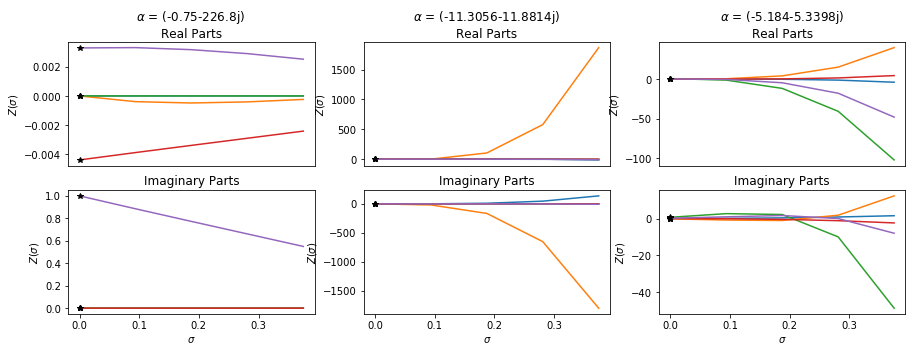

# $\Lambda$ = 114.3

### $\lambda$ = -114.3j

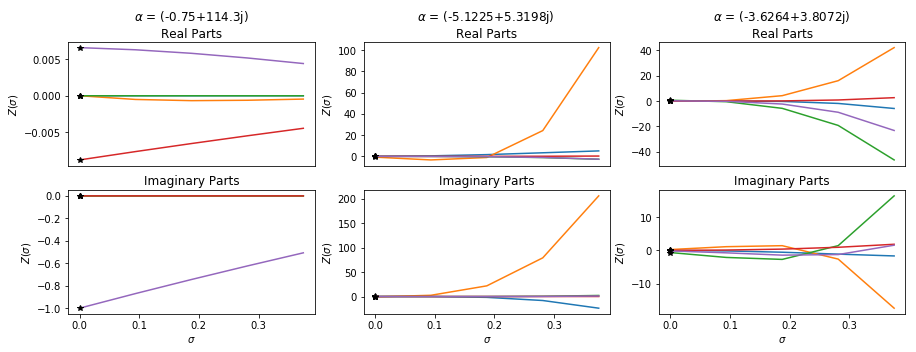

### $\lambda$ = (80.8223-80.8223j)

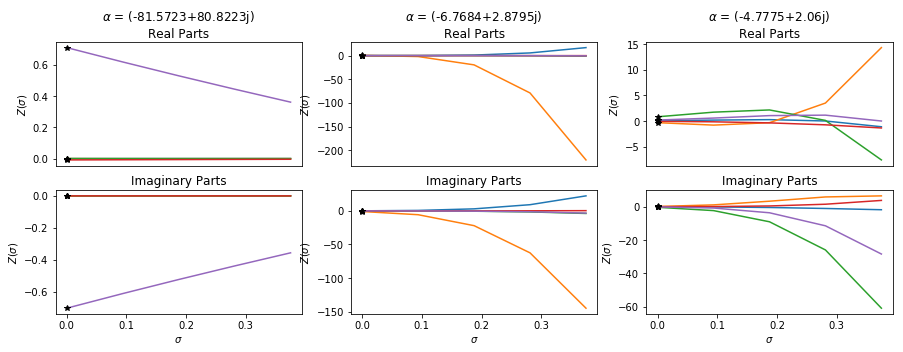

### $\lambda$ = (114.3+0j)

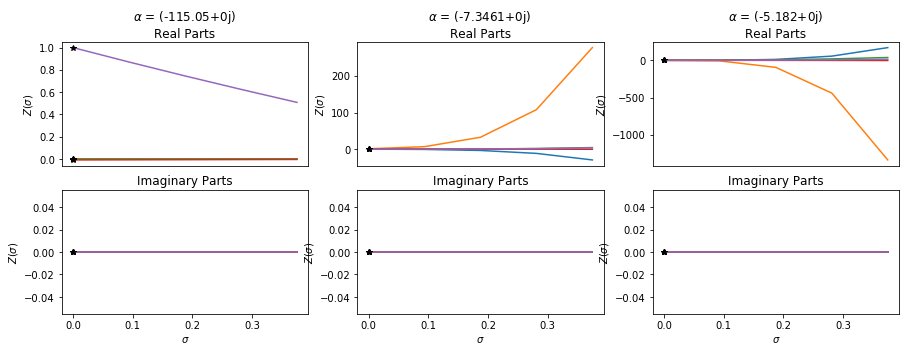

### $\lambda$ = (80.8223+80.8223j)

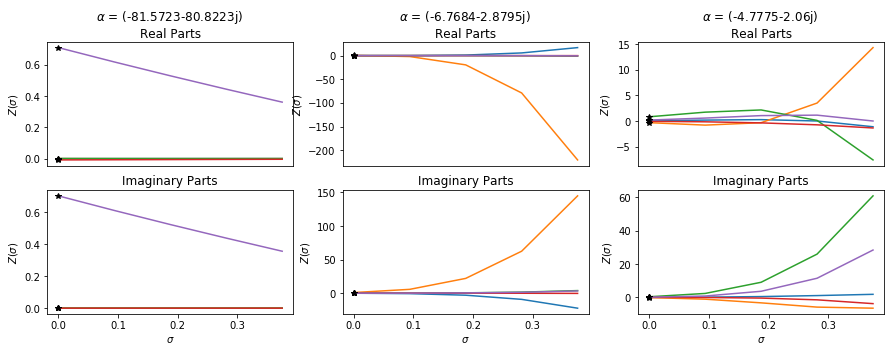

### $\lambda$ = 114.3j

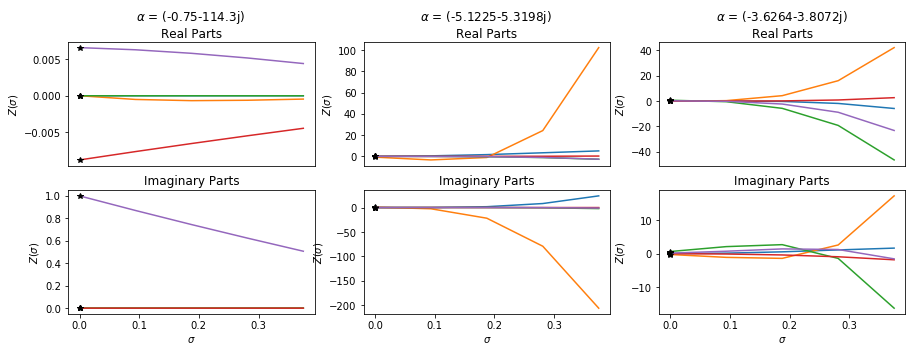

# $\Lambda$ = 100.4

### $\lambda$ = -100.4j

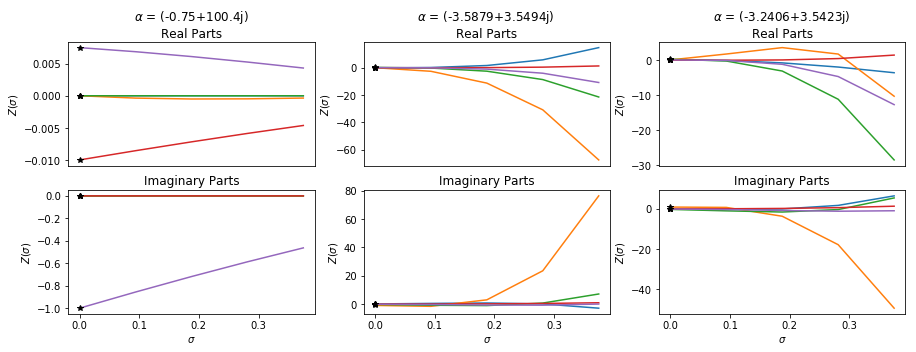

### $\lambda$ = (70.9935-70.9935j)

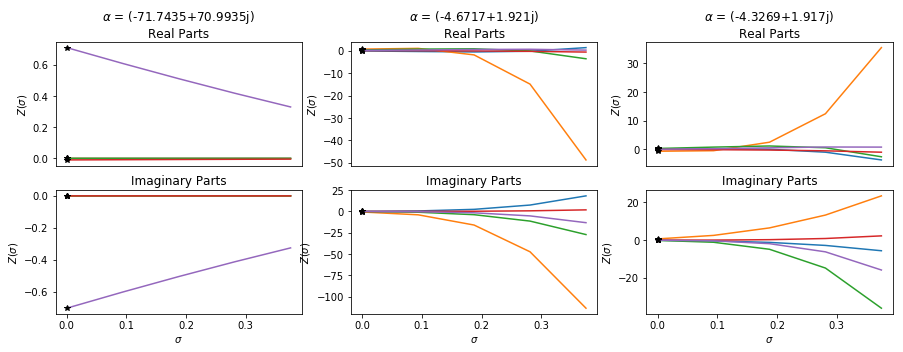

### $\lambda$ = (100.4+0j)

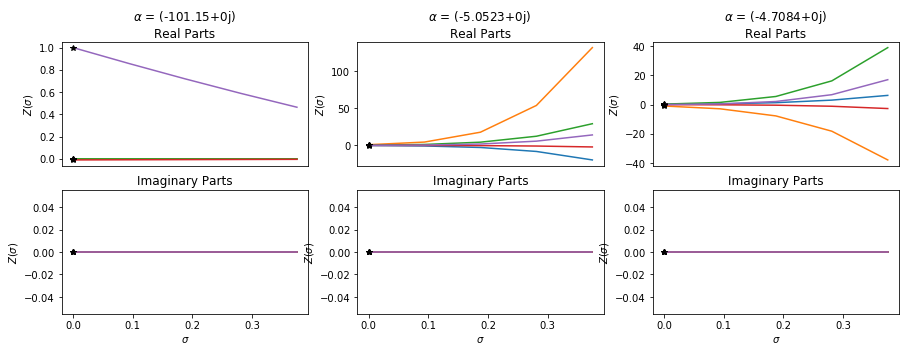

### $\lambda$ = (70.9935+70.9935j)

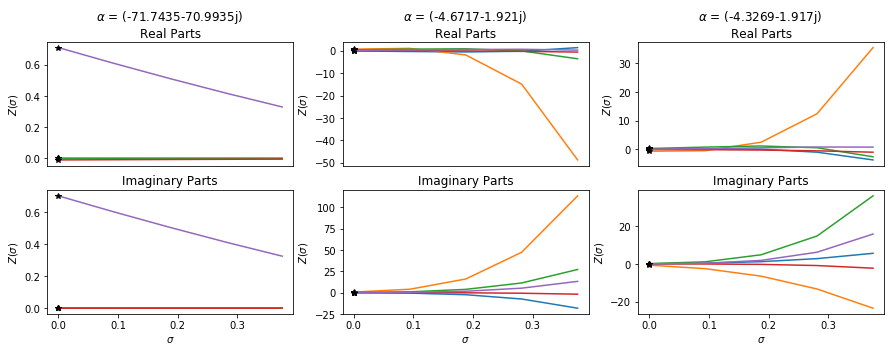

### $\lambda$ = 100.4j

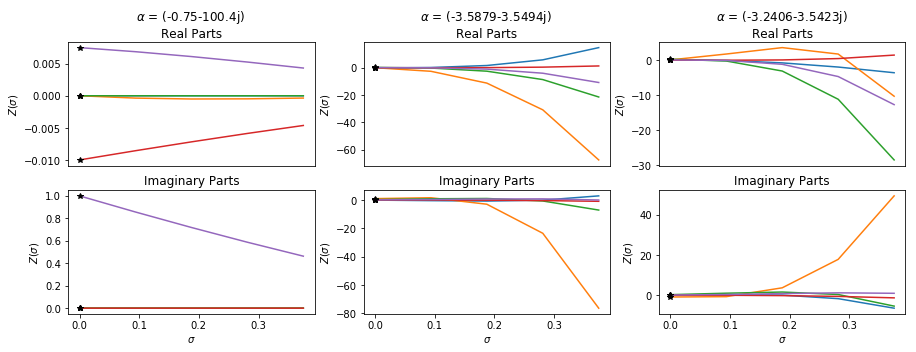

# $\Lambda$ = 175.3

### $\lambda$ = -175.3j

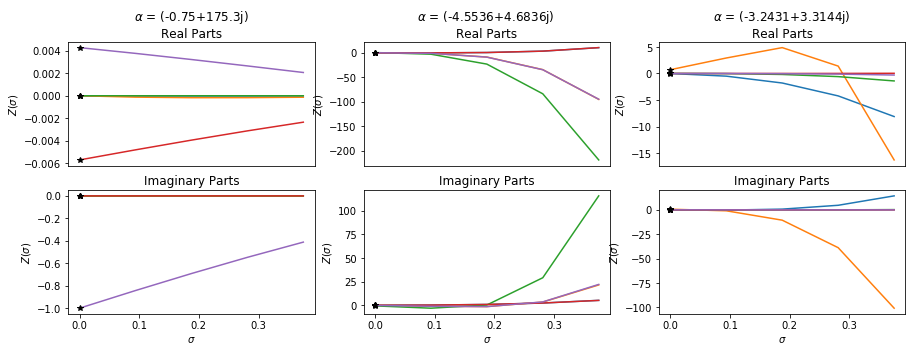

### $\lambda$ = (123.9558-123.9558j)

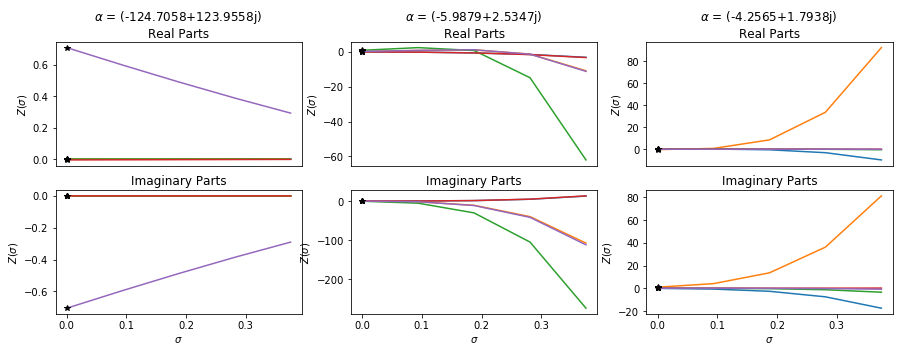

### $\lambda$ = (175.3+0j)

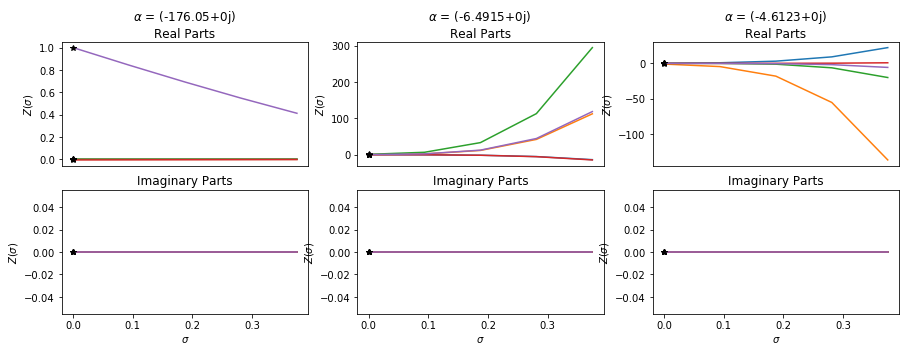

### $\lambda$ = (123.9558+123.9558j)

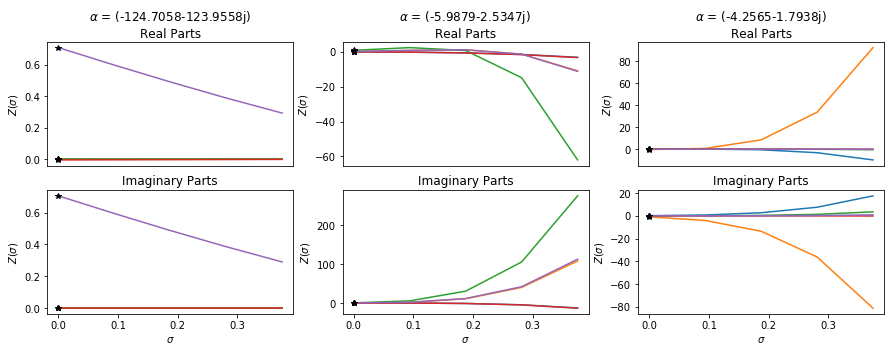

### $\lambda$ = 175.3j

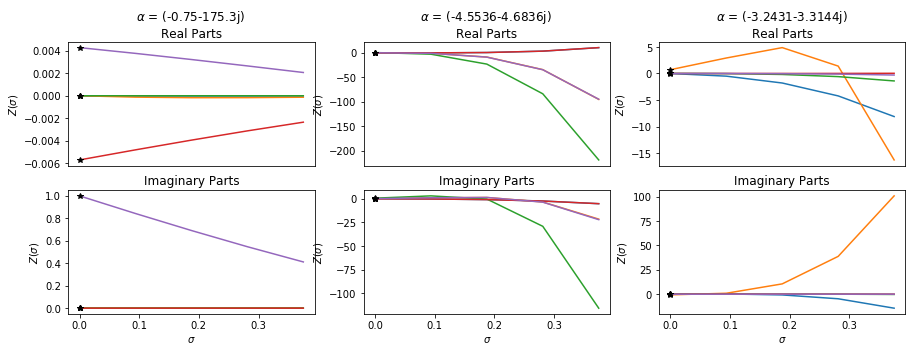

# $\Lambda$ = 391.3

### $\lambda$ = -391.3j

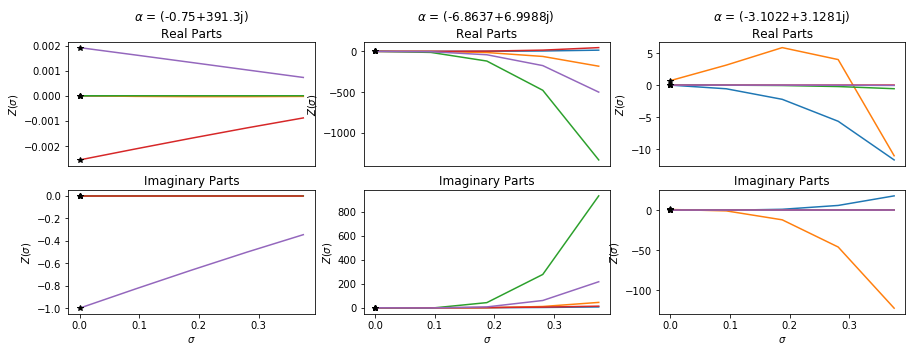

### $\lambda$ = (276.6909-276.6909j)

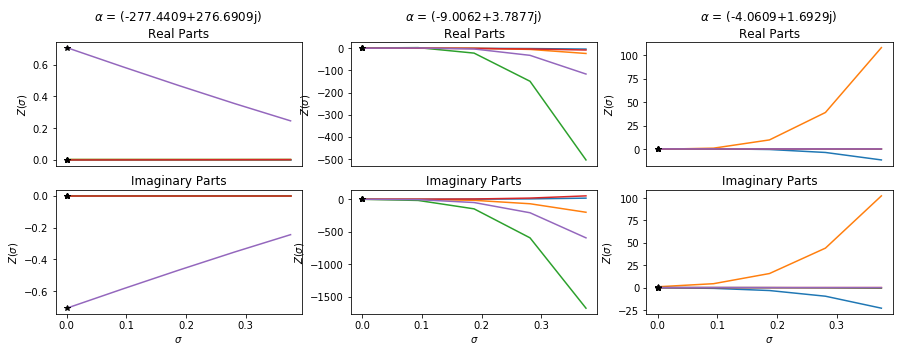

### $\lambda$ = (391.3+0j)

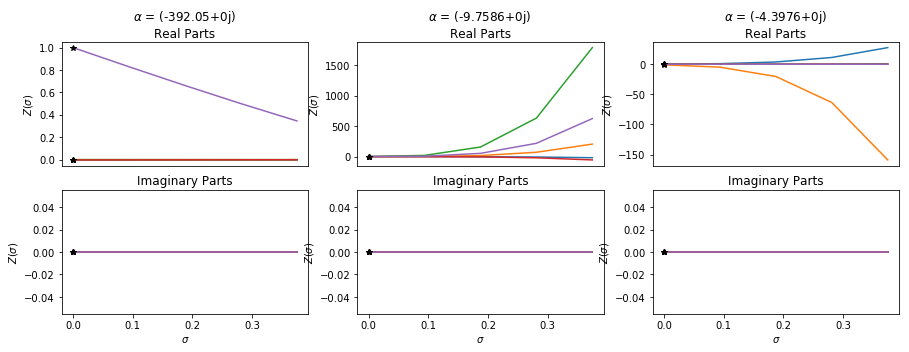

### $\lambda$ = (276.6909+276.6909j)

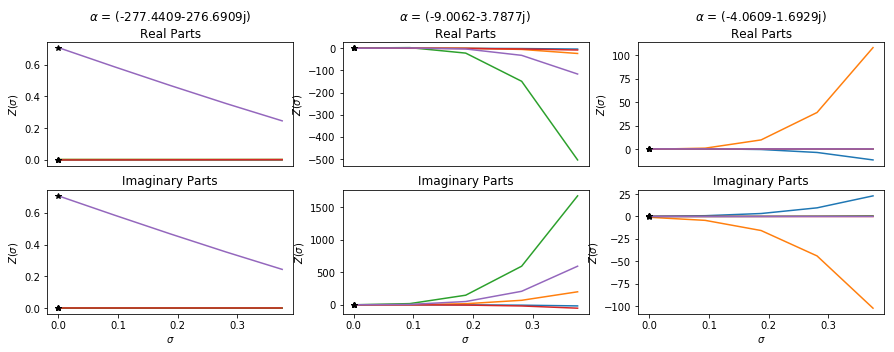

### $\lambda$ = 391.3j

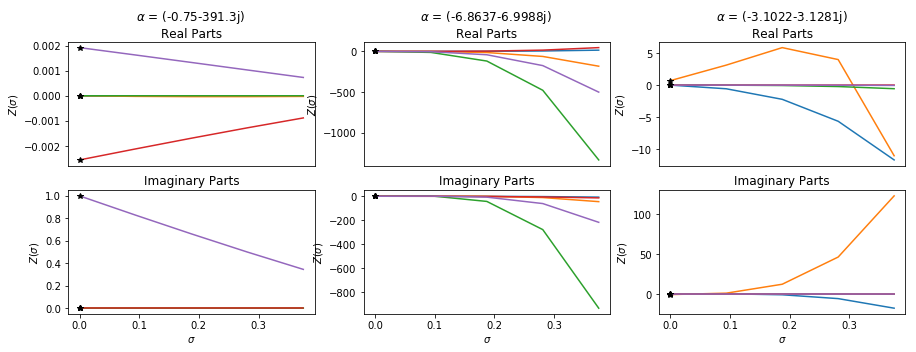

# $\Lambda$ = 236.5

### $\lambda$ = -236.5j

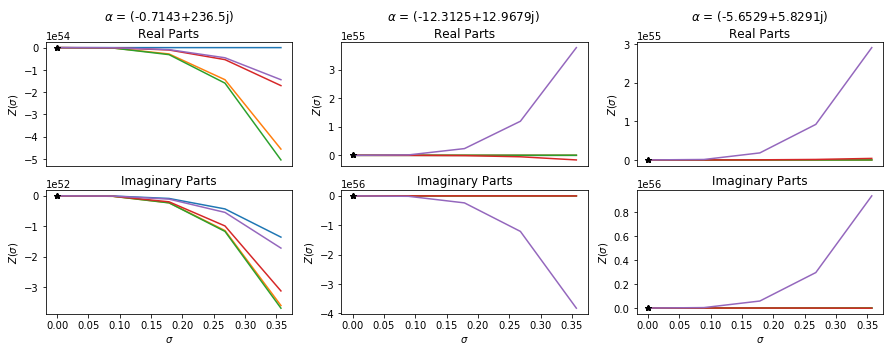

### $\lambda$ = (167.2308-167.2308j)

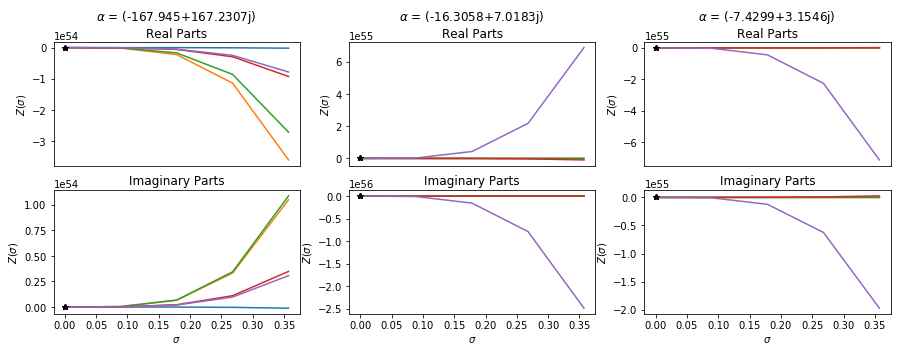

### $\lambda$ = (236.5+0j)

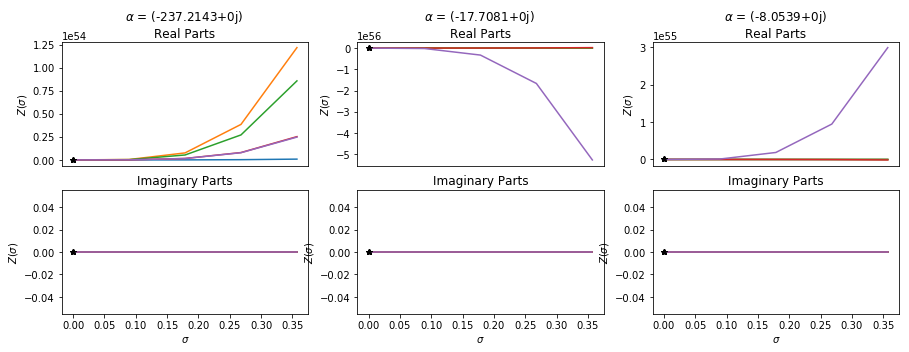

### $\lambda$ = (167.2308+167.2308j)

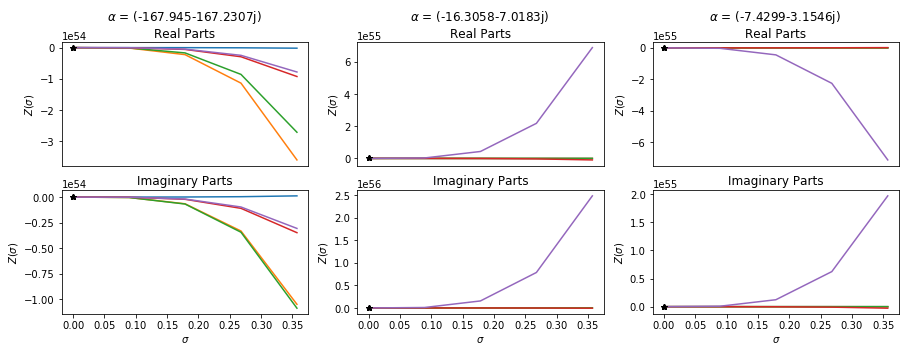

### $\lambda$ = 236.5j

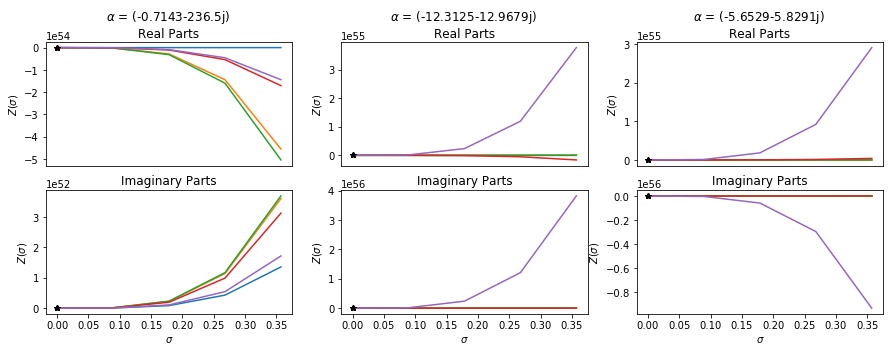

# $\Lambda$ = 103.9

### $\lambda$ = -103.9j

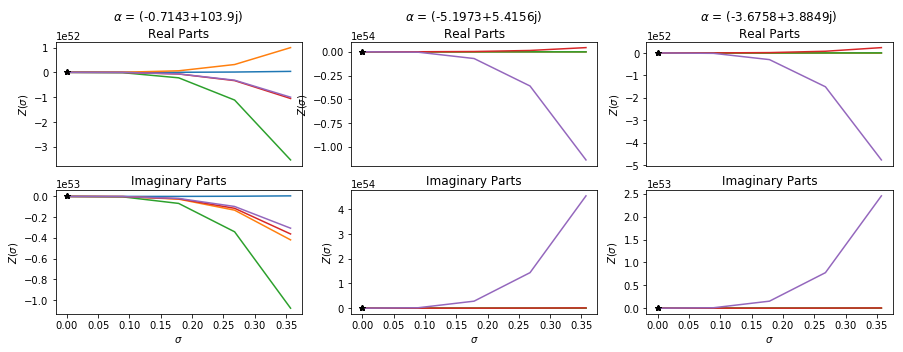

### $\lambda$ = (73.4684-73.4684j)

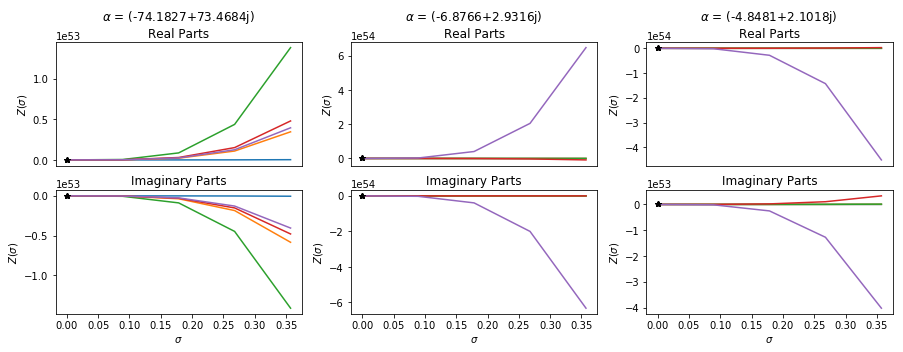

### $\lambda$ = (103.9+0j)

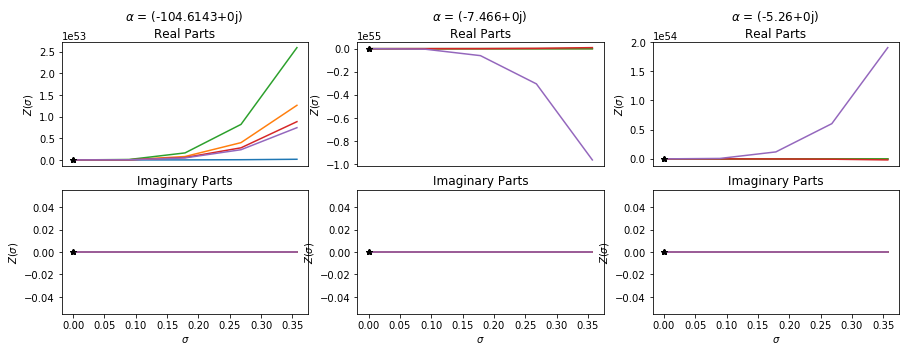

### $\lambda$ = (73.4684+73.4684j)

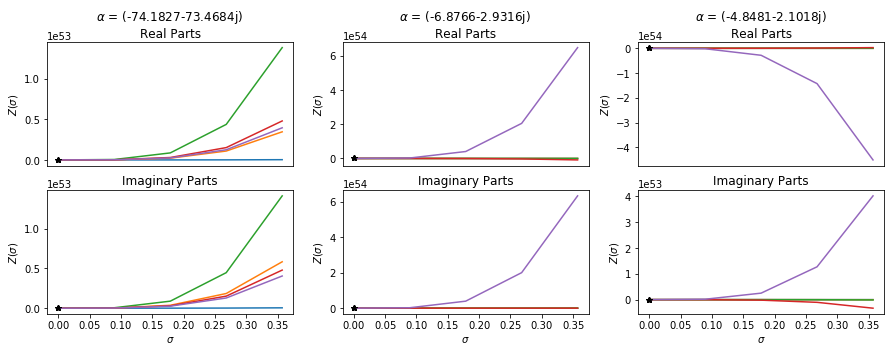

### $\lambda$ = 103.9j

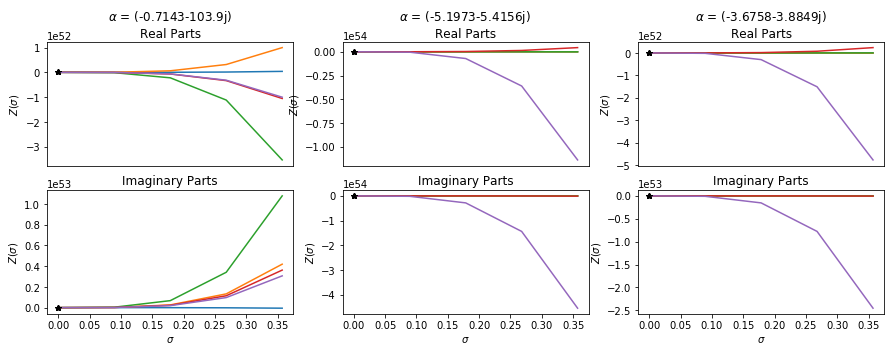

# $\Lambda$ = 85.3

### $\lambda$ = -85.3j

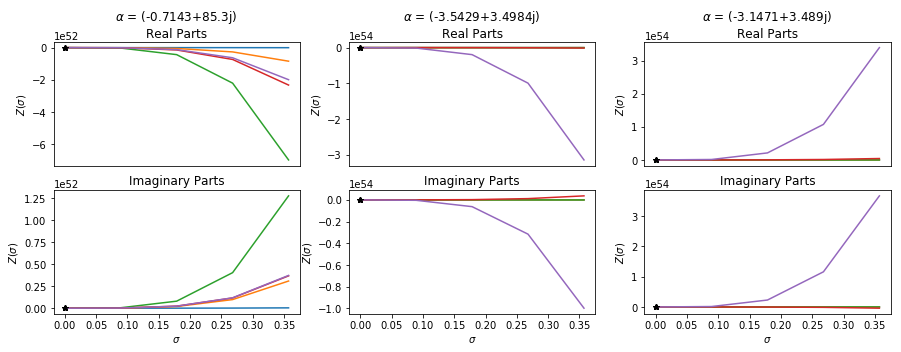

### $\lambda$ = (60.3162-60.3162j)

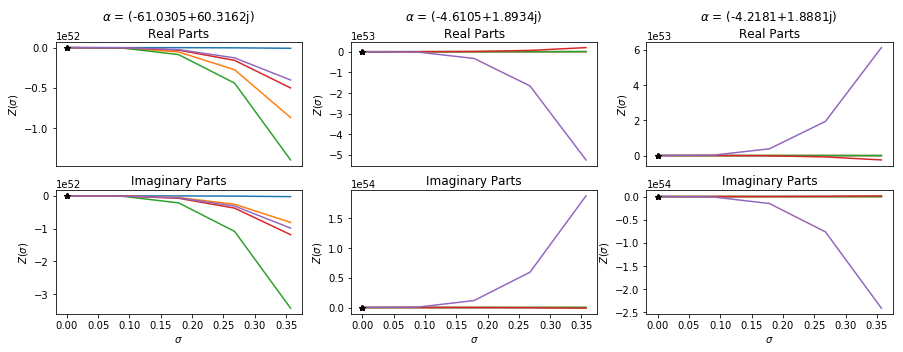

### $\lambda$ = (85.3+0j)

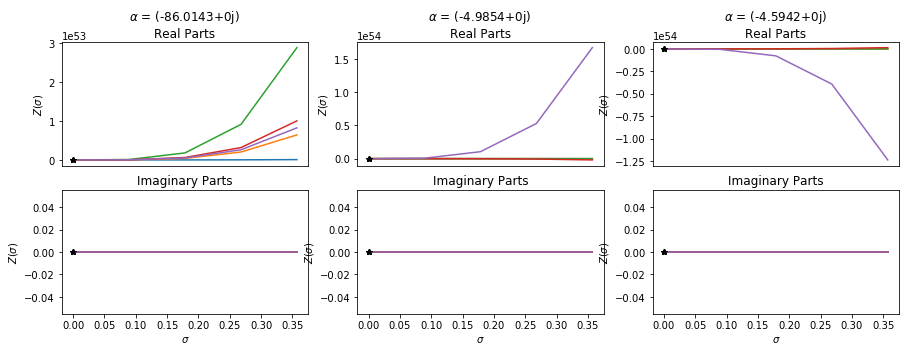

### $\lambda$ = (60.3162+60.3162j)

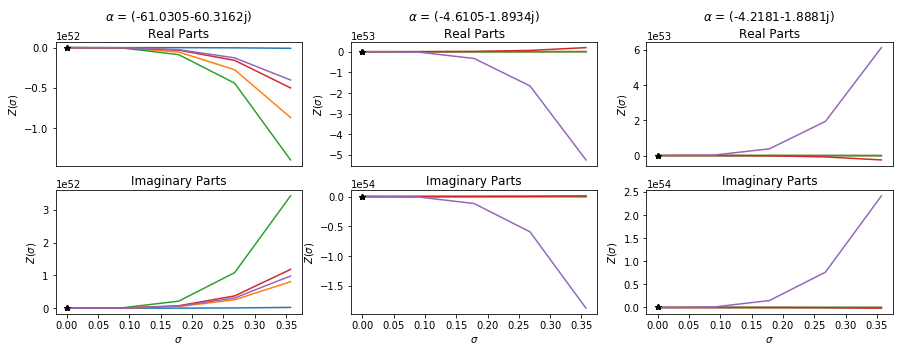

### $\lambda$ = 85.3j

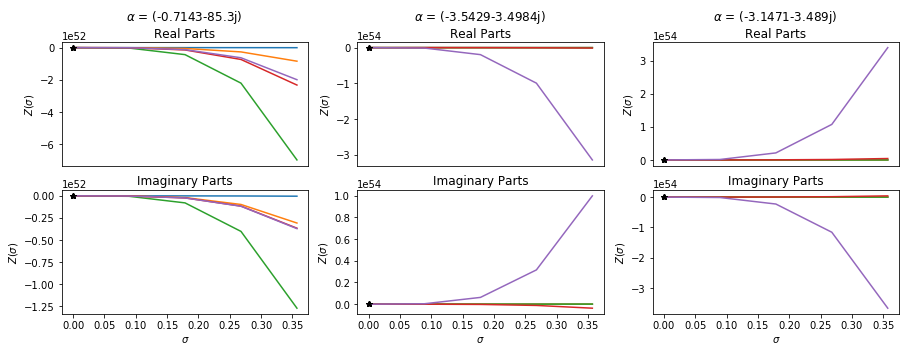

# $\Lambda$ = 142.6

### $\lambda$ = -142.6j

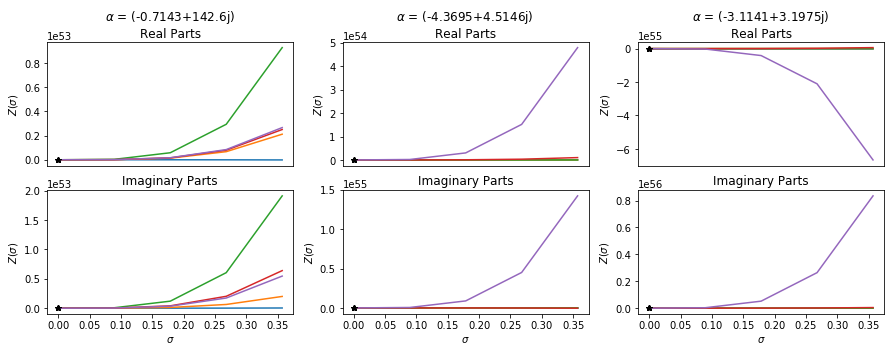

### $\lambda$ = (100.8334-100.8334j)

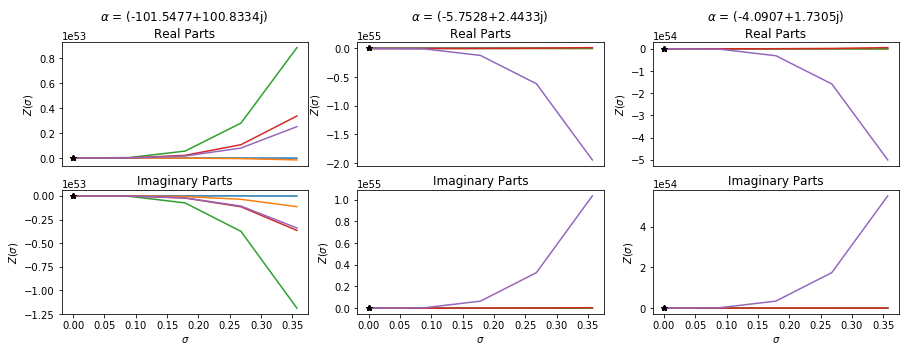

### $\lambda$ = (142.6+0j)

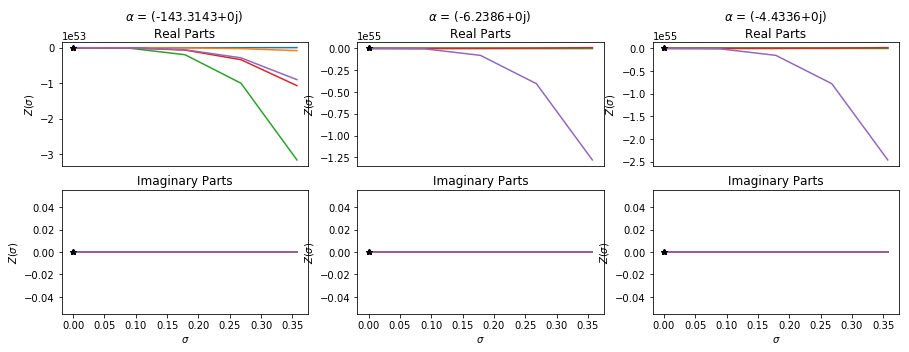

### $\lambda$ = (100.8334+100.8334j)

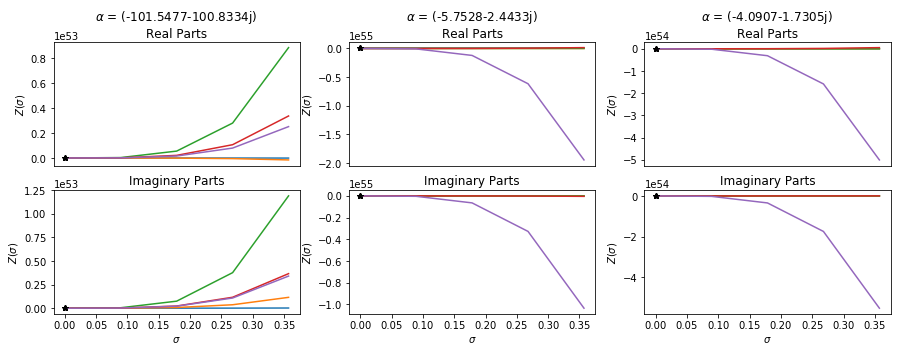

### $\lambda$ = 142.6j

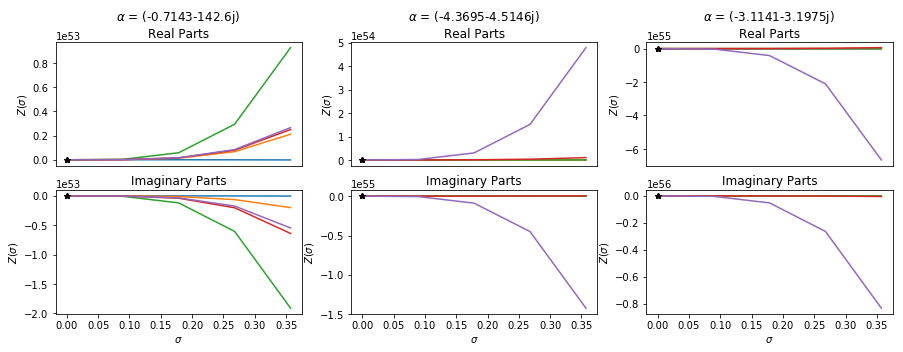

# $\Lambda$ = 307.1

### $\lambda$ = -307.1j

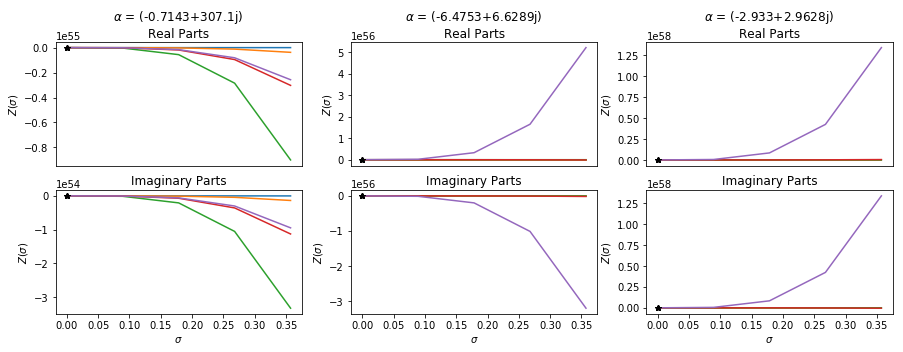

### $\lambda$ = (217.1525-217.1525j)

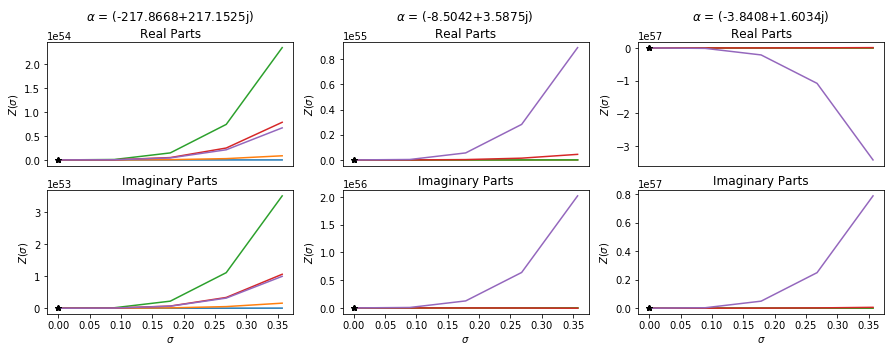

### $\lambda$ = (307.1+0j)

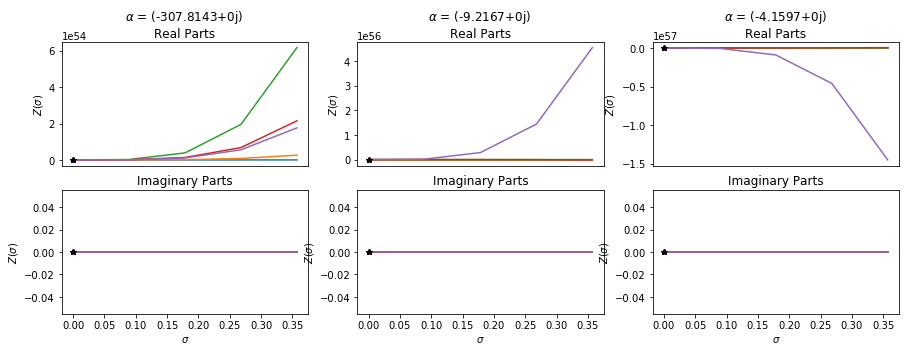

### $\lambda$ = (217.1525+217.1525j)

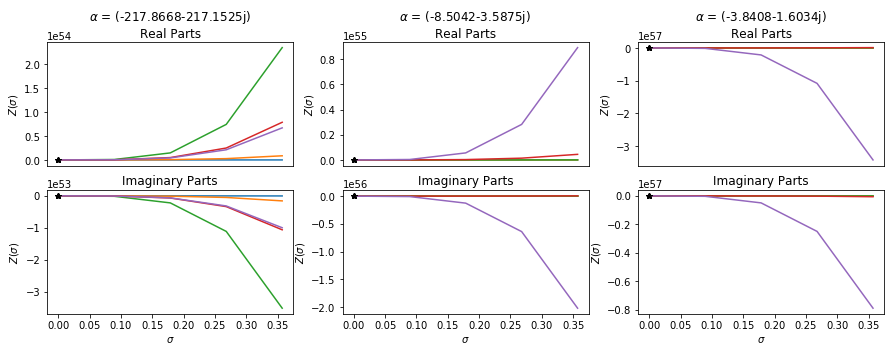

### $\lambda$ = 307.1j

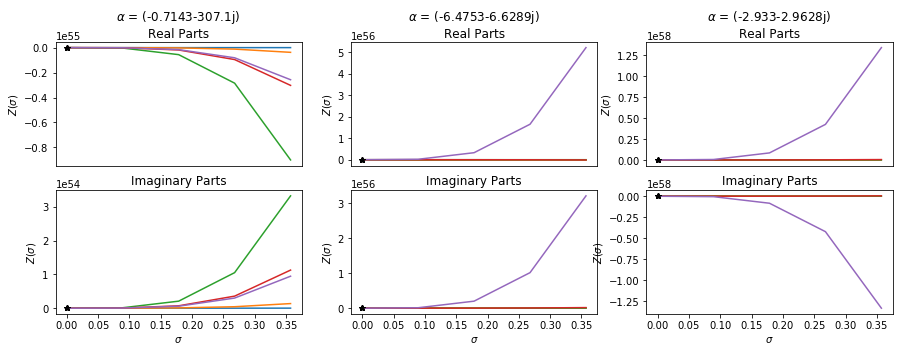

# $\Lambda$ = 253.8

### $\lambda$ = -253.8j

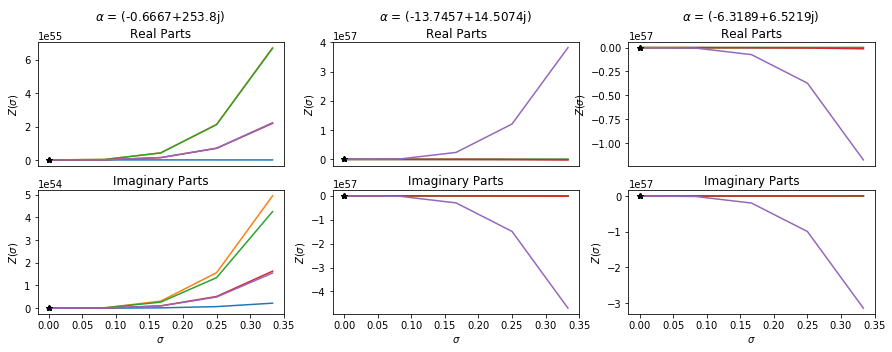

### $\lambda$ = (179.4637-179.4637j)

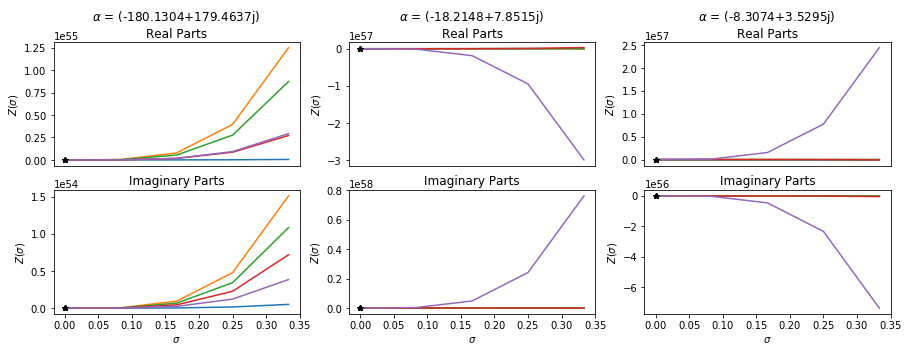

### $\lambda$ = (253.8+0j)

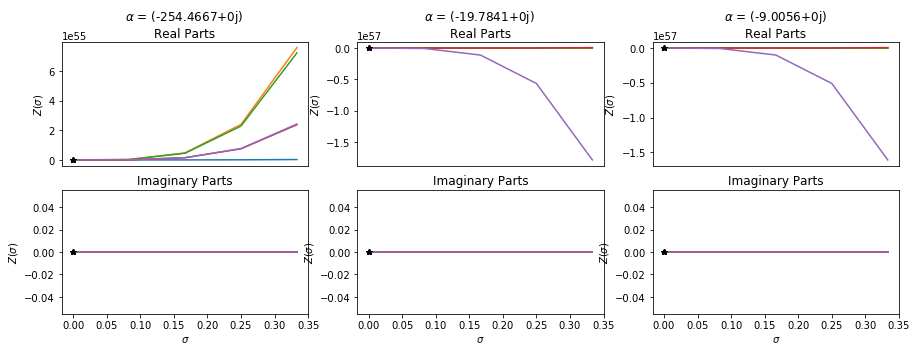

### $\lambda$ = (179.4637+179.4637j)

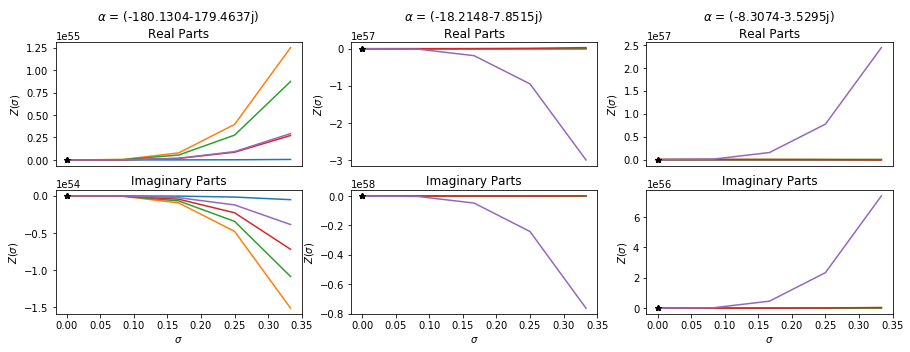

### $\lambda$ = 253.8j

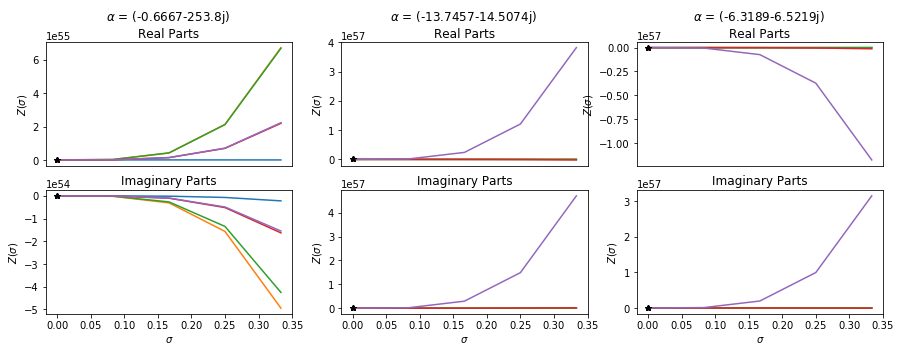

# $\Lambda$ = 100.8

### $\lambda$ = -100.8j

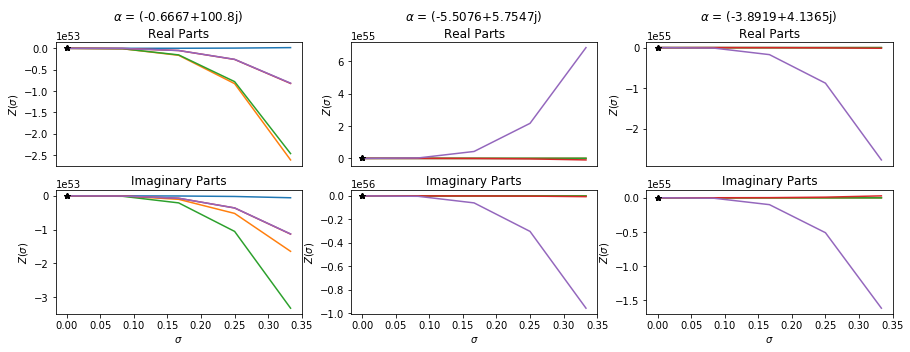

### $\lambda$ = (71.2764-71.2764j)

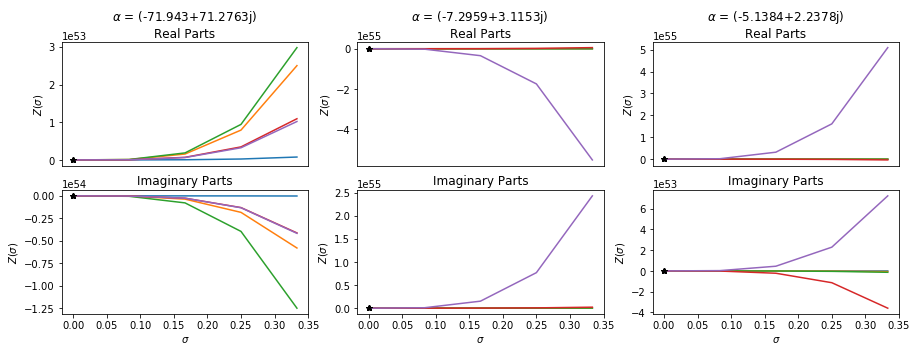

### $\lambda$ = (100.8+0j)

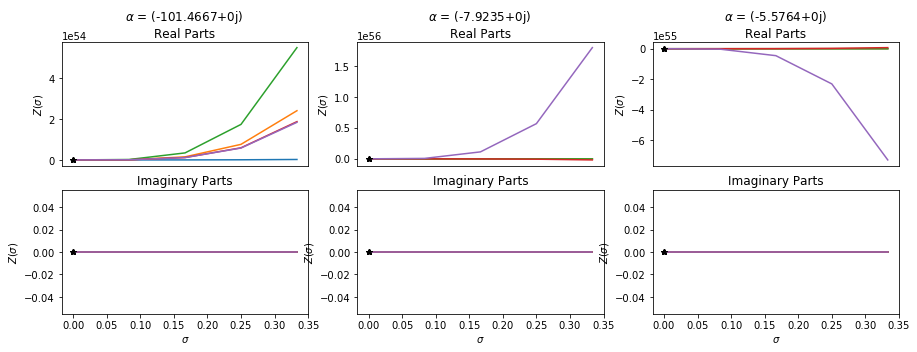

### $\lambda$ = (71.2764+71.2764j)

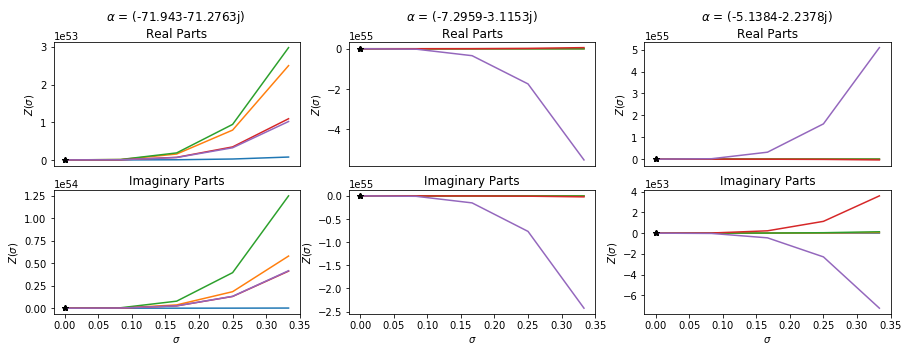

### $\lambda$ = 100.8j

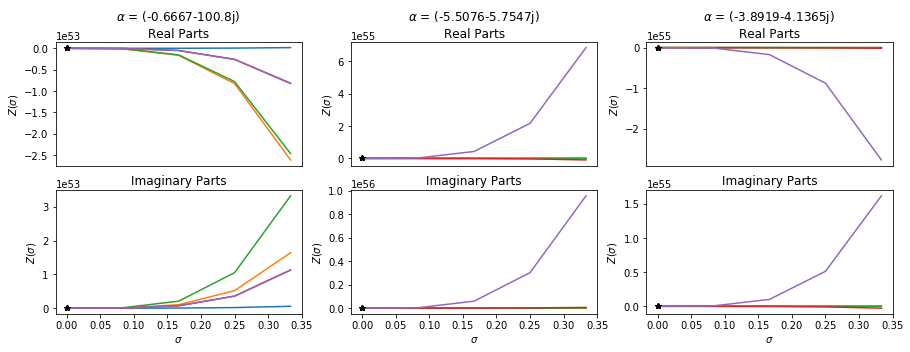

# $\Lambda$ = 73.7

### $\lambda$ = -73.7j

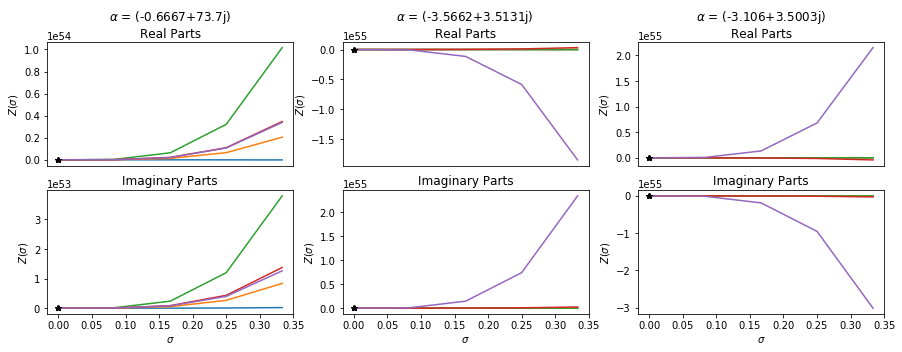

### $\lambda$ = (52.1138-52.1138j)

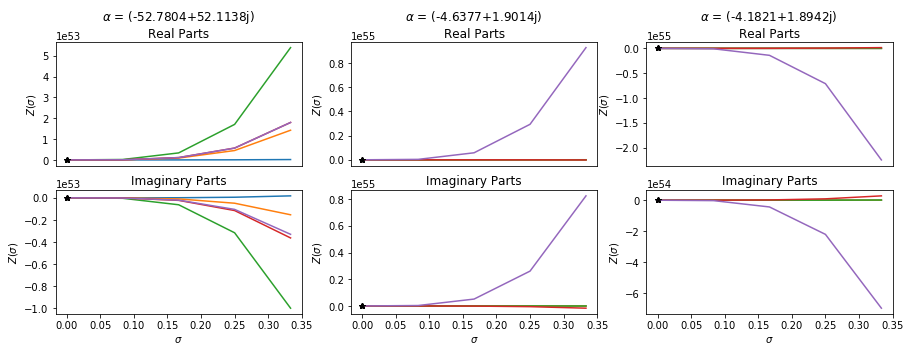

### $\lambda$ = (73.7+0j)

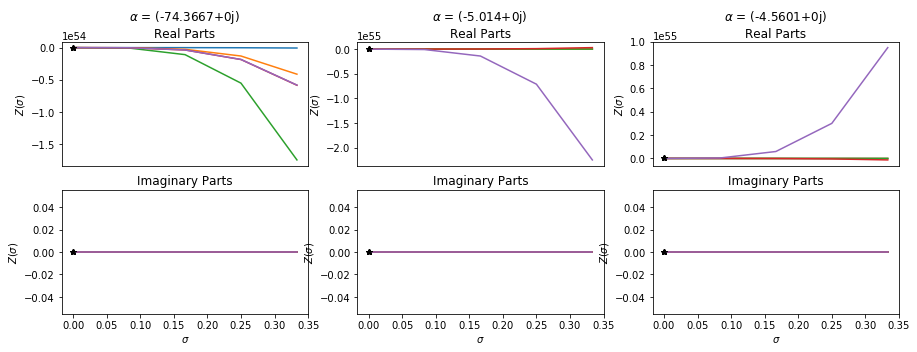

### $\lambda$ = (52.1138+52.1138j)

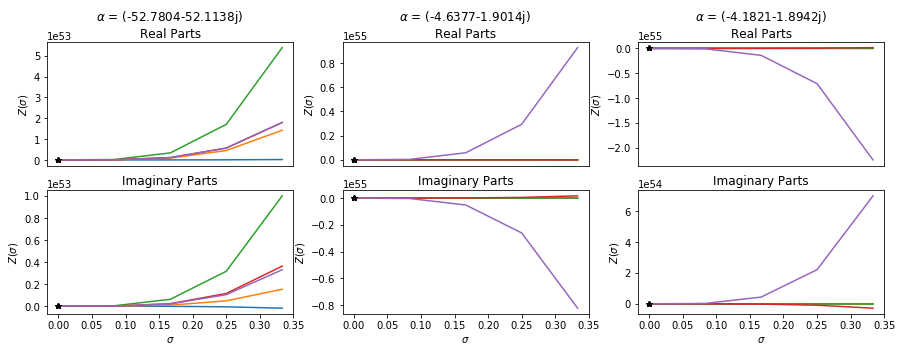

### $\lambda$ = 73.7j

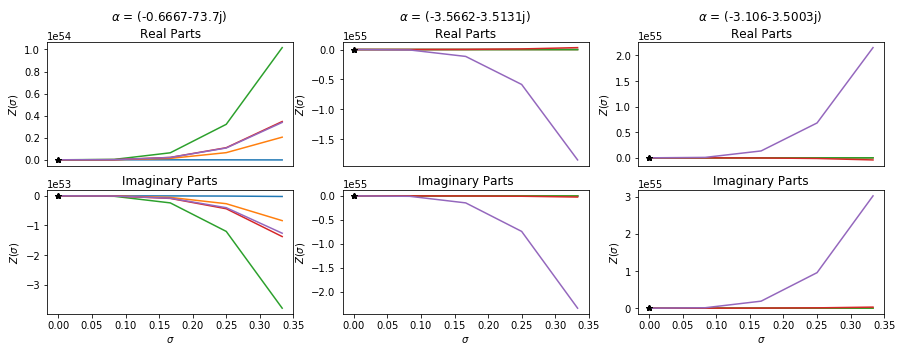

# $\Lambda$ = 113.8

### $\lambda$ = -113.8j

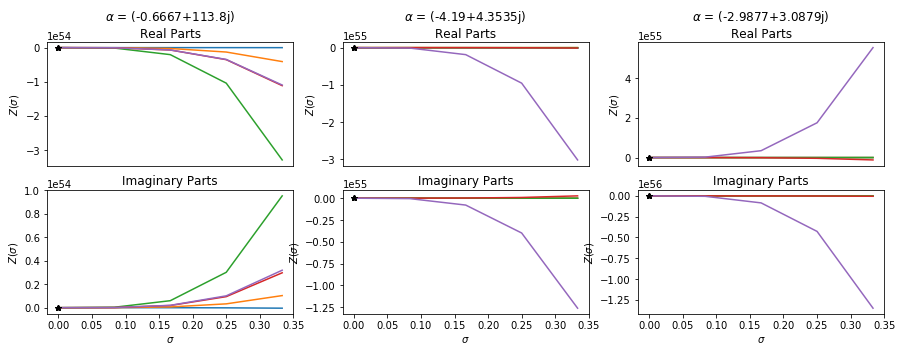

### $\lambda$ = (80.4688-80.4688j)

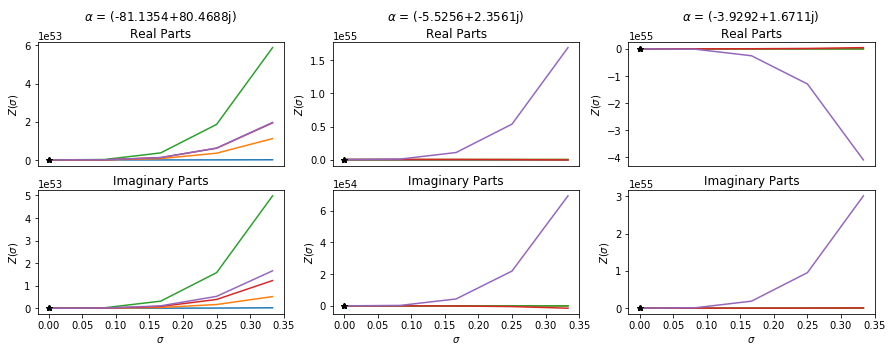

### $\lambda$ = (113.8+0j)

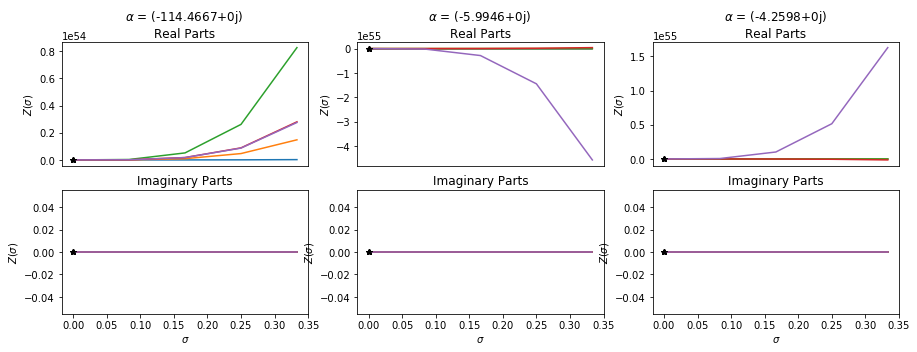

### $\lambda$ = (80.4688+80.4688j)

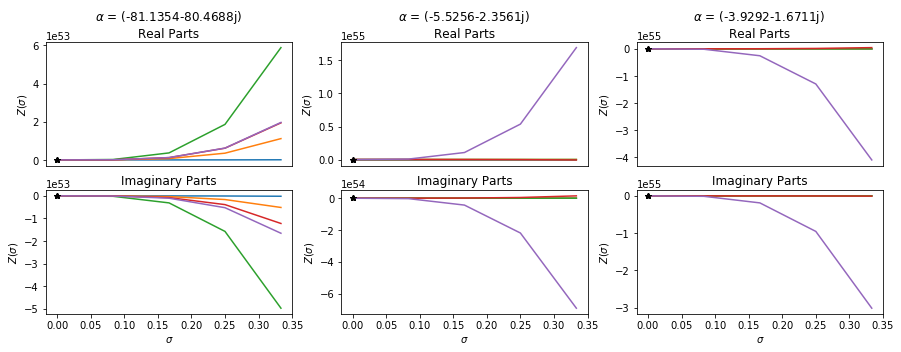

### $\lambda$ = 113.8j

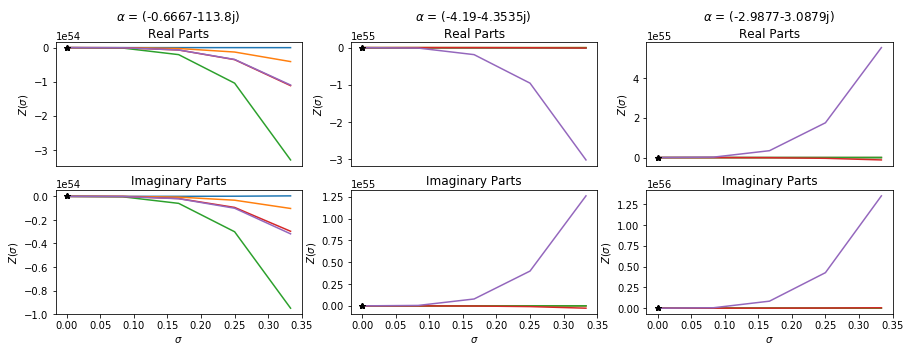

# $\Lambda$ = 229.2

### $\lambda$ = -229.2j

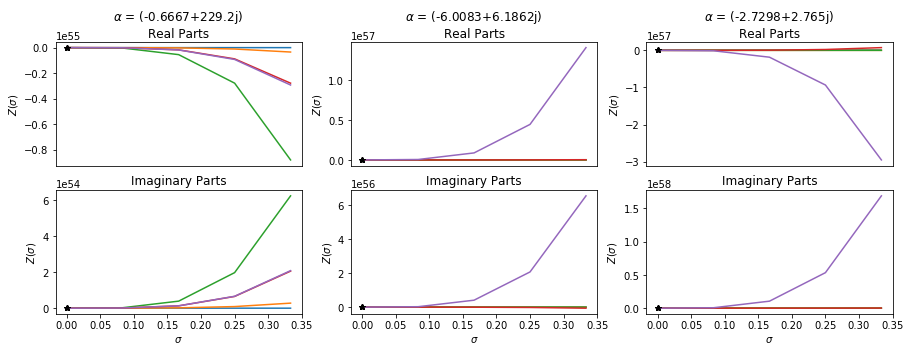

### $\lambda$ = (162.0689-162.0689j)

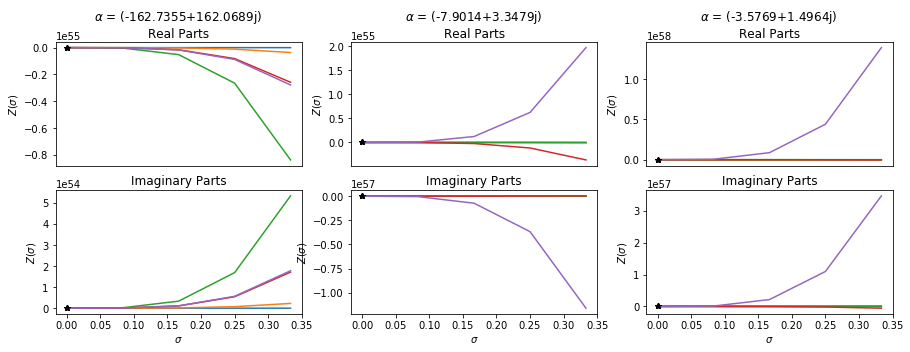

### $\lambda$ = (229.2+0j)

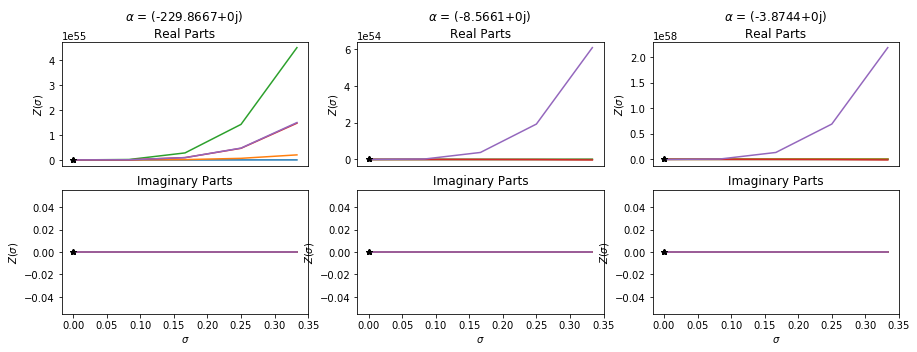

### $\lambda$ = (162.0689+162.0689j)

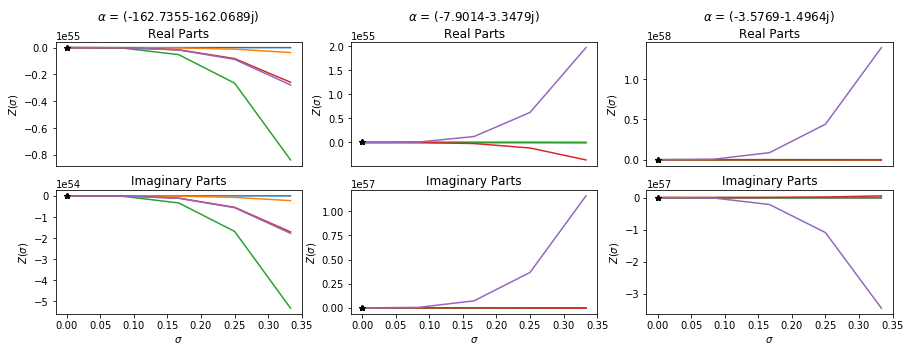

### $\lambda$ = 229.2j

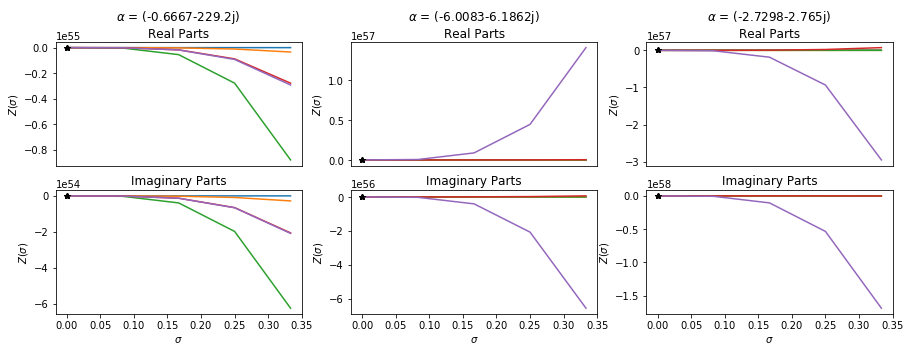

# $\Lambda$ = 274.3

### $\lambda$ = -274.3j

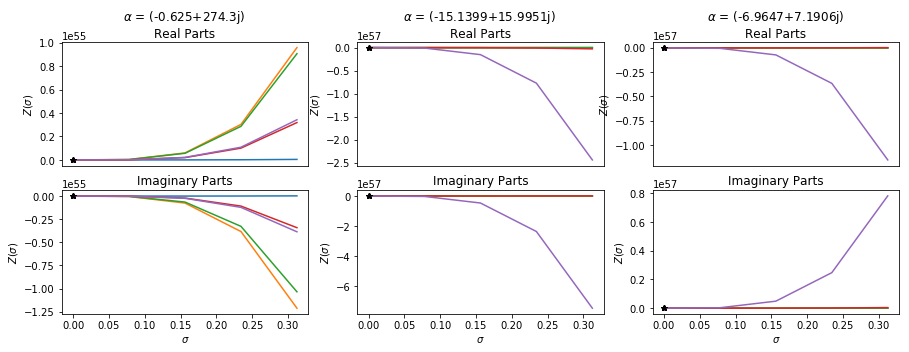

### $\lambda$ = (193.9594-193.9594j)

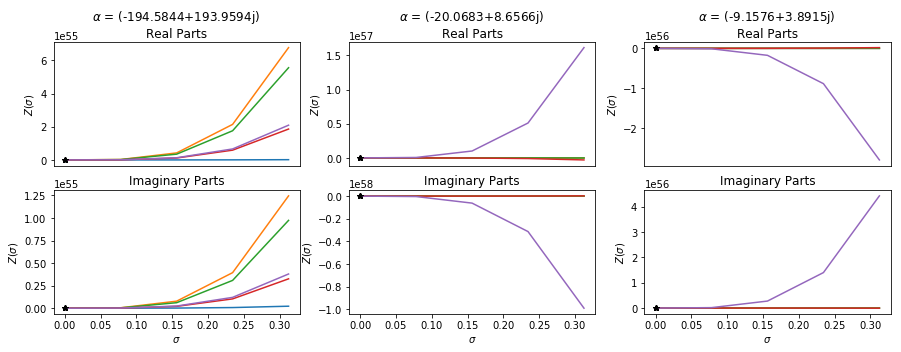

### $\lambda$ = (274.3+0j)

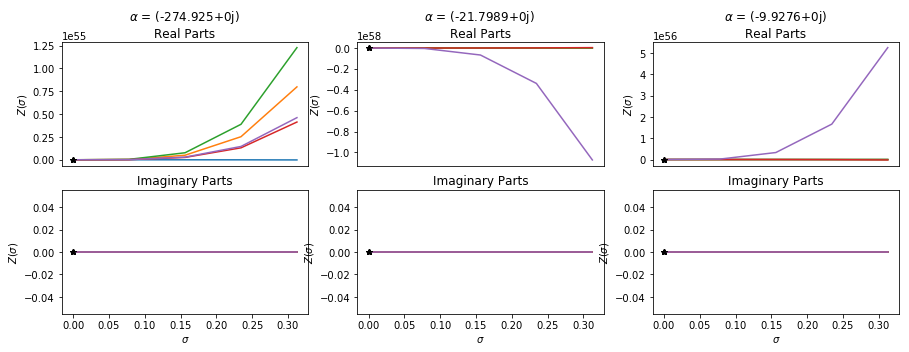

### $\lambda$ = (193.9594+193.9594j)

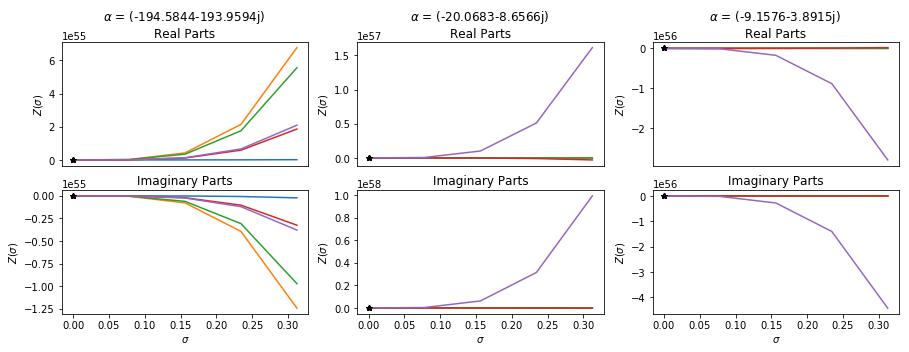

### $\lambda$ = 274.3j

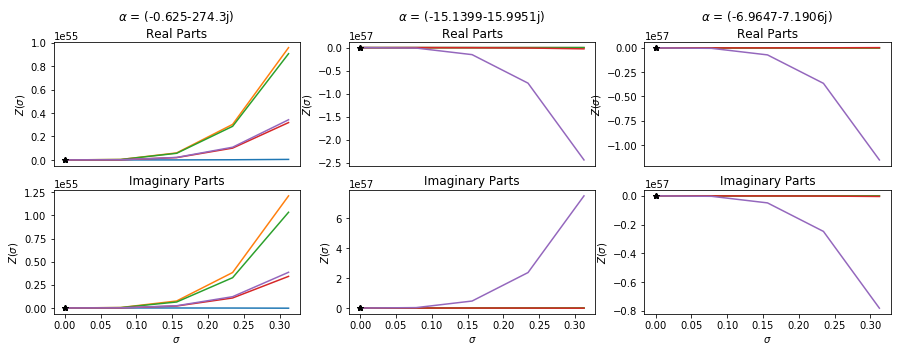

# $\Lambda$ = 106.6

### $\lambda$ = -106.6j

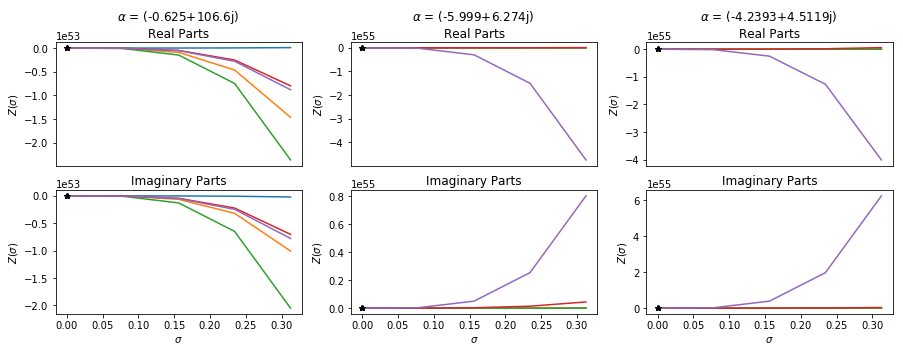

### $\lambda$ = (75.3776-75.3776j)

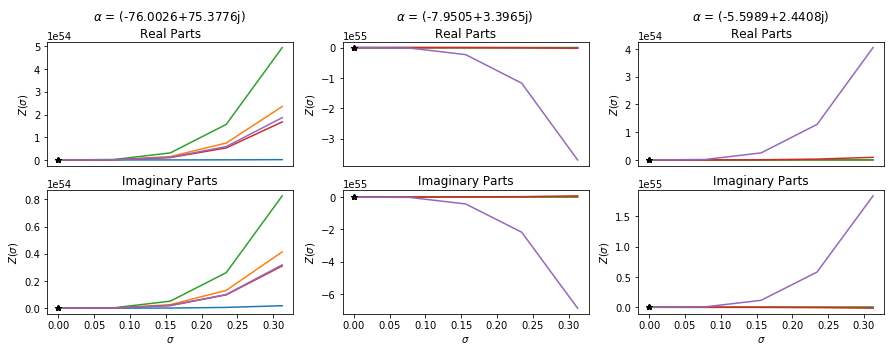

### $\lambda$ = (106.6+0j)

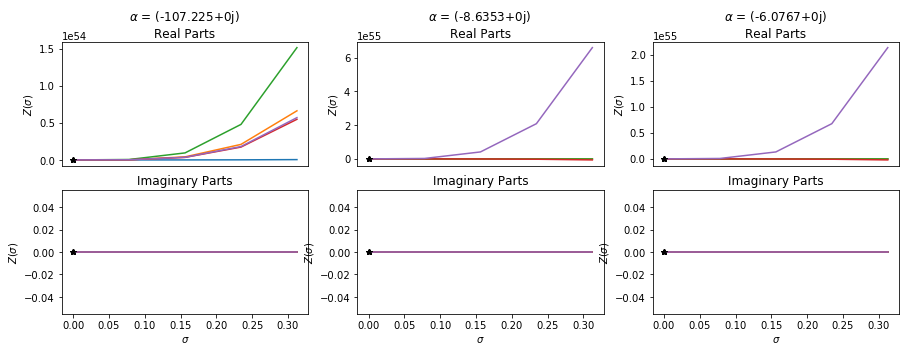

### $\lambda$ = (75.3776+75.3776j)

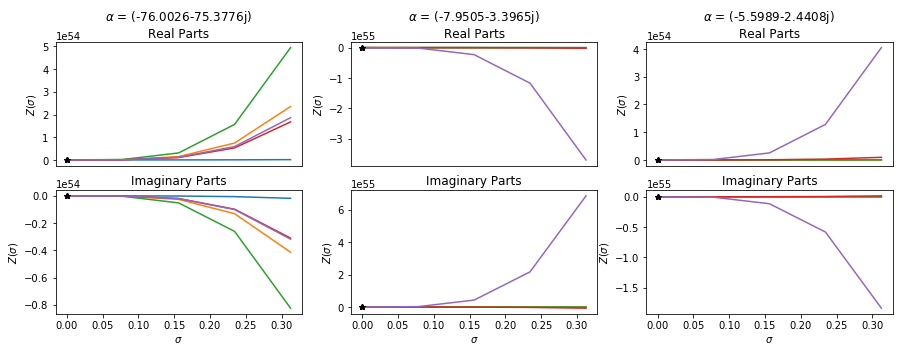

### $\lambda$ = 106.6j

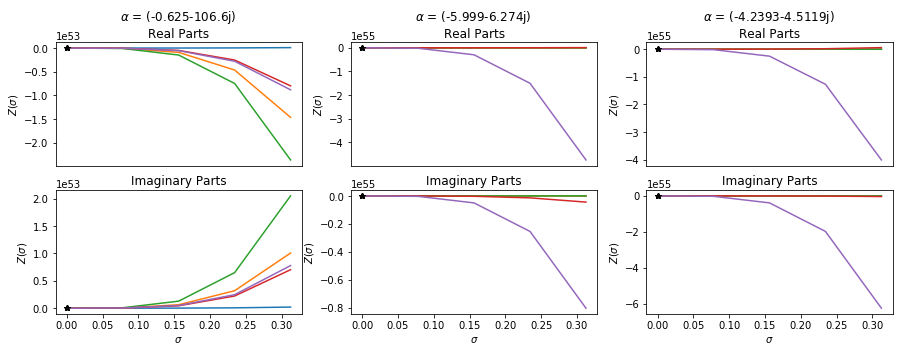

# $\Lambda$ = 69.7

### $\lambda$ = -69.7j

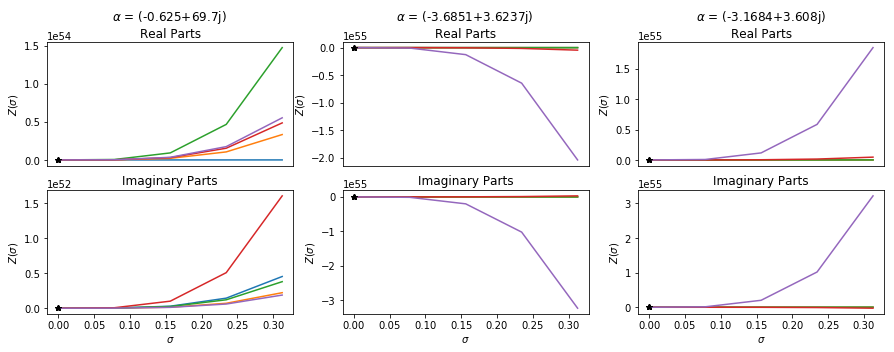

### $\lambda$ = (49.2853-49.2853j)

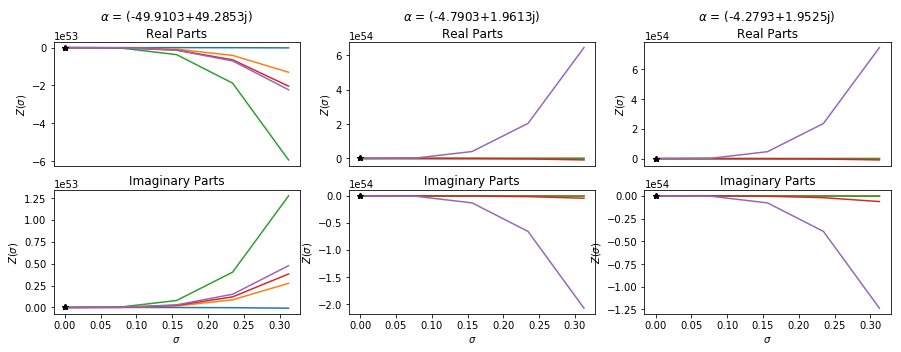

### $\lambda$ = (69.7+0j)

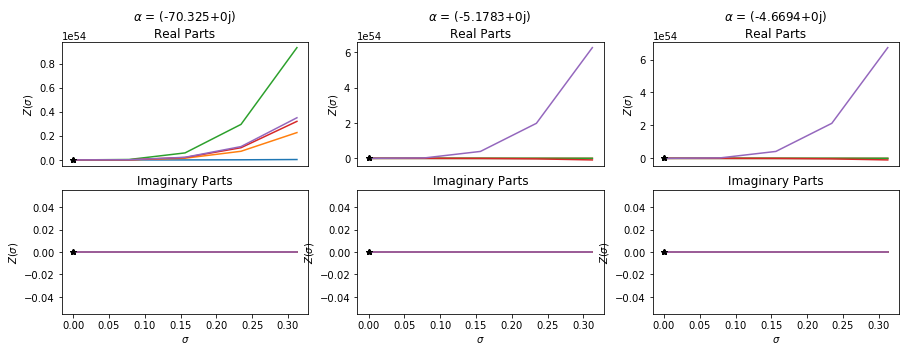

### $\lambda$ = (49.2853+49.2853j)

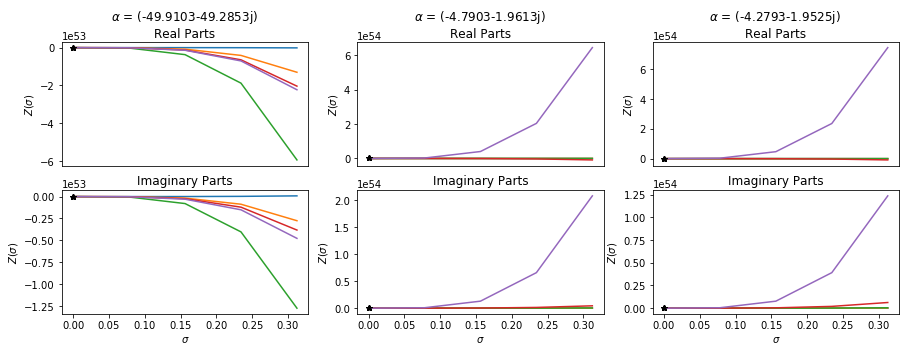

### $\lambda$ = 69.7j

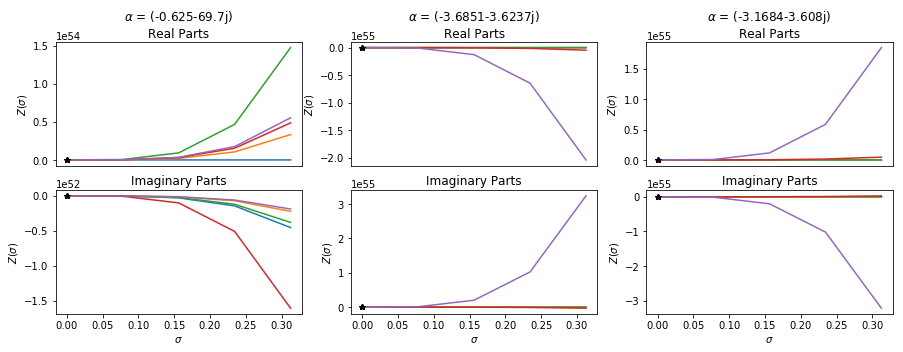

# $\Lambda$ = 98.7

### $\lambda$ = -98.7j

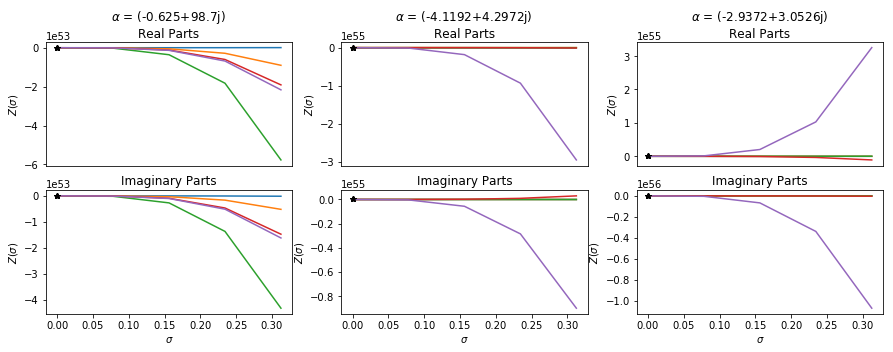

### $\lambda$ = (69.7914-69.7914j)

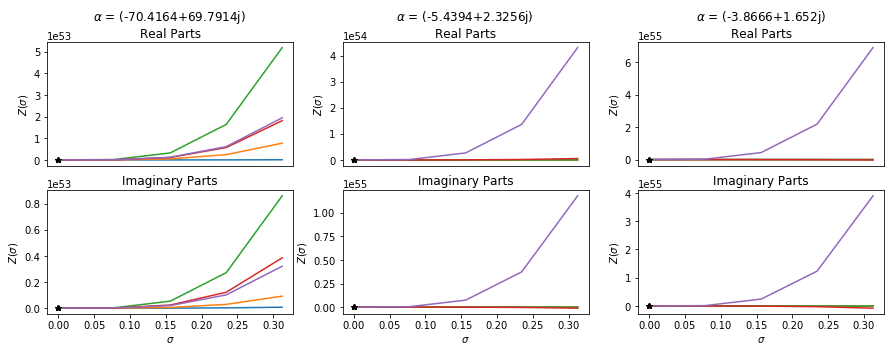

### $\lambda$ = (98.7+0j)

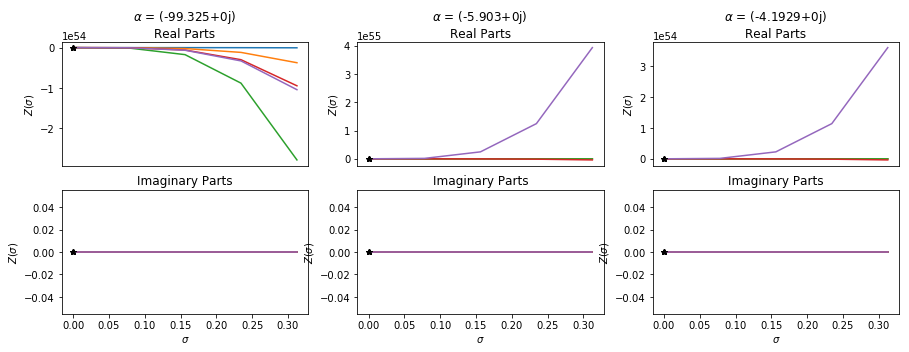

### $\lambda$ = (69.7914+69.7914j)

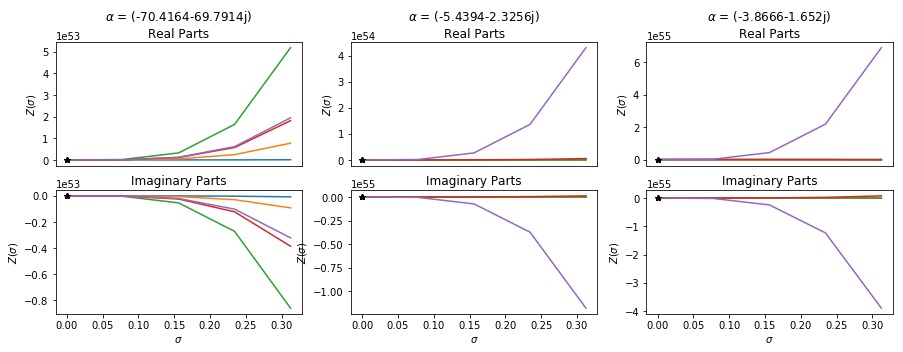

### $\lambda$ = 98.7j

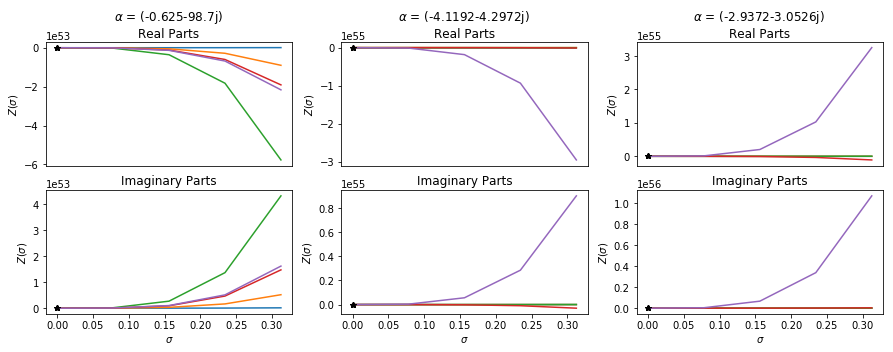

# $\Lambda$ = 183.1

### $\lambda$ = -183.1j

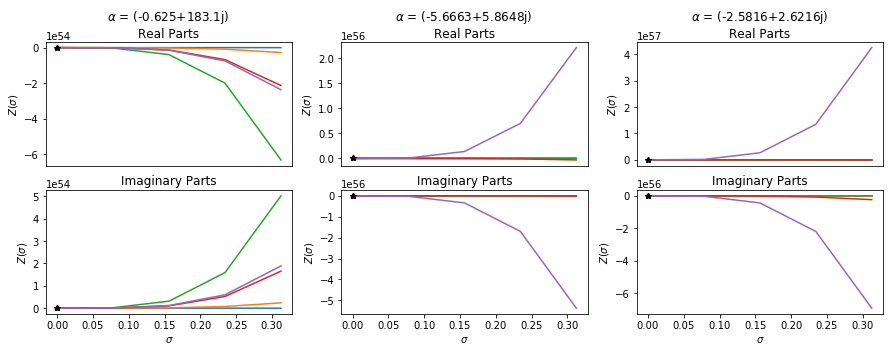

### $\lambda$ = (129.4713-129.4713j)

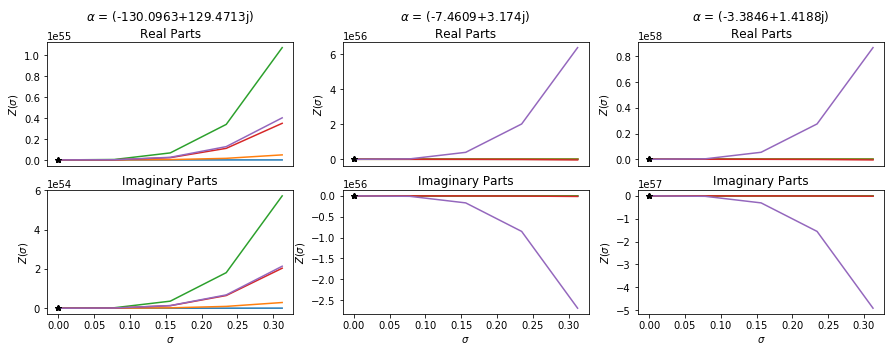

### $\lambda$ = (183.1+0j)

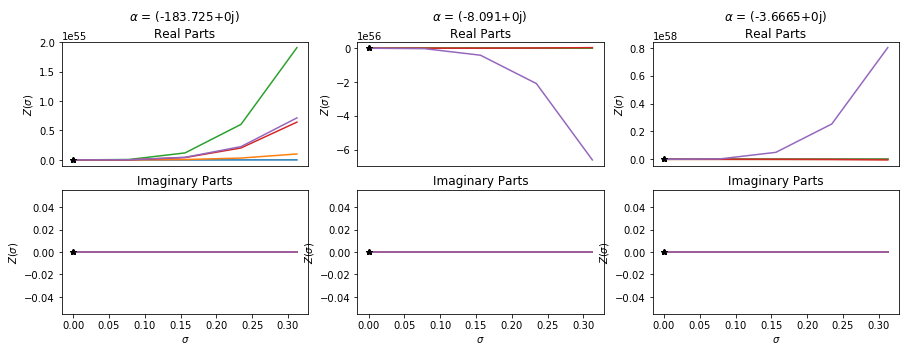

### $\lambda$ = (129.4713+129.4713j)

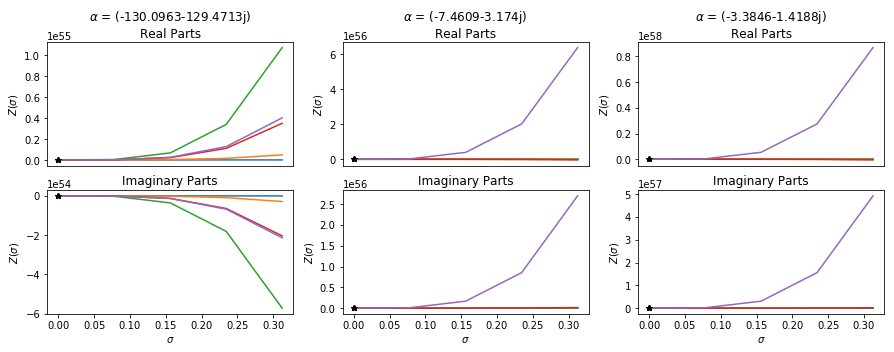

### $\lambda$ = 183.1j

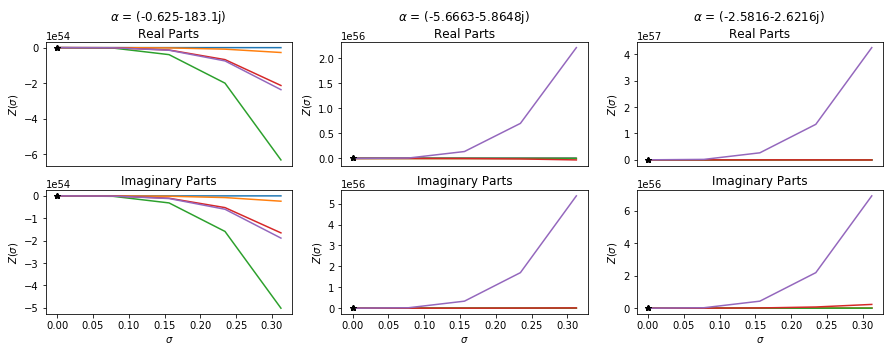

# $\Lambda$ = 300.8

### $\lambda$ = -300.8j

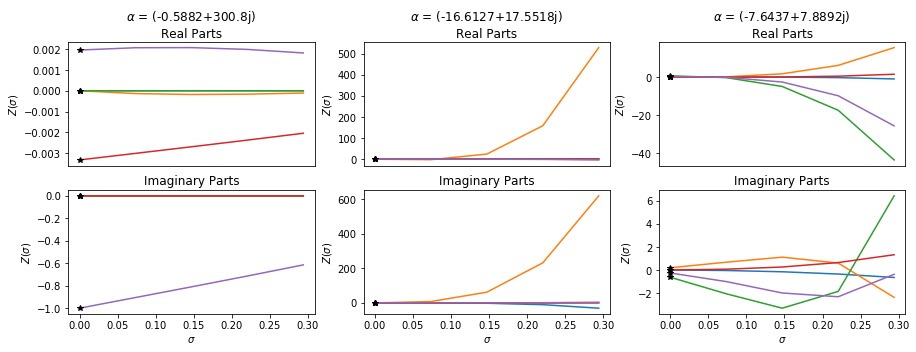

### $\lambda$ = (212.6977-212.6977j)

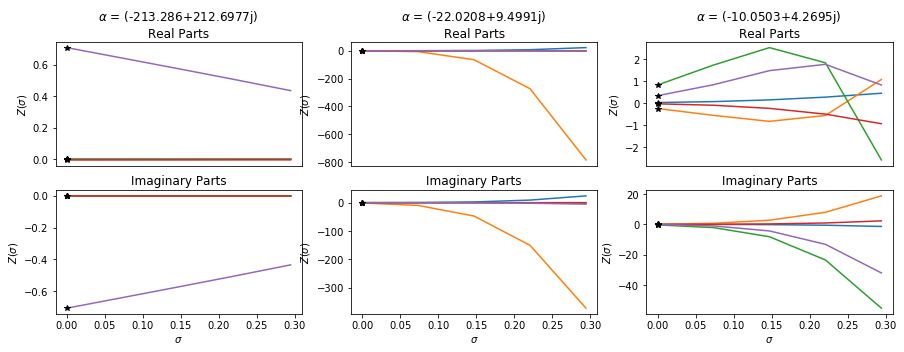

### $\lambda$ = (300.8+0j)

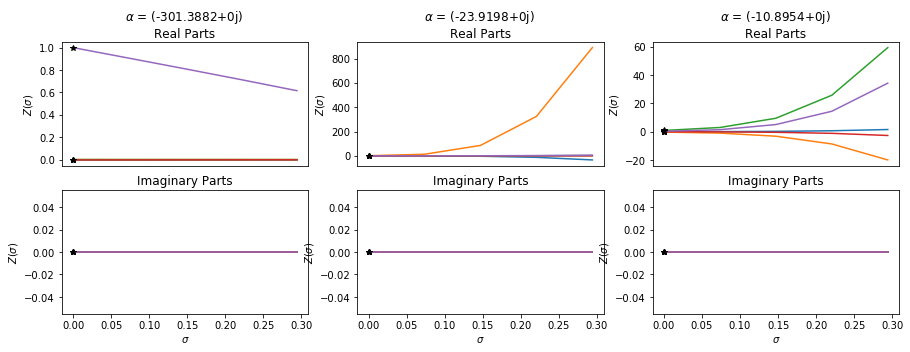

### $\lambda$ = (212.6977+212.6977j)

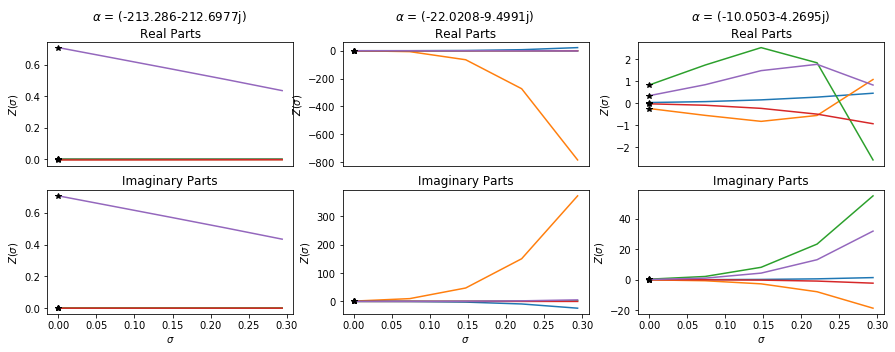

### $\lambda$ = 300.8j

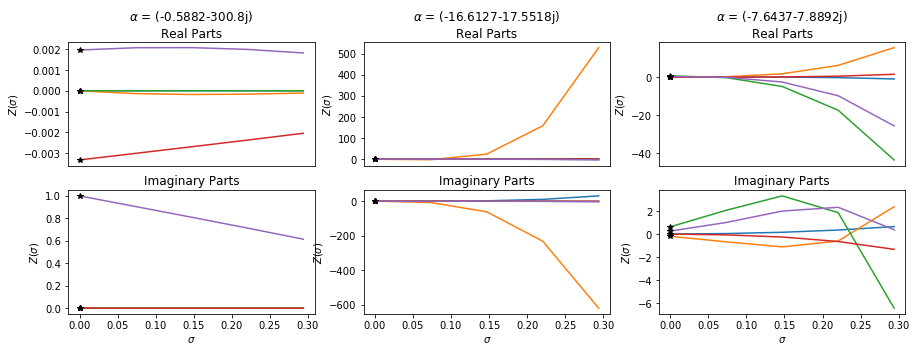

# $\Lambda$ = 117.5

### $\lambda$ = -117.5j

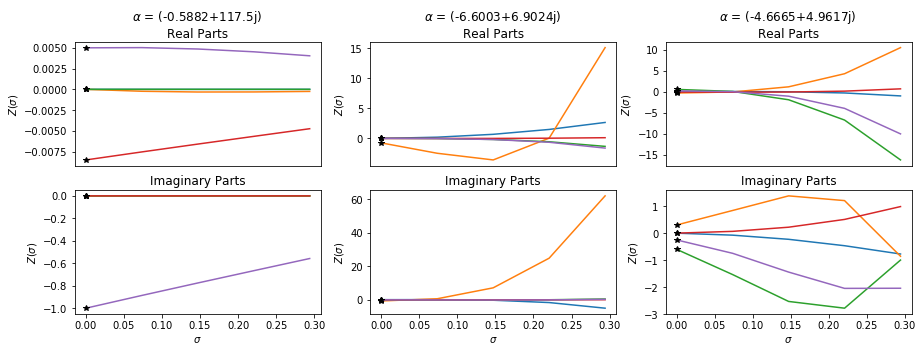

### $\lambda$ = (83.085-83.085j)

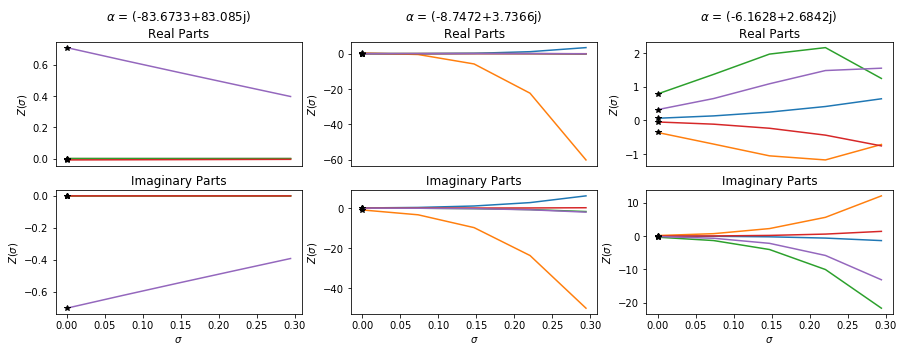

### $\lambda$ = (117.5+0j)

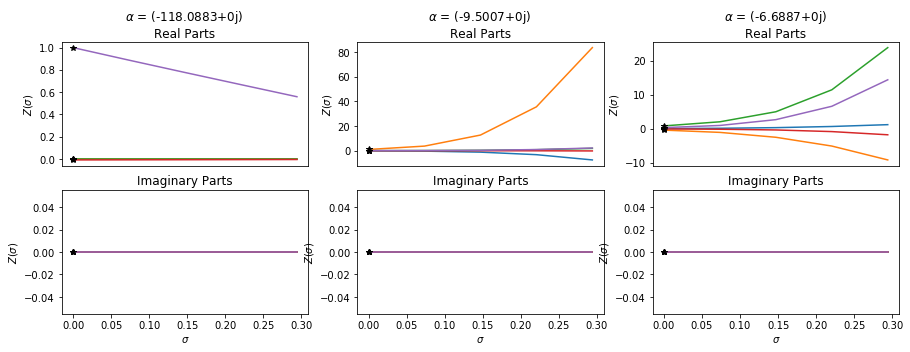

### $\lambda$ = (83.085+83.085j)

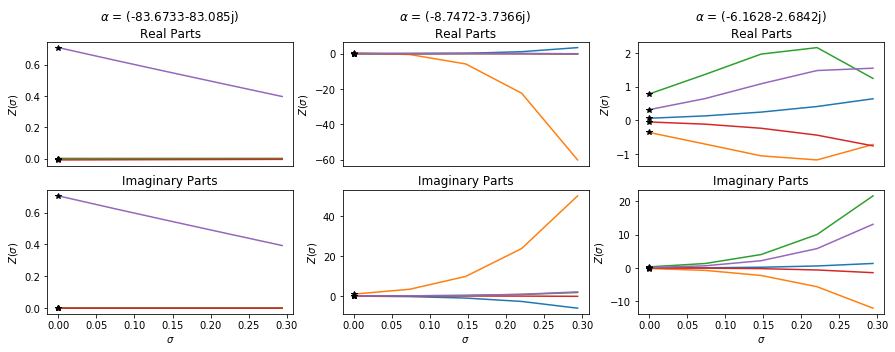

### $\lambda$ = 117.5j

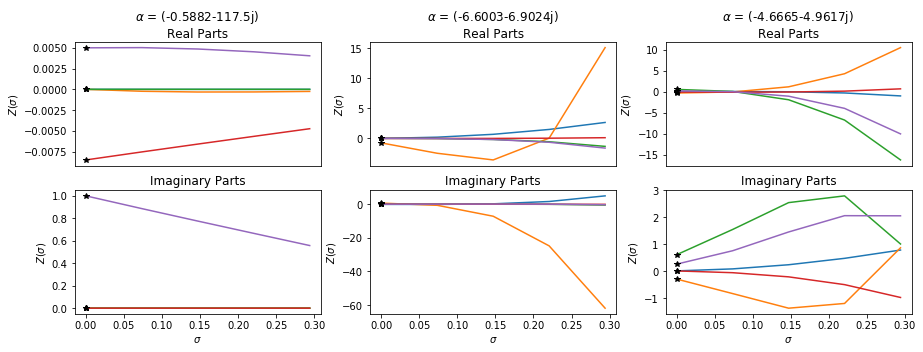

# $\Lambda$ = 70.5

### $\lambda$ = -70.5j

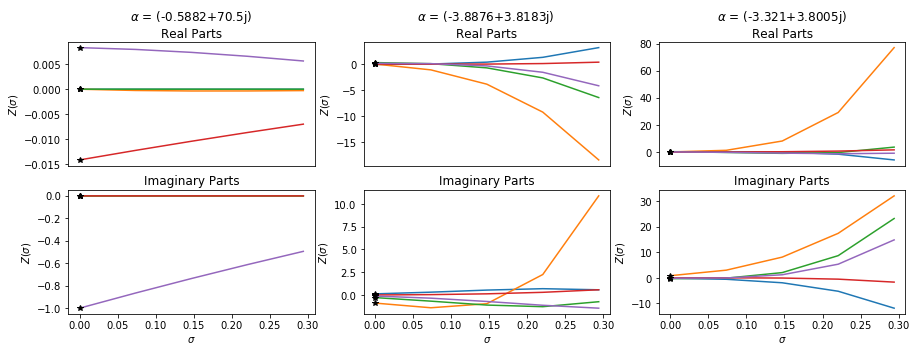

### $\lambda$ = (49.851-49.851j)

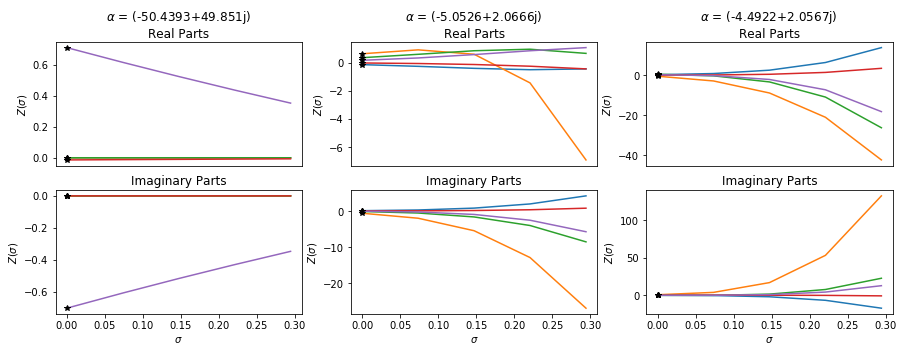

### $\lambda$ = (70.5+0j)

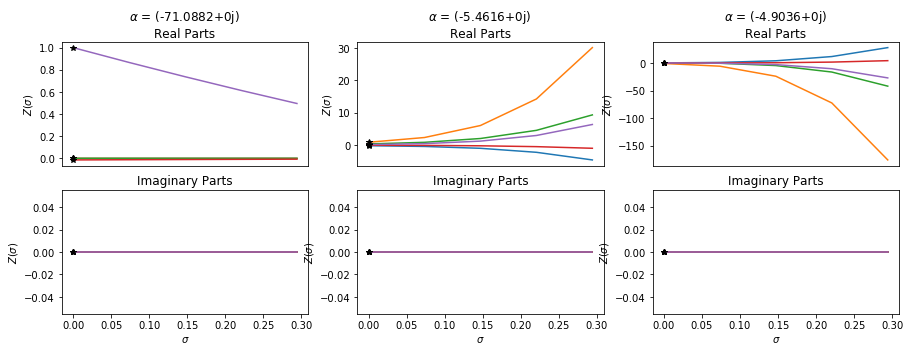

### $\lambda$ = (49.851+49.851j)

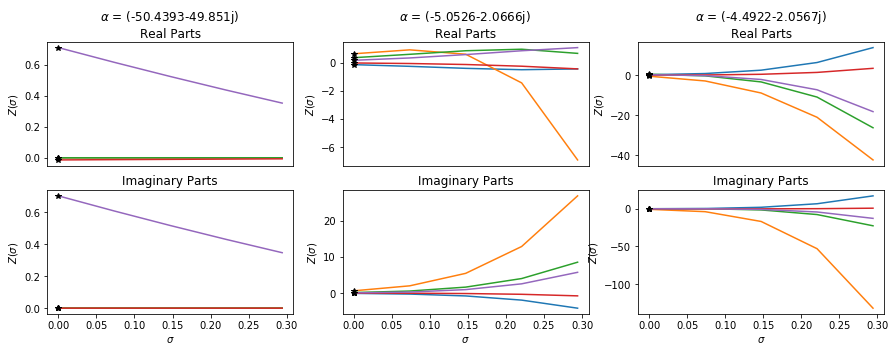

### $\lambda$ = 70.5j

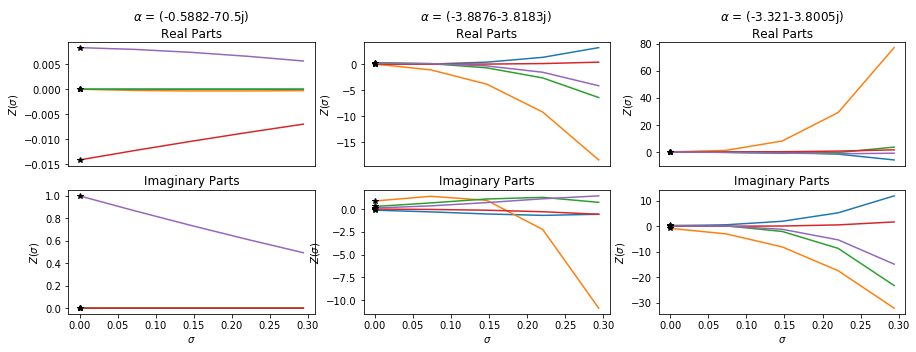

# $\Lambda$ = 91.6

### $\lambda$ = -91.6j

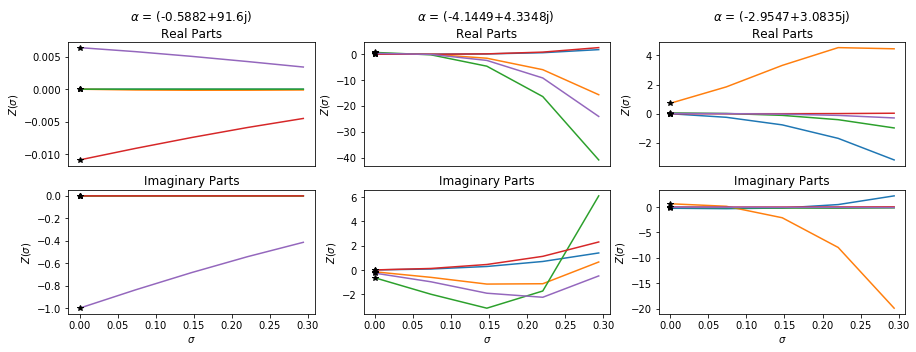

### $\lambda$ = (64.771-64.771j)

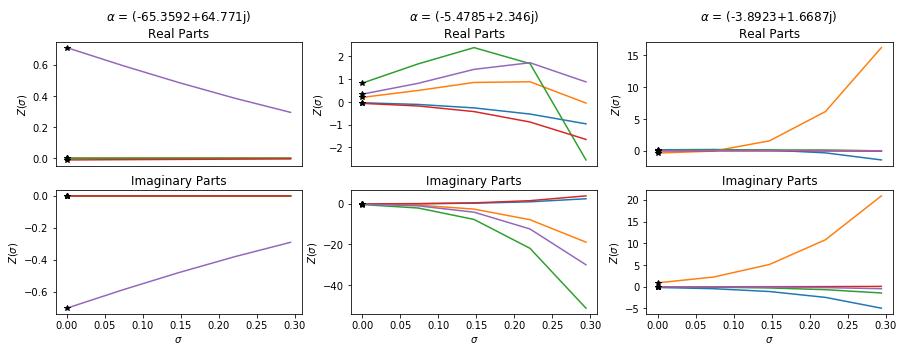

### $\lambda$ = (91.6+0j)

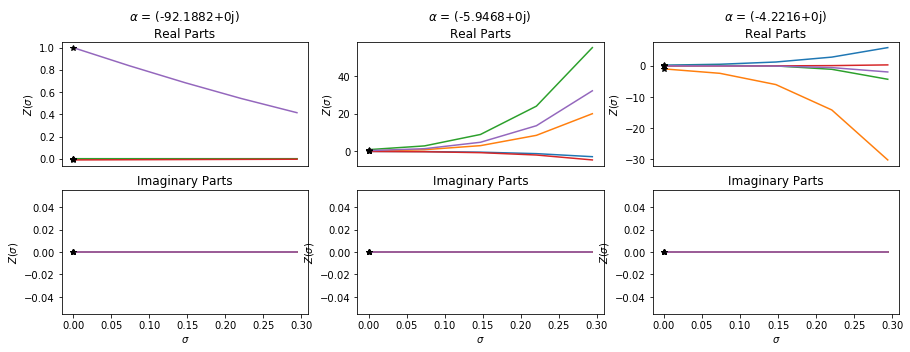

### $\lambda$ = (64.771+64.771j)

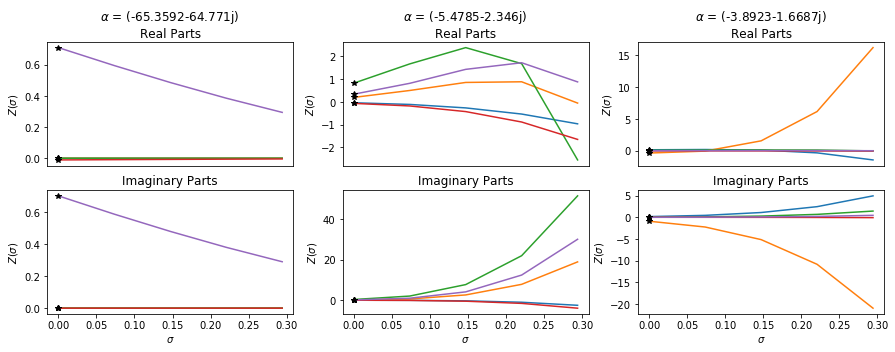

### $\lambda$ = 91.6j

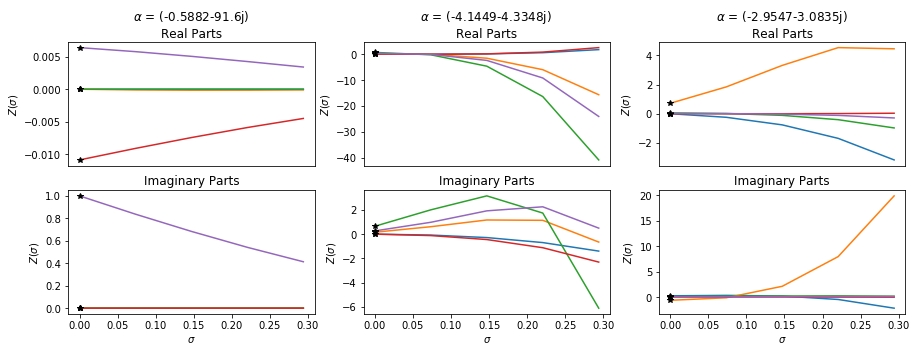

# $\Lambda$ = 154.9

### $\lambda$ = -154.9j

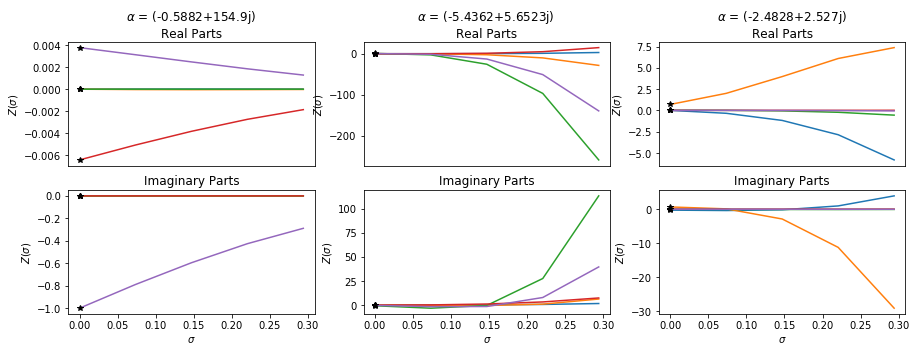

### $\lambda$ = (109.5308-109.5308j)

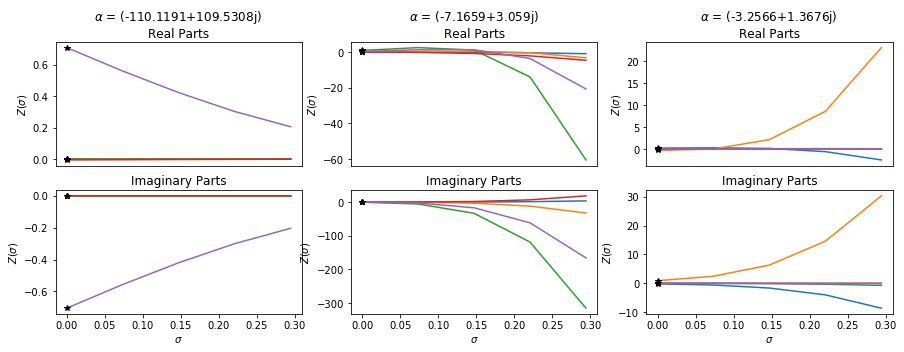

### $\lambda$ = (154.9+0j)

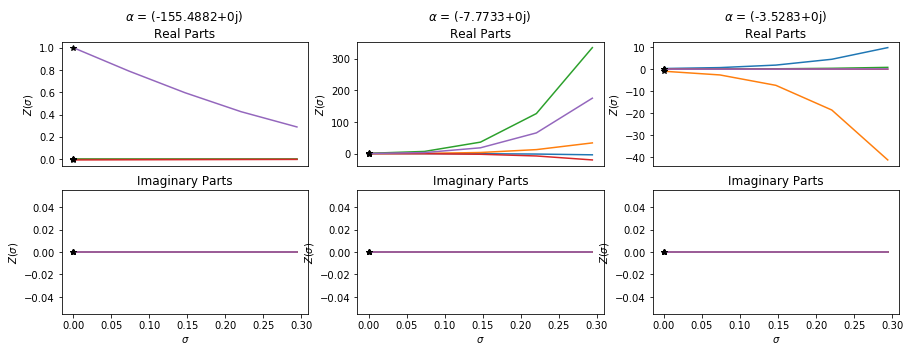

### $\lambda$ = (109.5308+109.5308j)

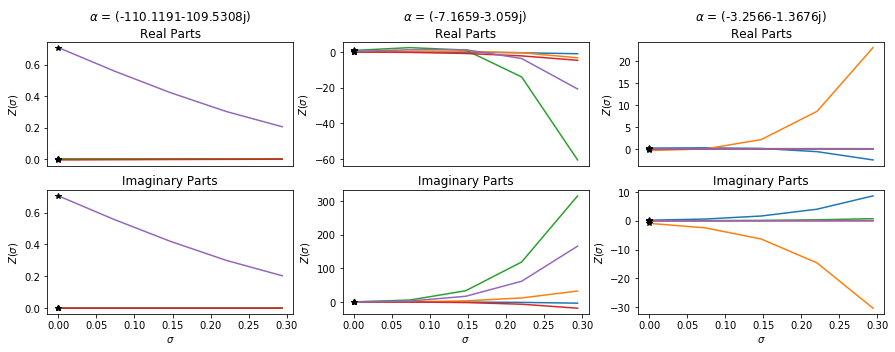

### $\lambda$ = 154.9j

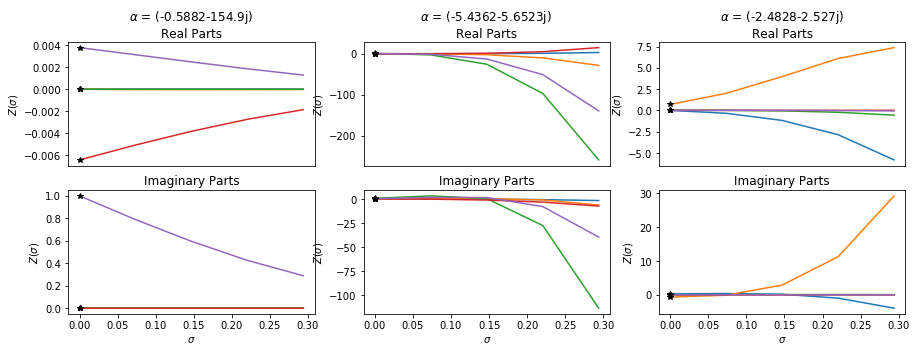

# $\Lambda$ = 347.4

### $\lambda$ = -347.4j

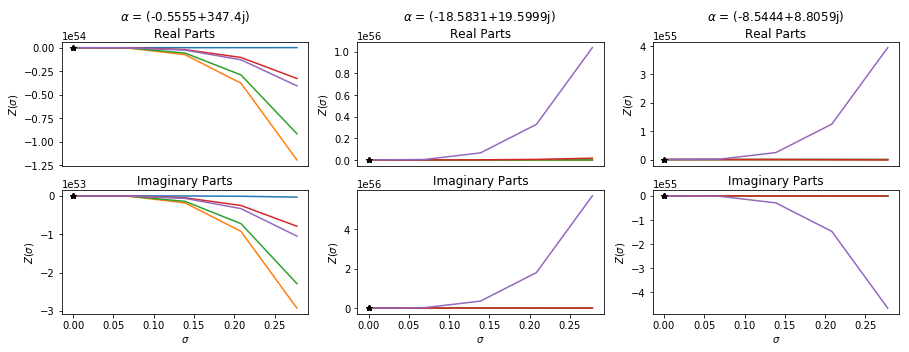

### $\lambda$ = (245.6489-245.6489j)

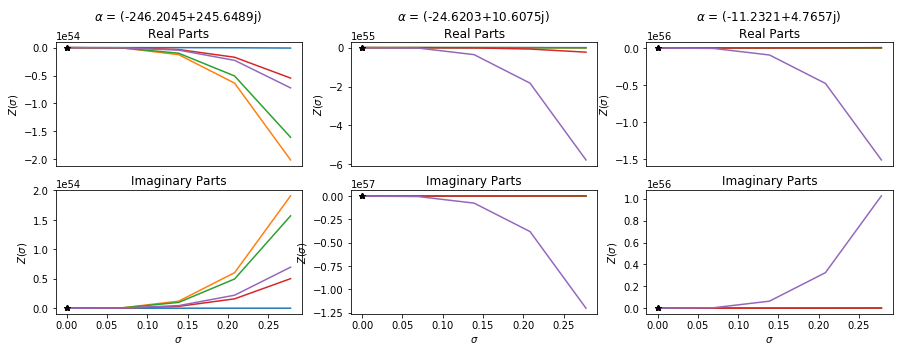

### $\lambda$ = (347.4+0j)

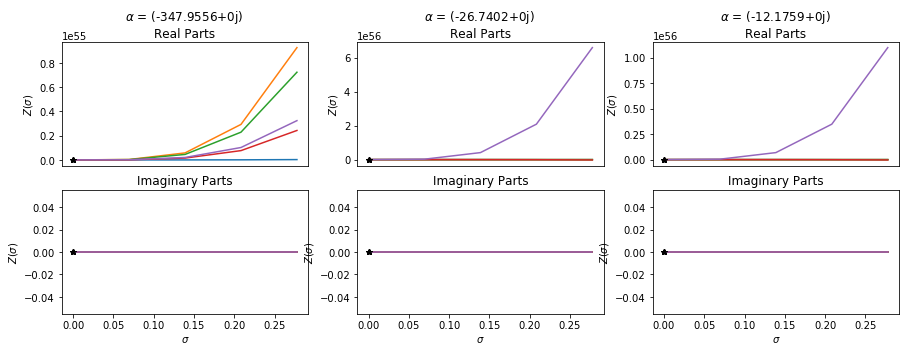

### $\lambda$ = (245.6489+245.6489j)

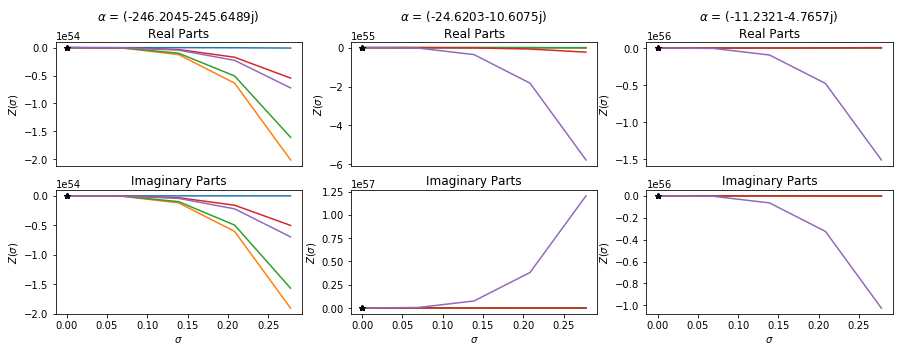

### $\lambda$ = 347.4j

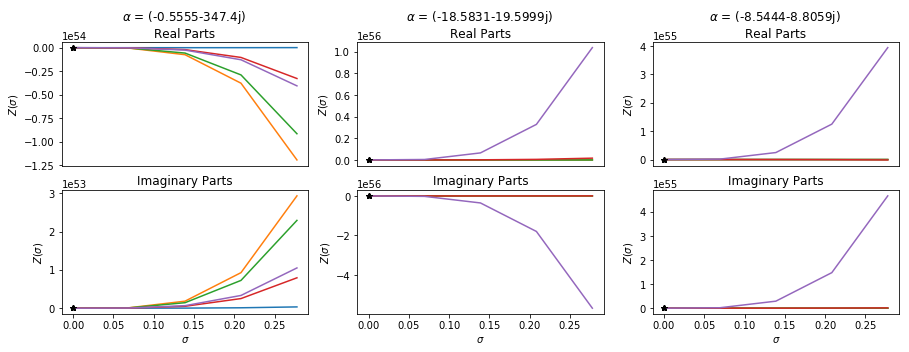

# $\Lambda$ = 131.8

### $\lambda$ = -131.8j

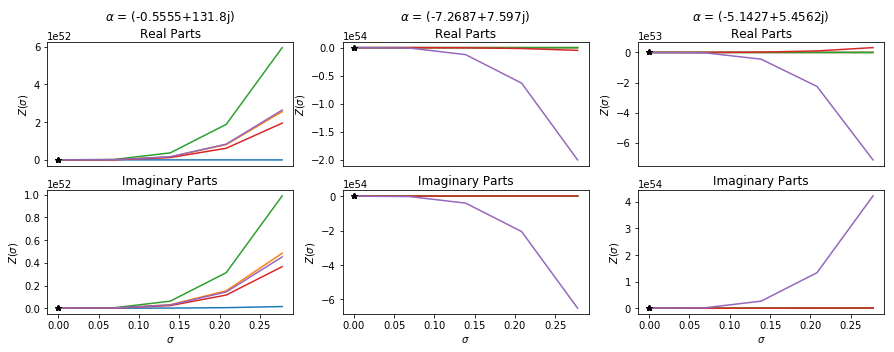

### $\lambda$ = (93.1967-93.1967j)

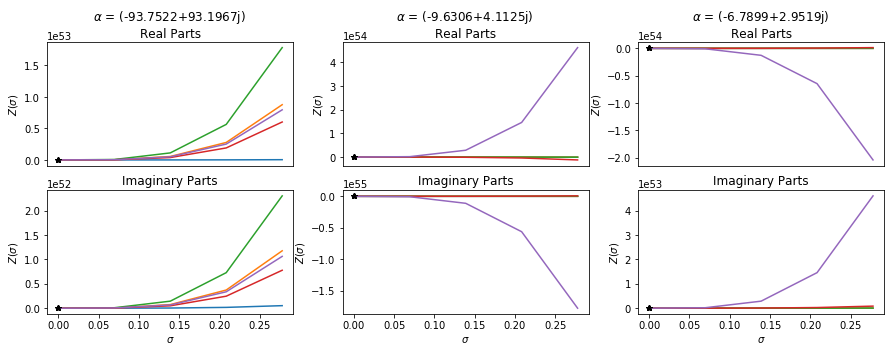

### $\lambda$ = (131.8+0j)

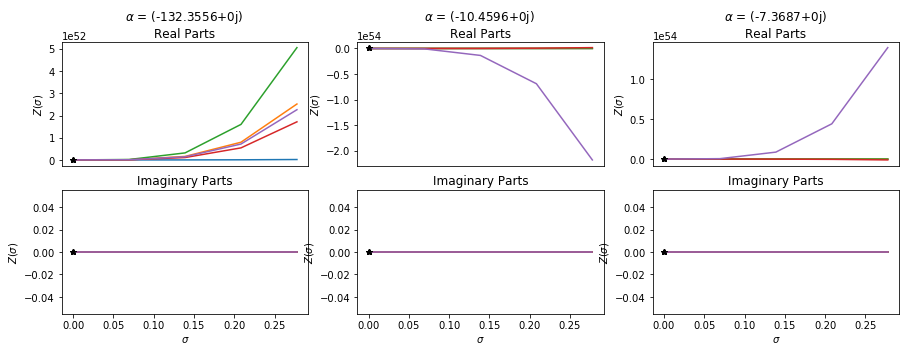

### $\lambda$ = (93.1967+93.1967j)

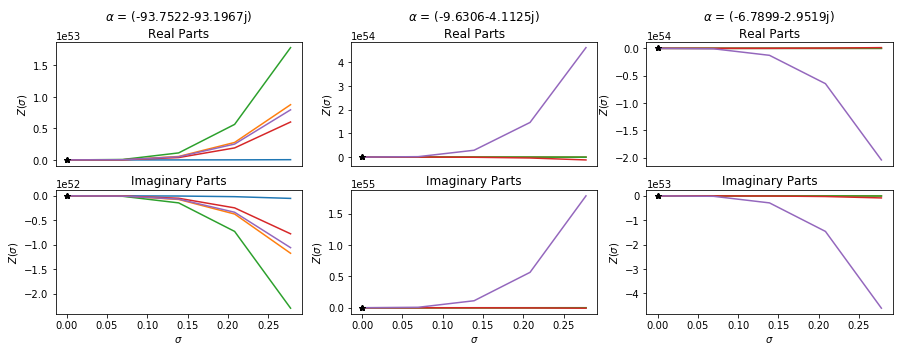

### $\lambda$ = 131.8j

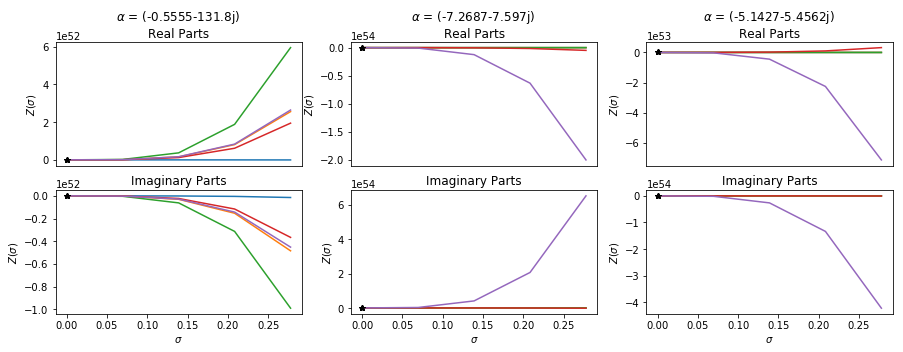

# $\Lambda$ = 74.5

### $\lambda$ = -74.5j

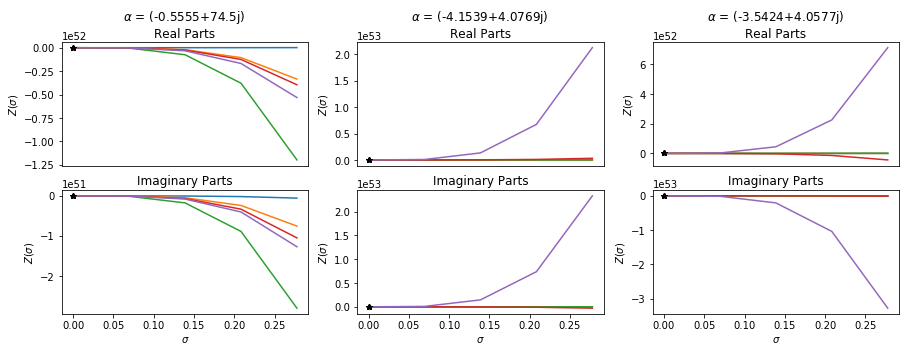

### $\lambda$ = (52.6795-52.6795j)

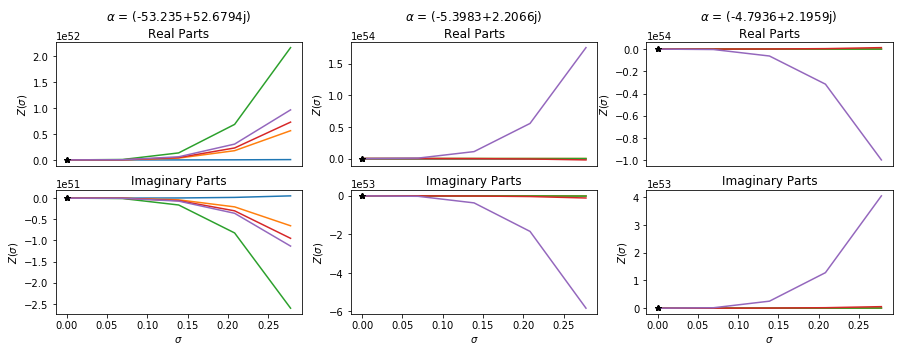

### $\lambda$ = (74.5+0j)

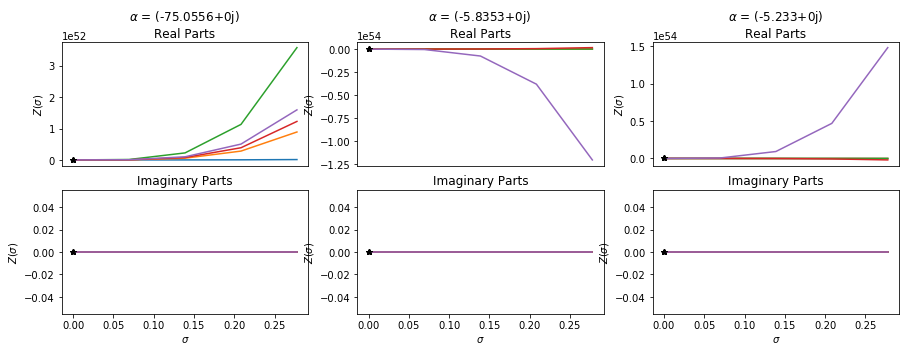

### $\lambda$ = (52.6795+52.6795j)

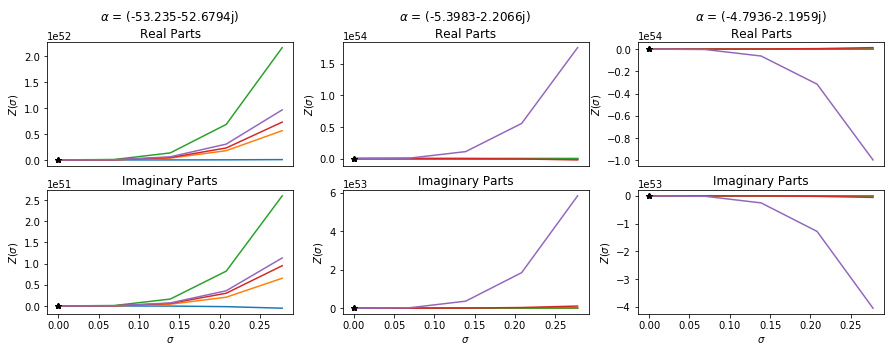

### $\lambda$ = 74.5j

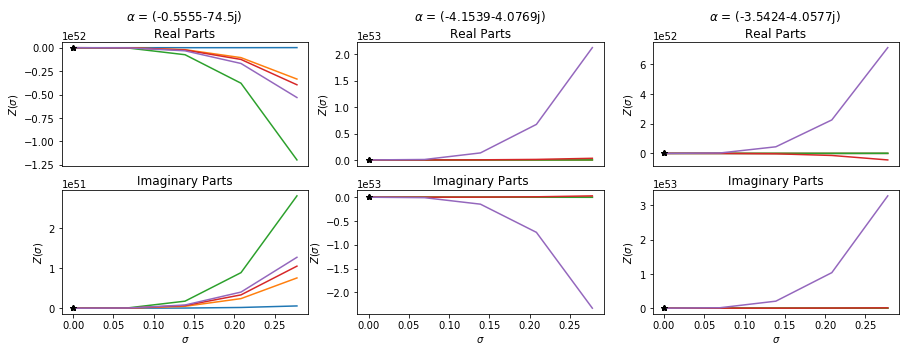

# $\Lambda$ = 89.8

### $\lambda$ = -89.8j

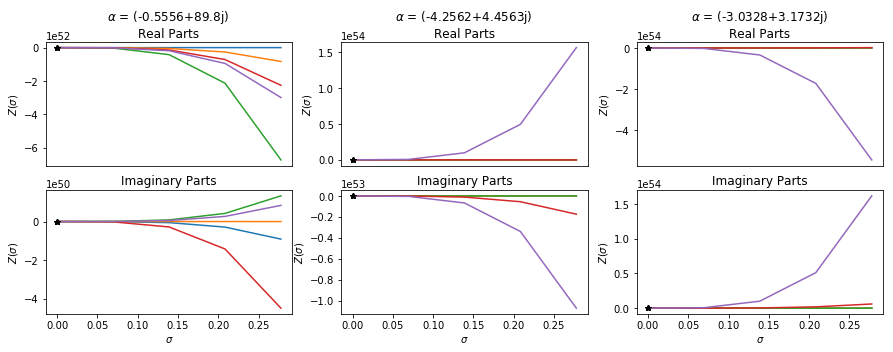

### $\lambda$ = (63.4982-63.4982j)

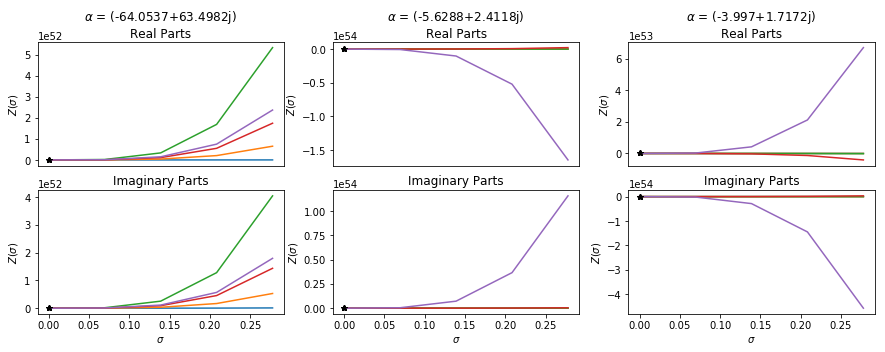

### $\lambda$ = (89.8+0j)

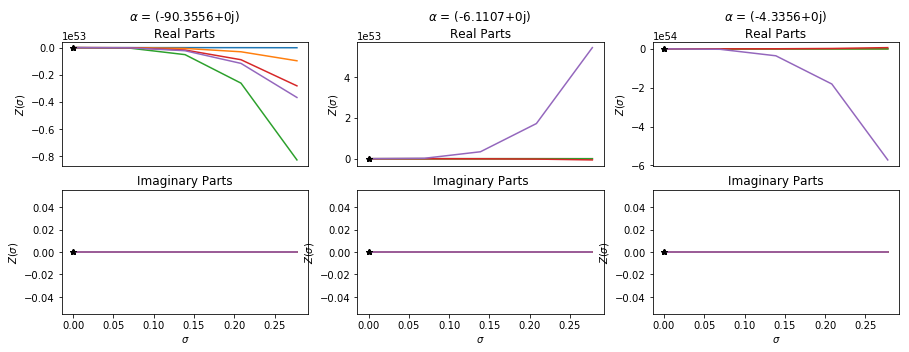

### $\lambda$ = (63.4982+63.4982j)

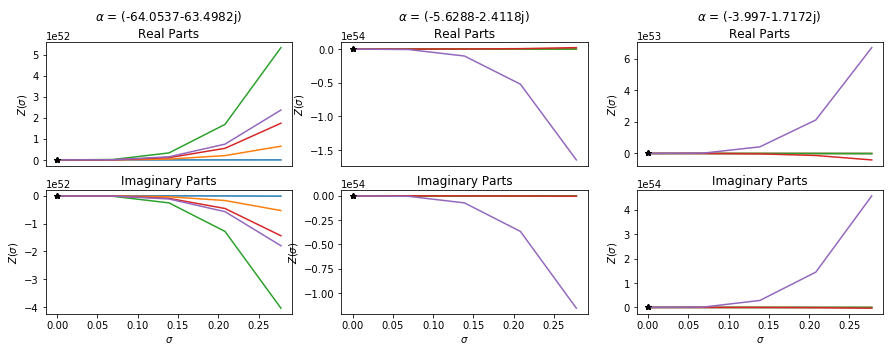

### $\lambda$ = 89.8j

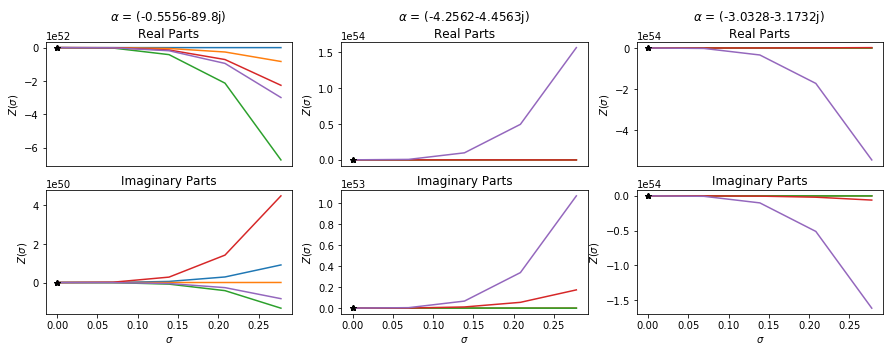

# $\Lambda$ = 138.0

### $\lambda$ = -138j

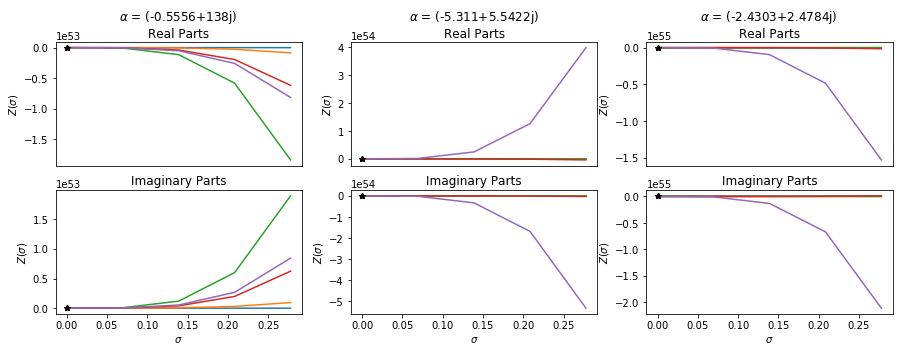

### $\lambda$ = (97.5807-97.5807j)

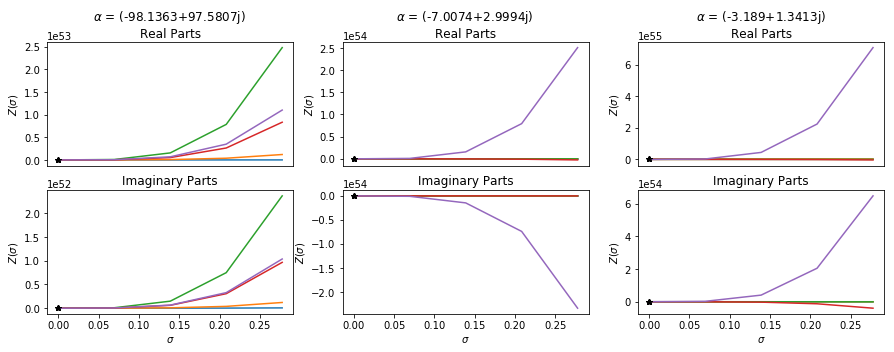

### $\lambda$ = (138+0j)

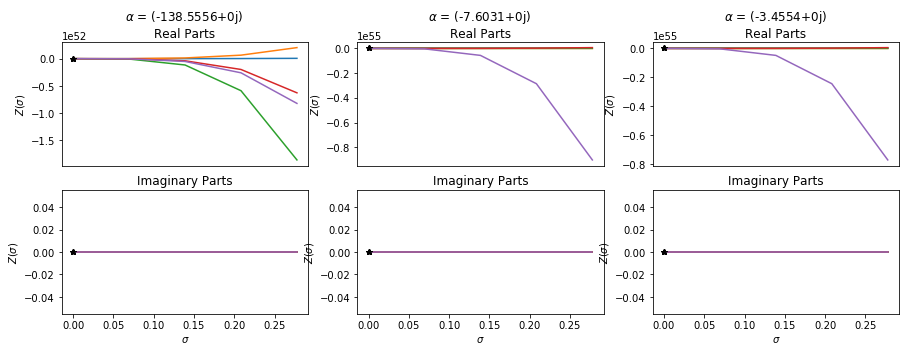

### $\lambda$ = (97.5807+97.5807j)

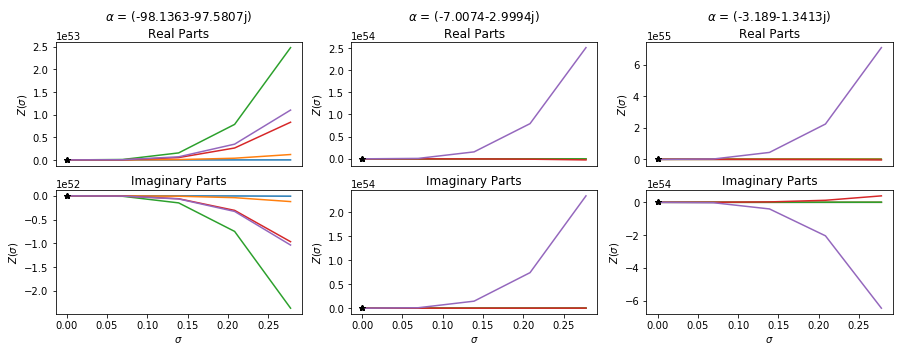

### $\lambda$ = 138j

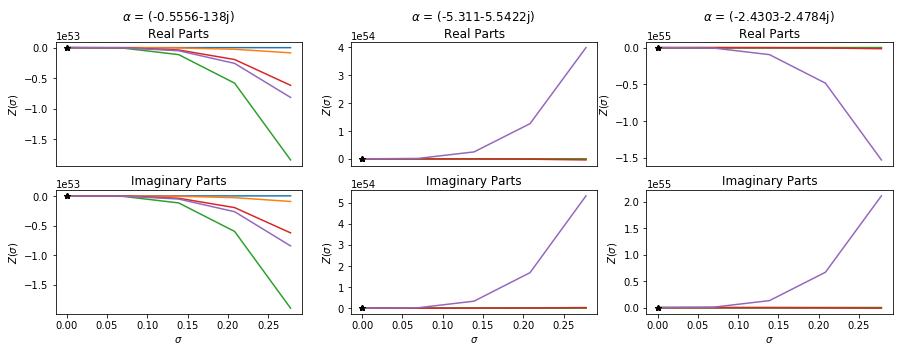

# $\Lambda$ = 397.3

### $\lambda$ = -397.3j

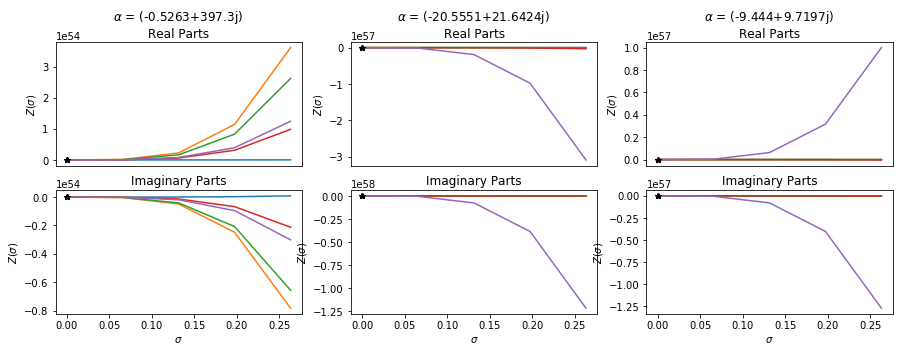

### $\lambda$ = (280.9335-280.9335j)

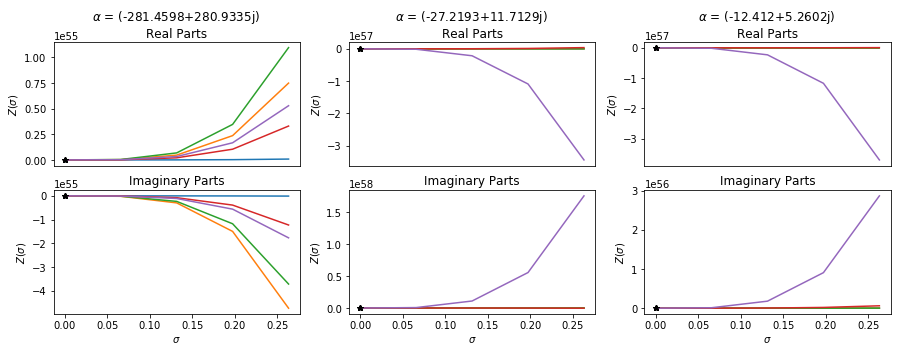

### $\lambda$ = (397.3+0j)

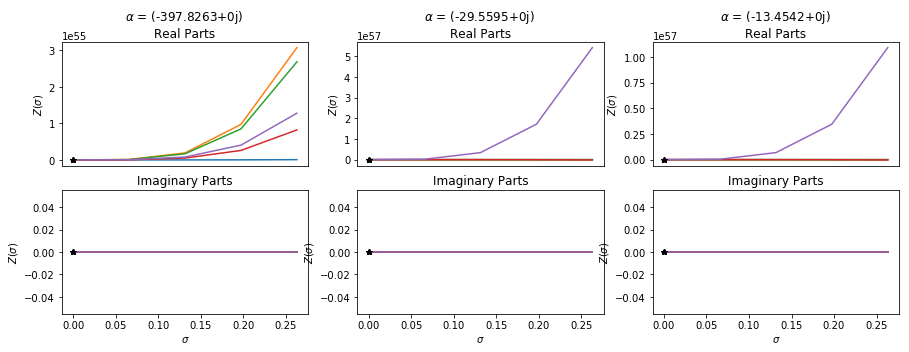

### $\lambda$ = (280.9335+280.9335j)

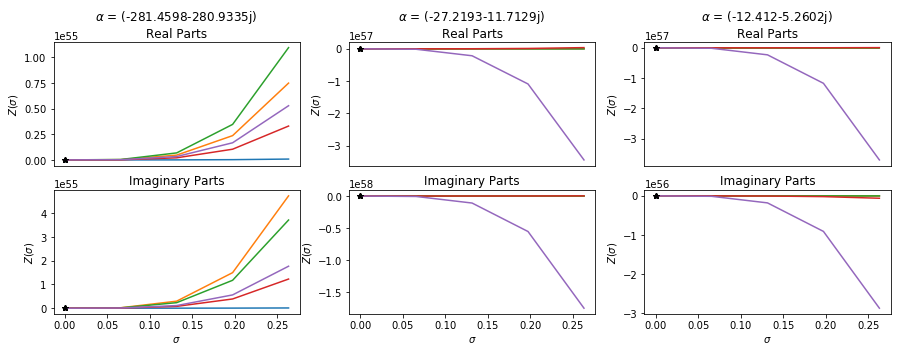

### $\lambda$ = 397.3j

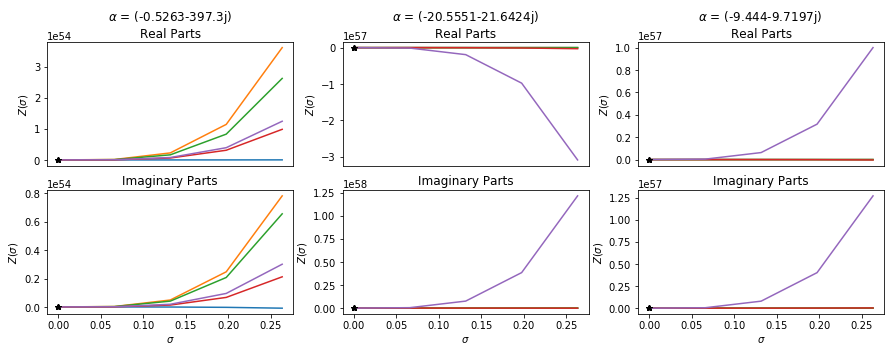

# $\Lambda$ = 148.7

### $\lambda$ = -148.7j

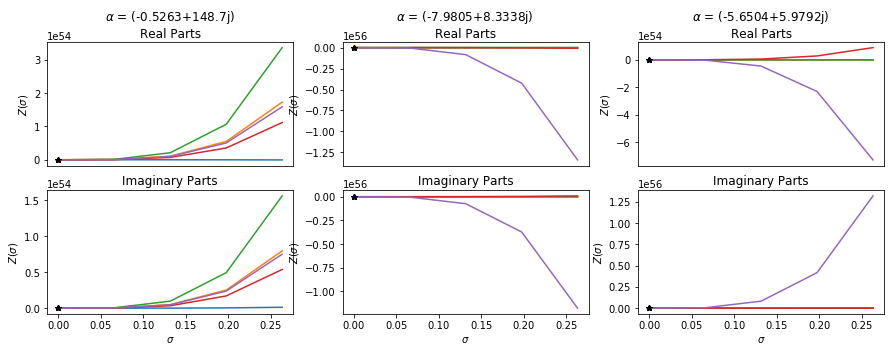

### $\lambda$ = (105.1468-105.1468j)

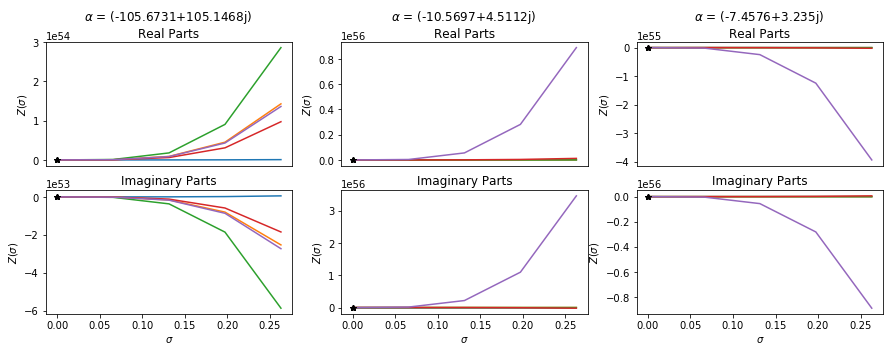

### $\lambda$ = (148.7+0j)

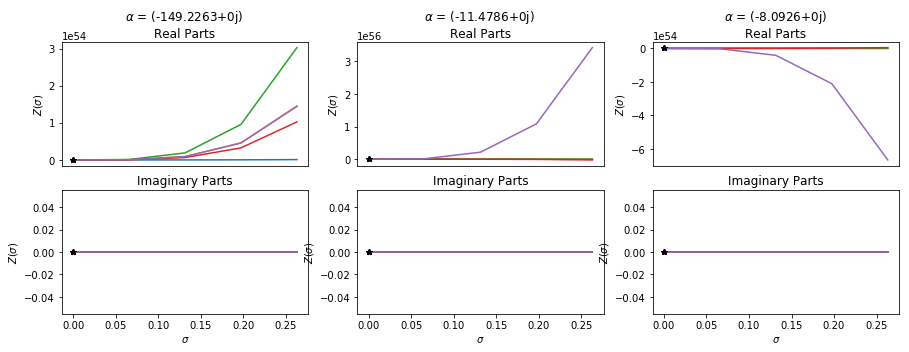

### $\lambda$ = (105.1468+105.1468j)

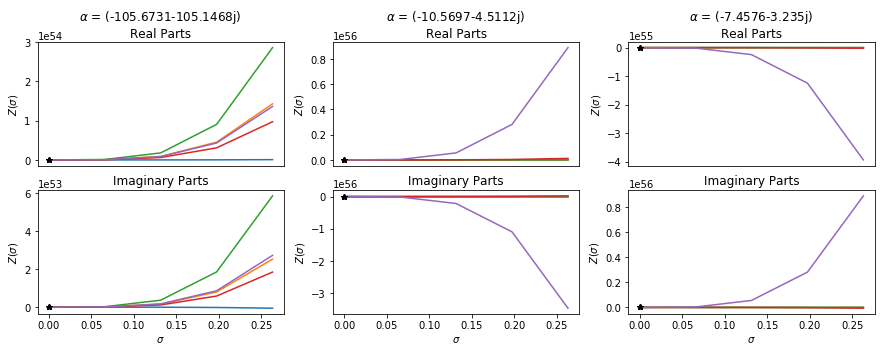

### $\lambda$ = 148.7j

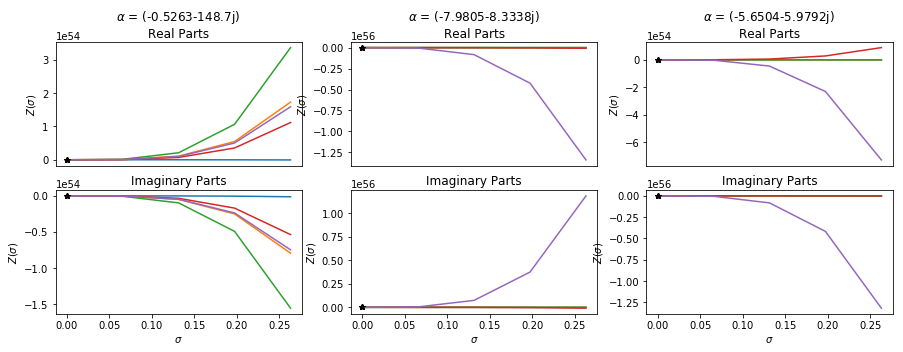

# $\Lambda$ = 80.8

### $\lambda$ = -80.8j

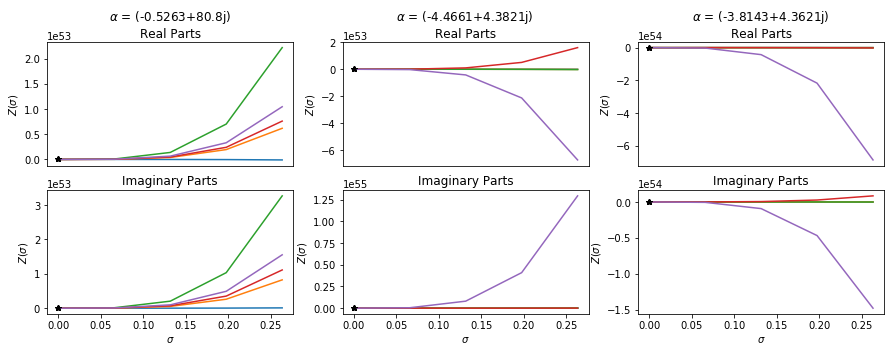

### $\lambda$ = (57.1342-57.1342j)

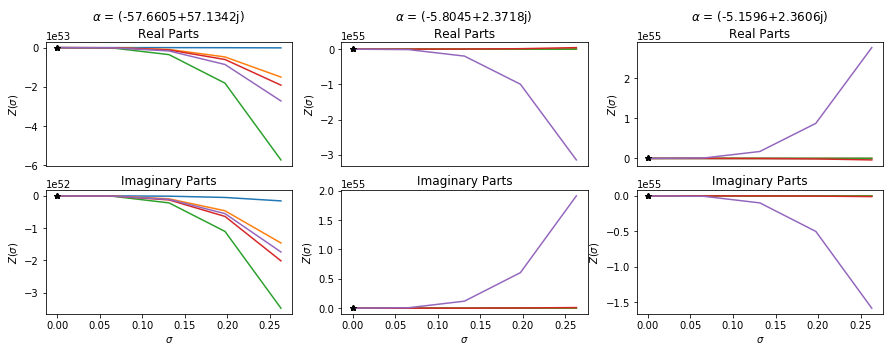

### $\lambda$ = (80.8+0j)

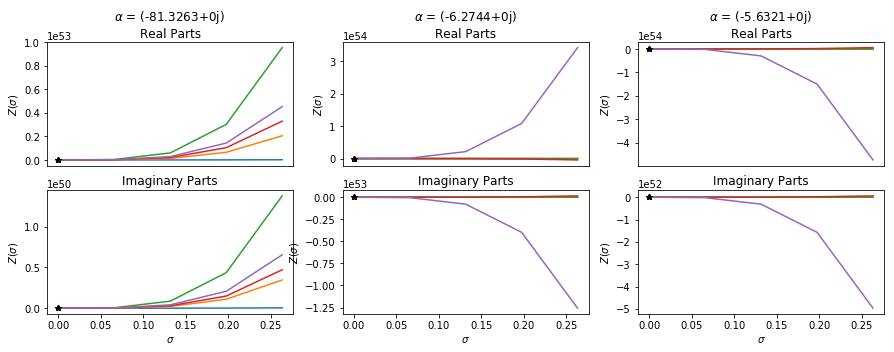

### $\lambda$ = (57.1342+57.1342j)

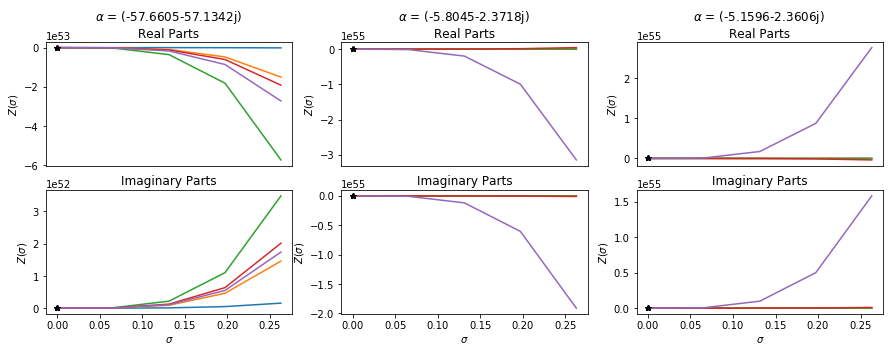

### $\lambda$ = 80.8j

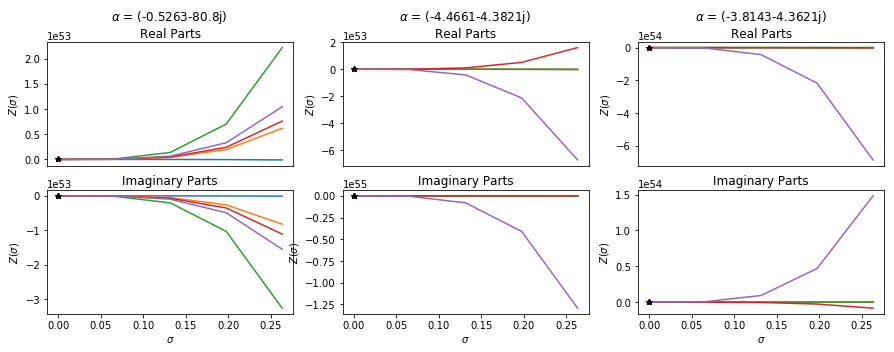

# $\Lambda$ = 91.8

### $\lambda$ = -91.8j

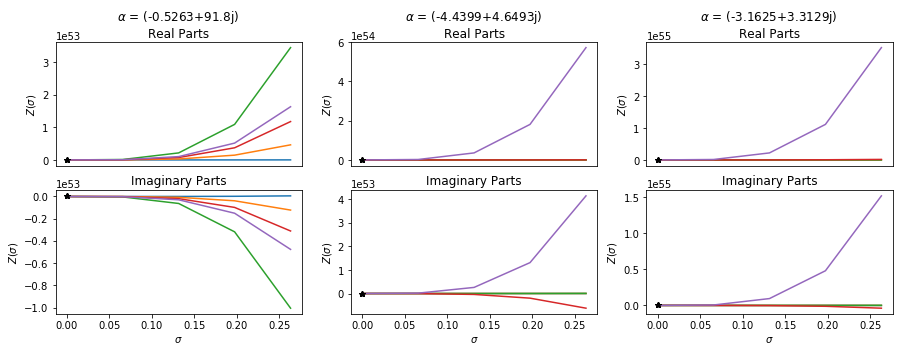

### $\lambda$ = (64.9124-64.9124j)

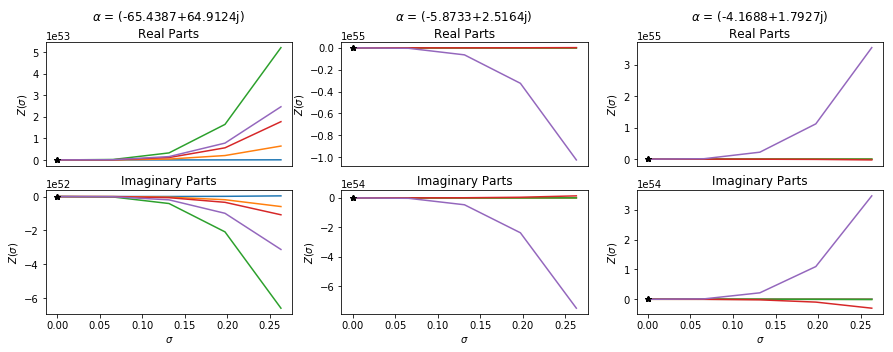

### $\lambda$ = (91.8+0j)

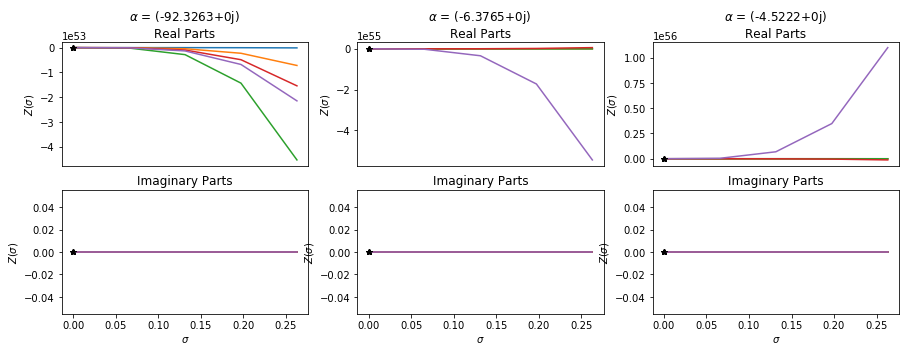

### $\lambda$ = (64.9124+64.9124j)

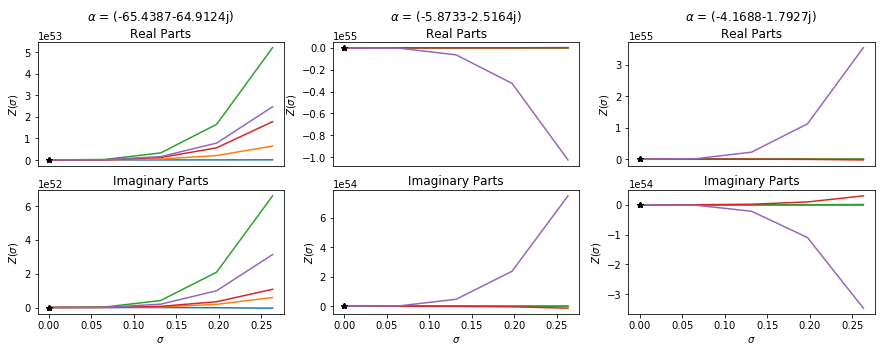

### $\lambda$ = 91.8j

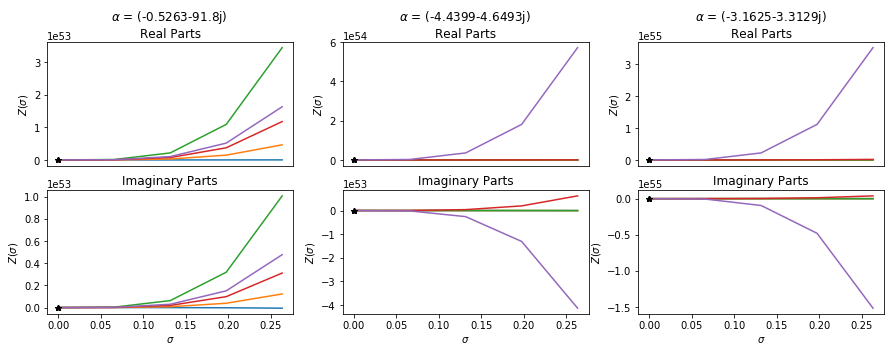

# $\Lambda$ = 128.6

### $\lambda$ = -128.6j

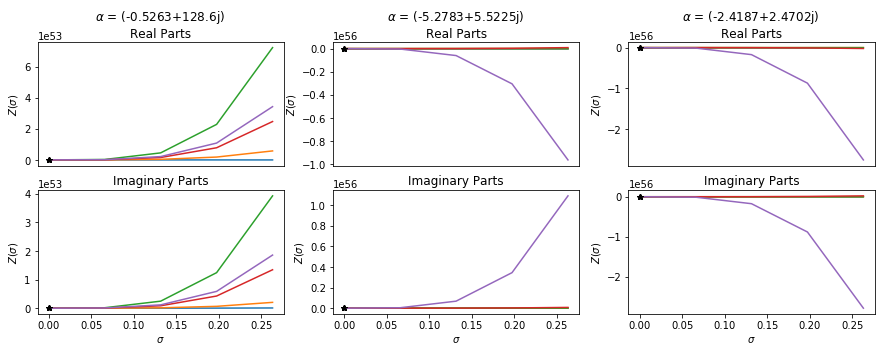

### $\lambda$ = (90.9339-90.9339j)

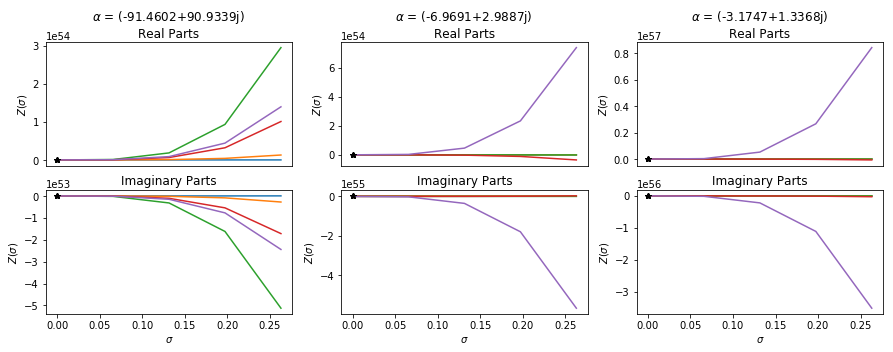

### $\lambda$ = (128.6+0j)

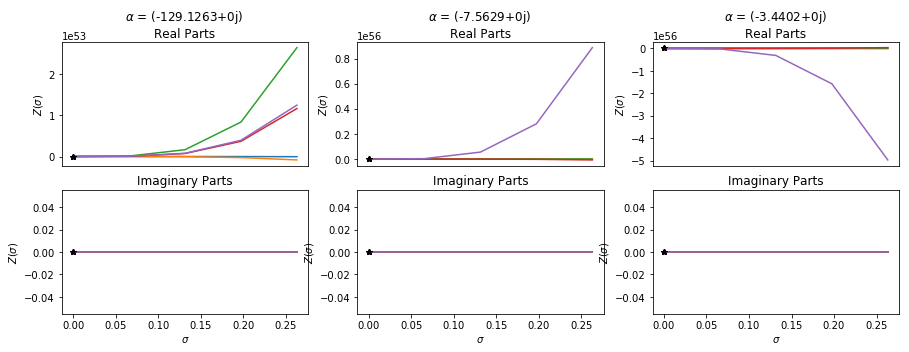

### $\lambda$ = (90.9339+90.9339j)

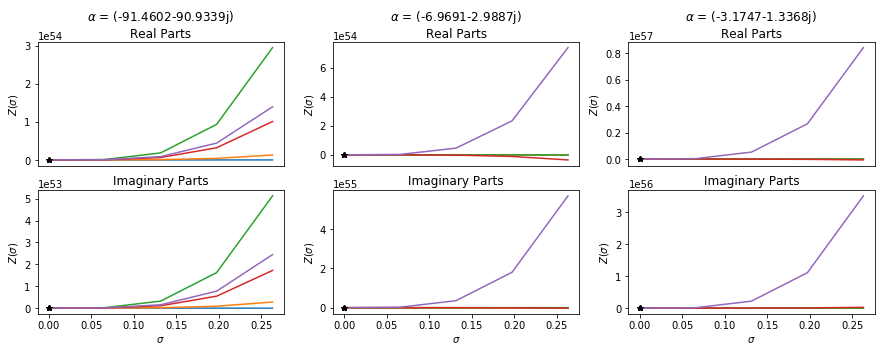

### $\lambda$ = 128.6j

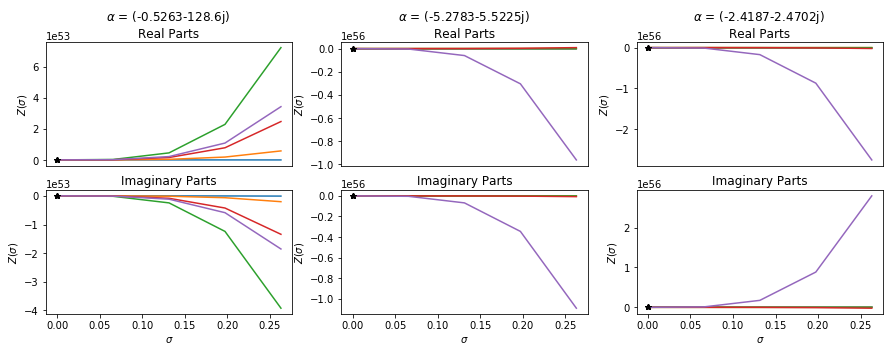

# $\Lambda$ = 450.3

### $\lambda$ = -450.3j

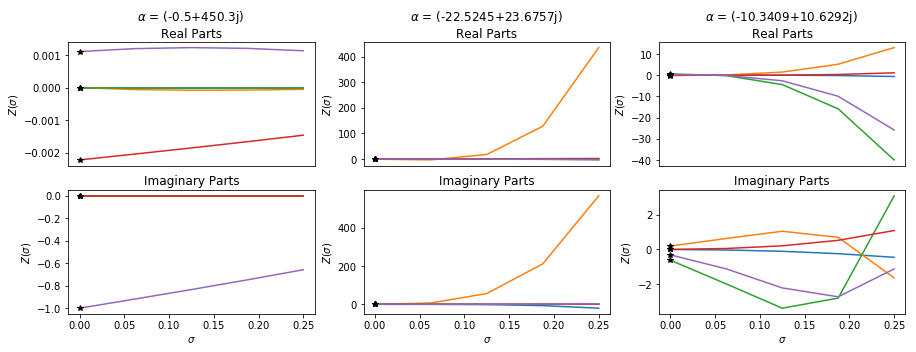

### $\lambda$ = (318.4102-318.4102j)

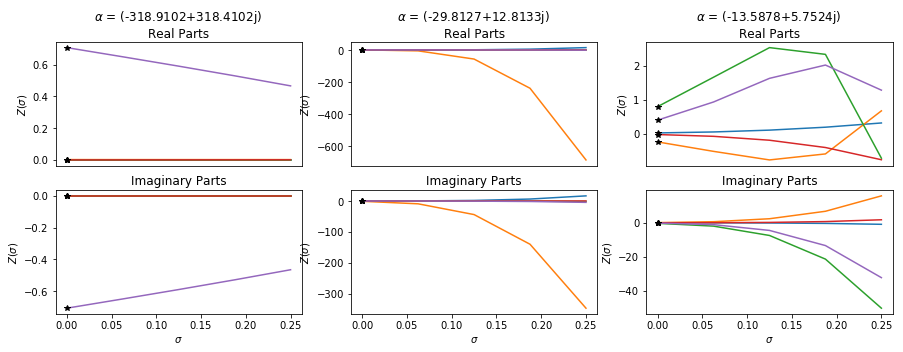

### $\lambda$ = (450.3+0j)

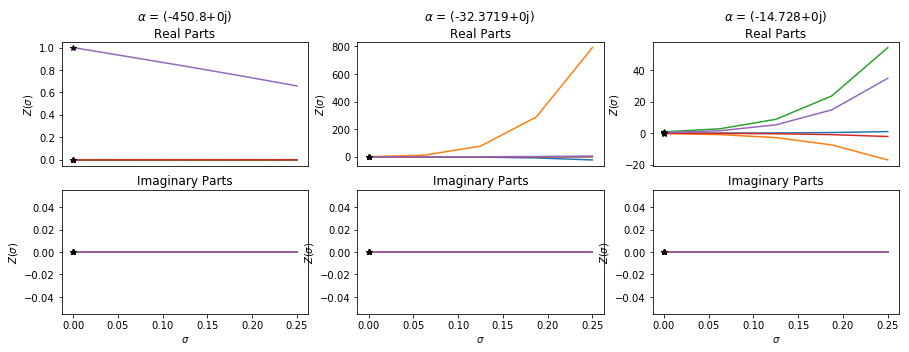

### $\lambda$ = (318.4102+318.4102j)

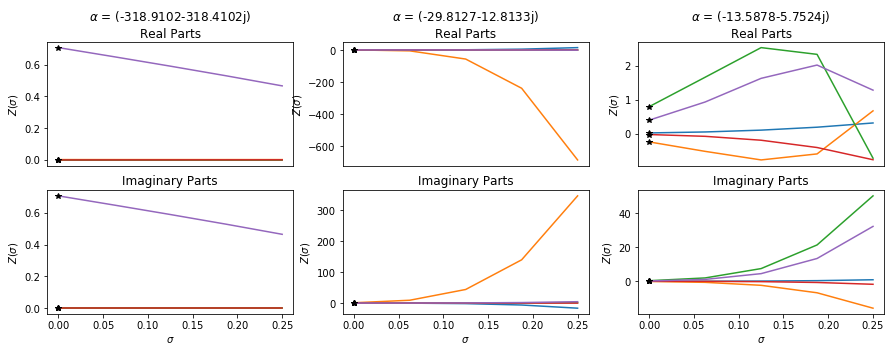

### $\lambda$ = 450.3j

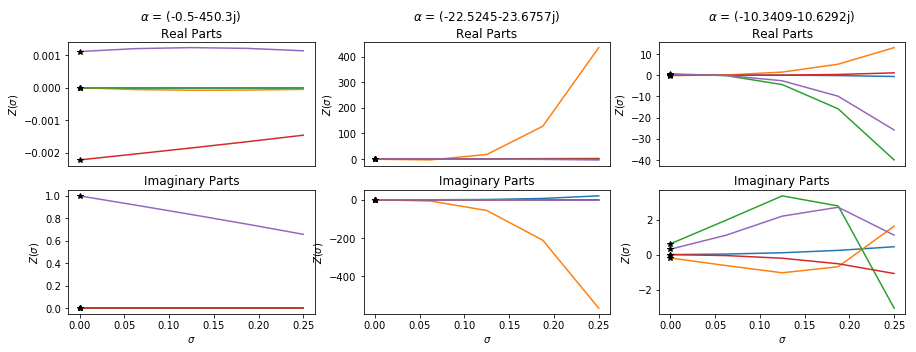

# $\Lambda$ = 167.5

### $\lambda$ = -167.5j

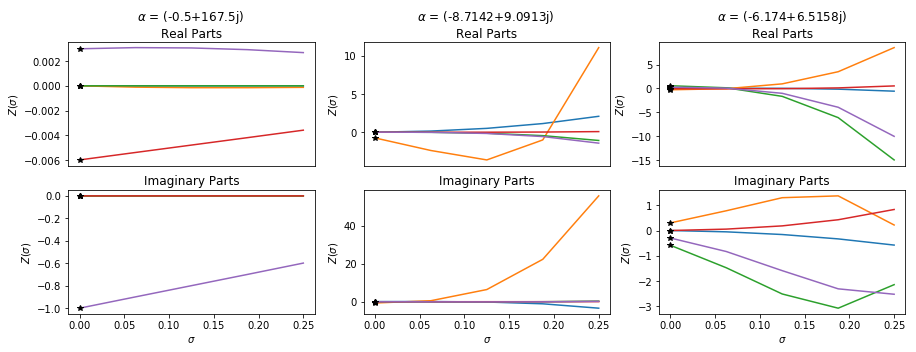

### $\lambda$ = (118.4404-118.4404j)

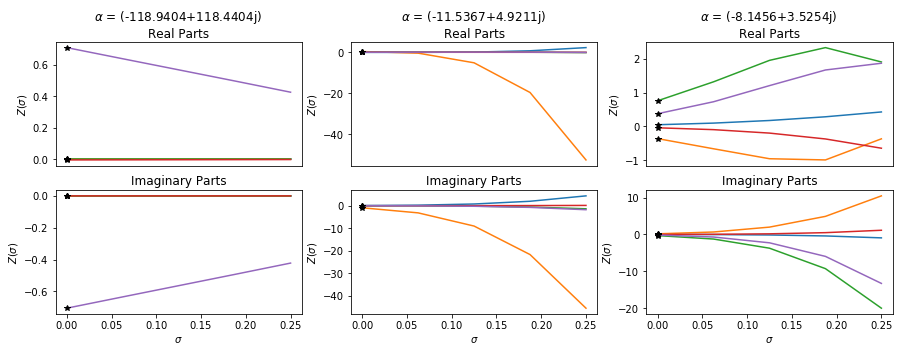

### $\lambda$ = (167.5+0j)

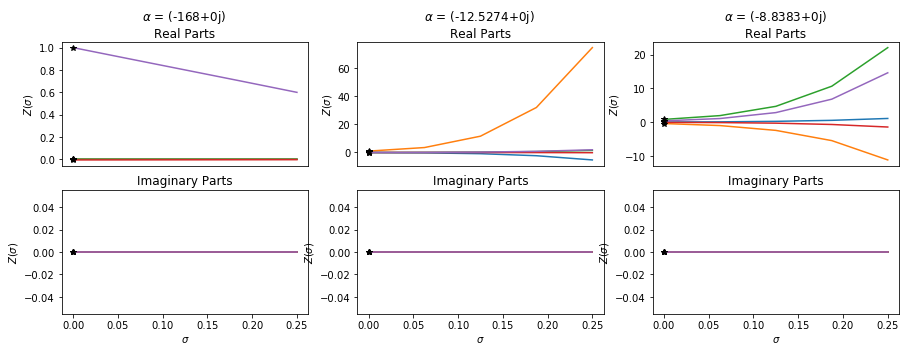

### $\lambda$ = (118.4404+118.4404j)

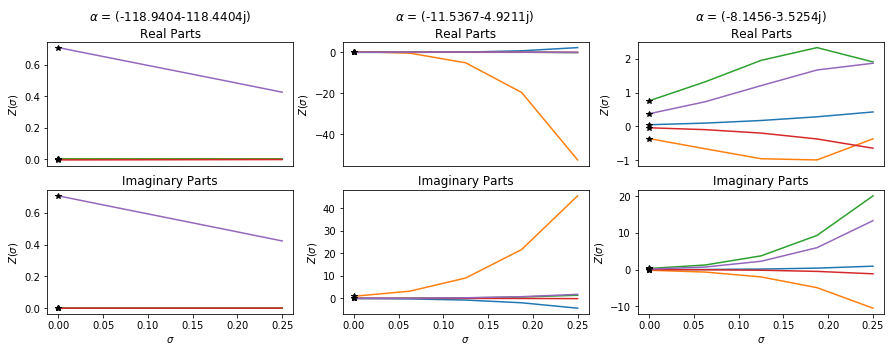

### $\lambda$ = 167.5j

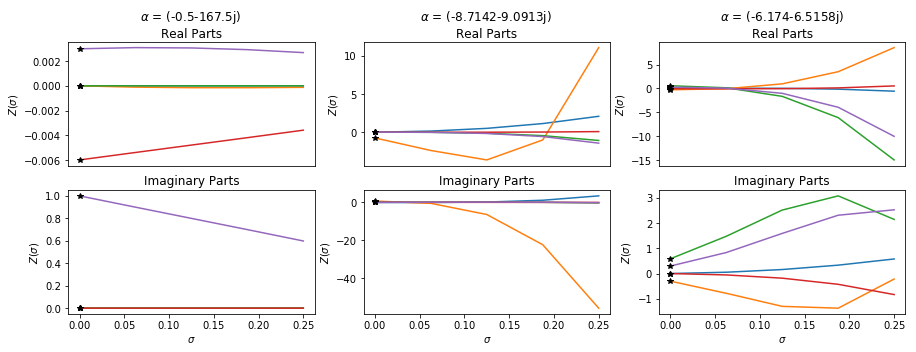

# $\Lambda$ = 88.7

### $\lambda$ = -88.7j

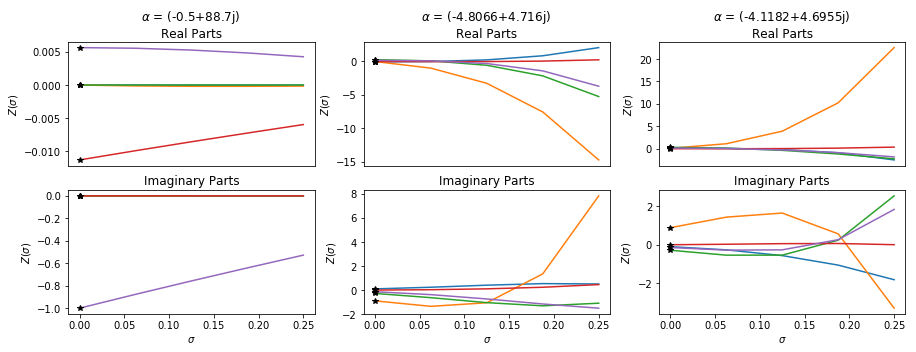

### $\lambda$ = (62.7204-62.7204j)

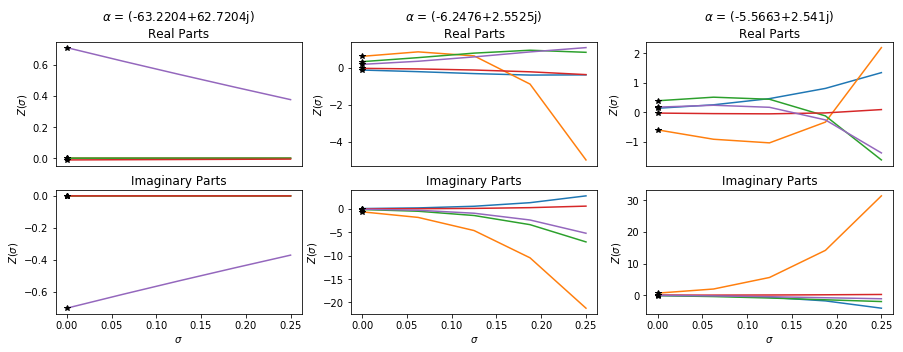

### $\lambda$ = (88.7+0j)

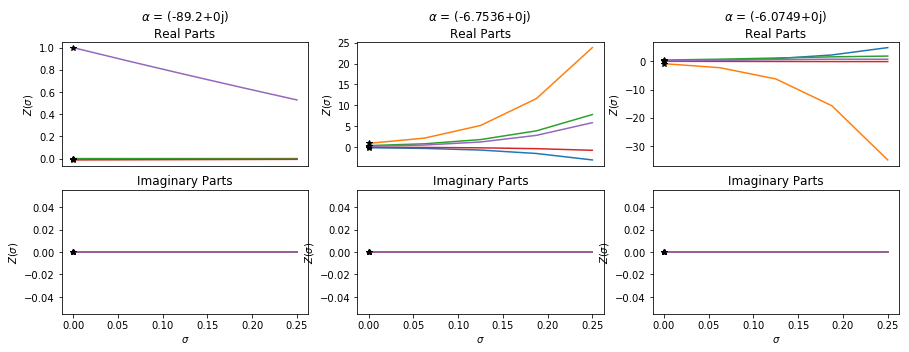

### $\lambda$ = (62.7204+62.7204j)

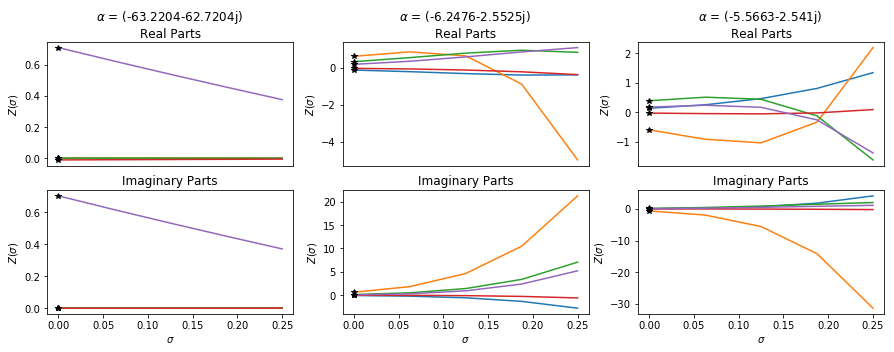

### $\lambda$ = 88.7j

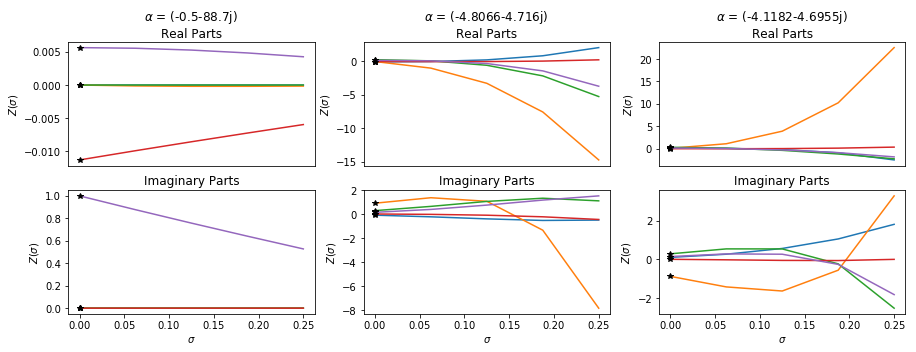

# $\Lambda$ = 96.7

### $\lambda$ = -96.7j

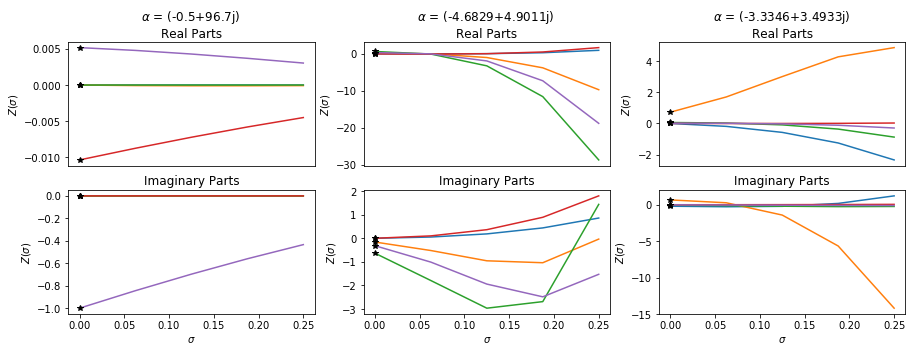

### $\lambda$ = (68.3772-68.3772j)

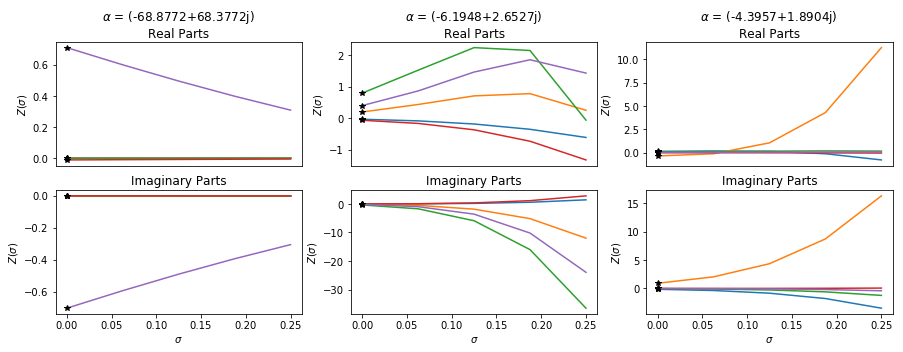

### $\lambda$ = (96.7+0j)

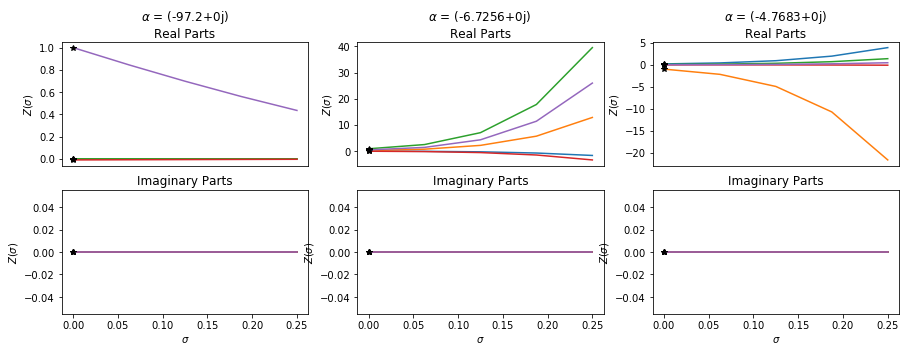

### $\lambda$ = (68.3772+68.3772j)

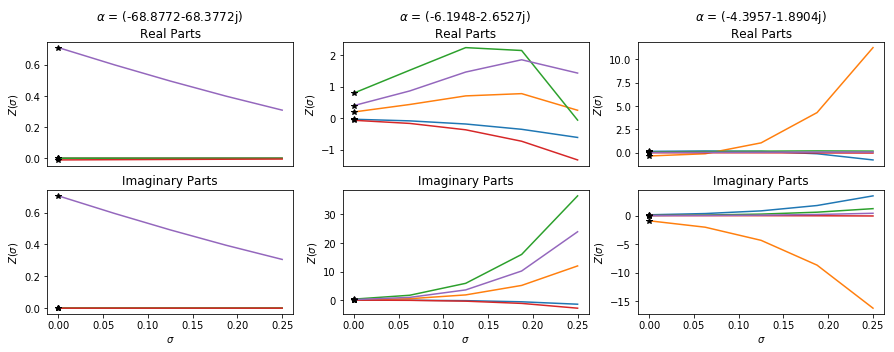

### $\lambda$ = 96.7j

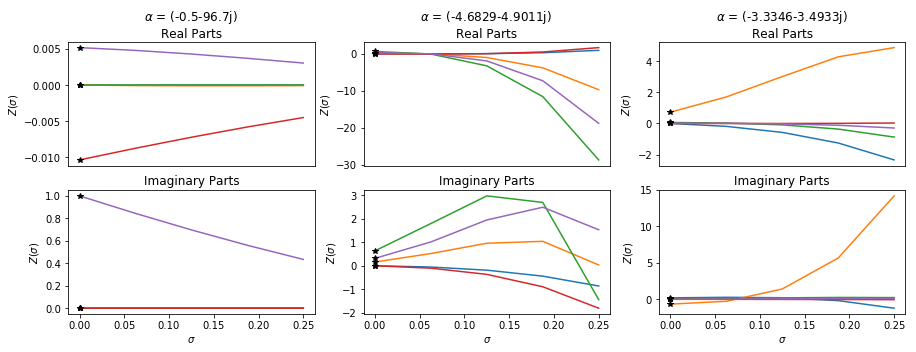

# $\Lambda$ = 124.7

### $\lambda$ = -124.7j

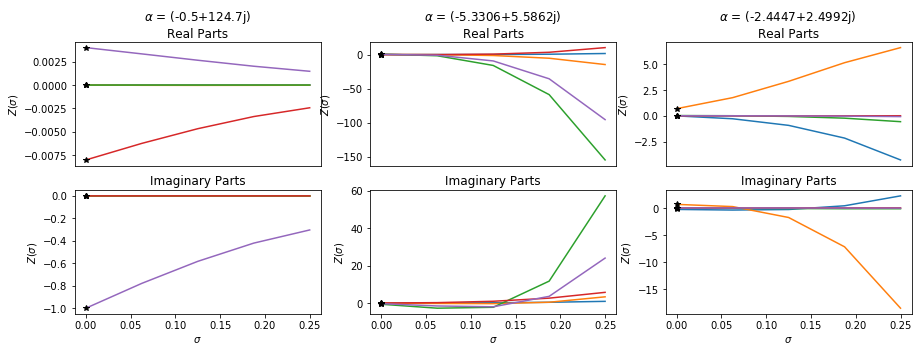

### $\lambda$ = (88.1762-88.1762j)

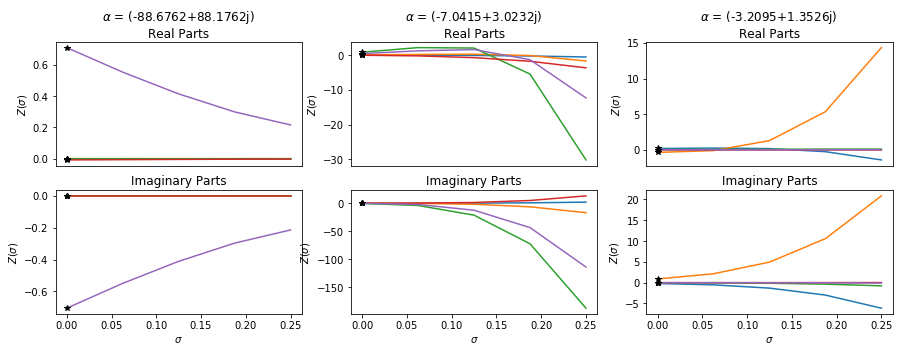

### $\lambda$ = (124.7+0j)

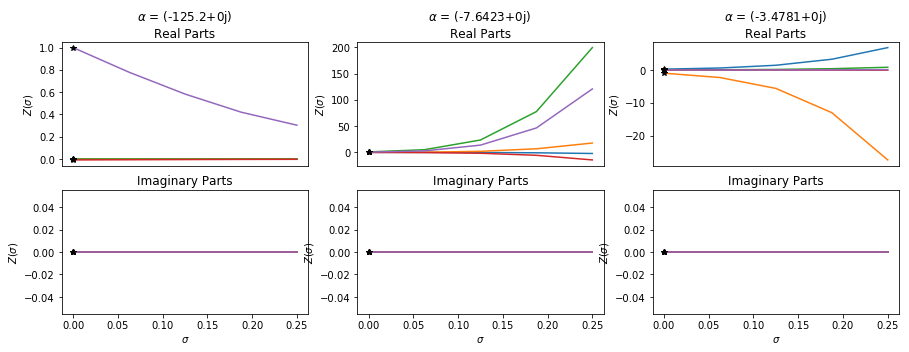

### $\lambda$ = (88.1762+88.1762j)

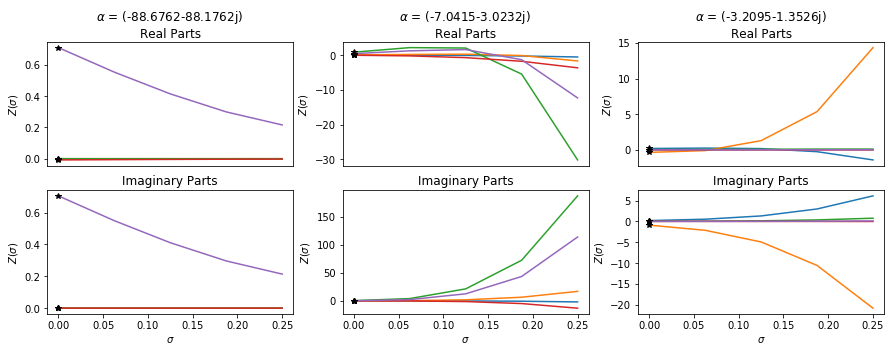

### $\lambda$ = 124.7j

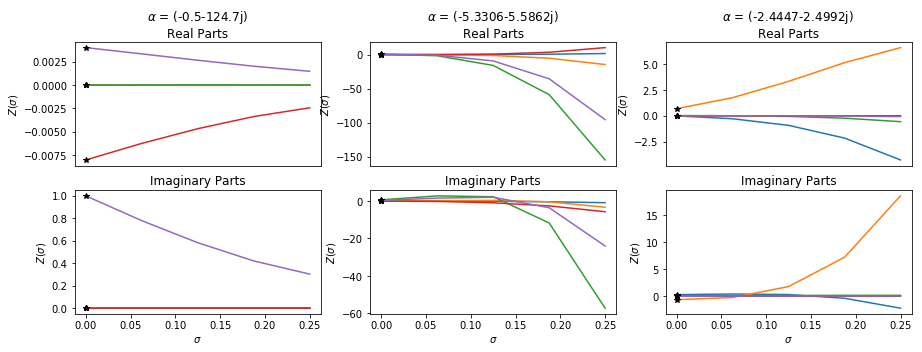

In [7]:
"""  0.2    0.5  1.0   2.0    5.0
0.2 398.6 388.8 385.3 733.8 1755.6
0.4 211.7 182.3 175.1 325.0 762.0
0.6 222.5 123.4 111.5 198.4 449.8
2/3 226.8 114.3 100.4 175.3 391.3
0.8 236.5 103.9 85.3 142.6 307.1
1.0 253.8 100.8 73.7 113.8 229.2
1.2 274.3 106.6 69.7 98.7 183.1
1.4 300.8 117.5 70.5 91.6 154.9
1.6 347.4 131.8 74.5 89.8 138.0
1.8 397.3 148.7 80.8 91.8 128.6
2.0 450.3 167.5 88.7 96.7 124.7"""

G_vals = [.2,.4,.6,2/3,.8,1,1.2,1.4,1.6,1.8,2]
nu_vals = [0.2, 0.5, 1.0, 2.0, 5.0]

vals = np.array([[398.6, 388.8, 385.3, 733.8, 1755.6],\
                 [211.7, 182.3, 175.1, 325.0, 762.0],\
                 [222.5, 123.4, 111.5, 198.4, 449.8],\
                 [226.8, 114.3, 100.4, 175.3, 391.3],\
                 [236.5, 103.9, 85.3, 142.6, 307.1],\
                 [253.8, 100.8, 73.7, 113.8, 229.2],\
                 [274.3, 106.6, 69.7, 98.7, 183.1],\
                 [300.8, 117.5, 70.5, 91.6, 154.9],\
                 [347.4, 131.8, 74.5, 89.8, 138.0],\
                 [397.3, 148.7, 80.8, 91.8, 128.6],\
                 [450.3, 167.5, 88.7, 96.7, 124.7]])

theta_vals = np.linspace(-np.pi/2,np.pi/2,5)

for i,G_val in enumerate(G_vals):
    for j,nu_val in enumerate(nu_vals):
        G = G_val
        vp = G/(G+2)
        sp = 0
        sm = 1-vp
        
        lam_bound = vals[i][j]
        display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
        for theta_val in theta_vals:
            lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

            loc = 0
            A, u_x, e_vals, e_vecs = solve_evans(lam_val, G=G_val, nu=nu_val)
            to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
            display(Markdown('### $\lambda$ = {}'.format(to_disp)))
            for k in range(len(e_vals)):
                if e_vals[k].real < 0:
                    loc += 1
                    sys_ = SystemSolve(5, 5, A, u_x, e_vals[k], e_vecs[k], False, True)
                    sys_.createSys()

                    sigs = np.linspace(sp,sm/2,5)
                    W_ = np.zeros((5,len(sigs)), dtype=np.complex)
                    for p,sig in enumerate(sigs):
                        w_val = sys_.evalW(sig)
                        W_[:,p] = w_val

                    rp = round(e_vals[k].real,4)
                    ip = round(e_vals[k].imag,4)
                    eval = rp+ip*1j

                    plt.subplot(2,3,loc)
                    for p in range(len(W_[:,0])):
                        plt.plot(sigs[:], -W_[p][:].real,label=p+1)
                        plt.plot(0,-e_vecs[k][p].real,'*k')

                    plt.title(r'$\alpha$ = {}'.format(eval)+ ' \nReal Parts')
                    plt.ylabel(r'$Z(\sigma)$')
                    plt.xticks([], [])

                    plt.subplot(2,3,loc+3)
                    for p in range(len(W_[:,0])):
                        plt.plot(sigs[:], -W_[p][:].imag,label=p+1)
                        plt.plot(0,-e_vecs[k][p].imag,'*k')
                    plt.xlabel(r'$\sigma$')
                    plt.ylabel(r'$Z(\sigma)$')
                    plt.title('Imaginary Parts')


            plt.show()

### Testing with imaginary values for $\lambda$

In [110]:
A, u_x, e_vals, e_vecs = solve_evans(1j)
print(e_vals)

[ 5.40810439+0.7462489j  -1.21677141-0.98268202j  0.38850454+0.57419463j
 -0.07367135-0.98998485j -0.05162071-0.34777667j]


In [112]:
sys = SystemSolve(5, 4, A, u_x, e_vals[1], e_vecs[1], False, True)
sys.createSys()

sigmas = np.linspace(sp,sm,20)
W = np.zeros((5,len(sigmas)), dtype=np.complex)
for i,sig in enumerate(sigmas):
    w_val = sys.evalW(sig)
    W[:,i] = w_val

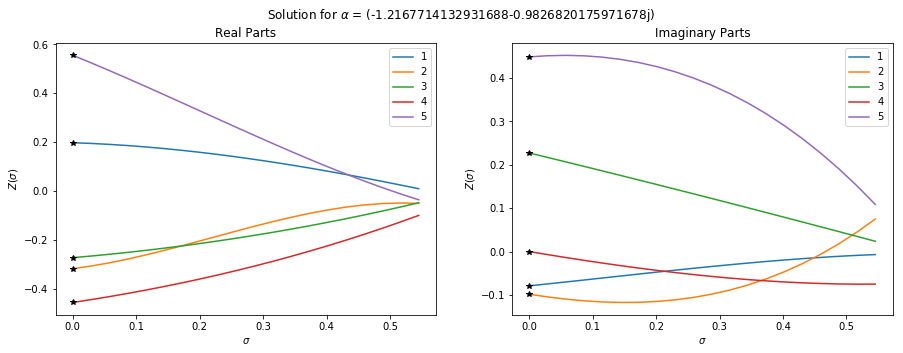

In [113]:
for i in range(len(W[:,0])):
    plt.subplot(121)
    plt.plot(sigmas[:], -W[i][:].real,label=i+1)
    plt.plot(0,-e_vecs[1][i].real,'*k')
    plt.xlabel(r'$\sigma$')
    plt.ylabel(r'$Z(\sigma)$')
    plt.title('Real Parts')
    plt.legend()
    
    plt.subplot(122)
    plt.plot(sigmas[:], -W[i][:].imag,label=i+1)
    plt.plot(0,-e_vecs[1][i].imag,'*k')
    plt.xlabel(r'$\sigma$')
    plt.ylabel(r'$Z(\sigma)$')
    plt.title('Imaginary Parts')
    plt.legend()
    
plt.suptitle(r'Solution for $\alpha$ = {}'.format(e_vals[1]))
plt.show()

In [121]:
e_vals[0]

(5.6308279984656631+1.3841093469689842j)

In [125]:
round(e_vals[0],4)

(5.6307999999999998+1.3841000000000001j)

## $\lambda$ = 1j

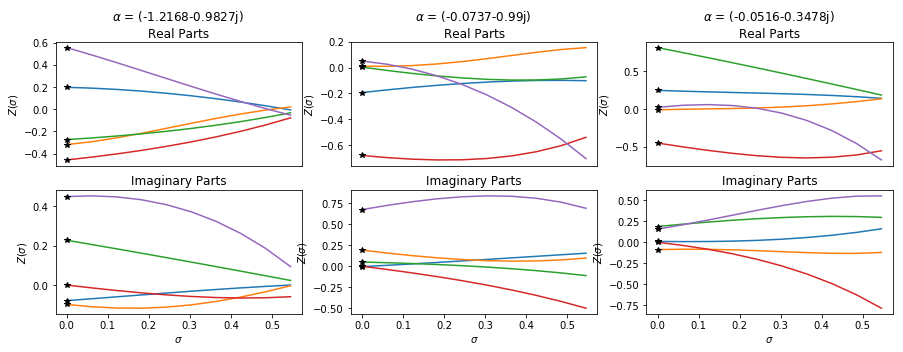

## $\lambda$ = (-0-1j)

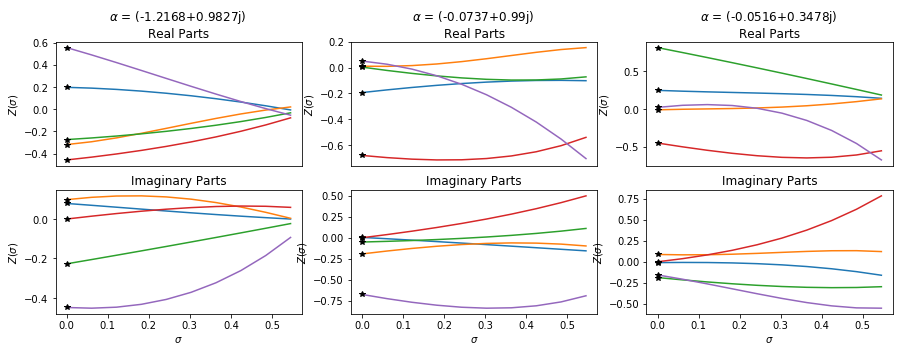

## $\lambda$ = 2j

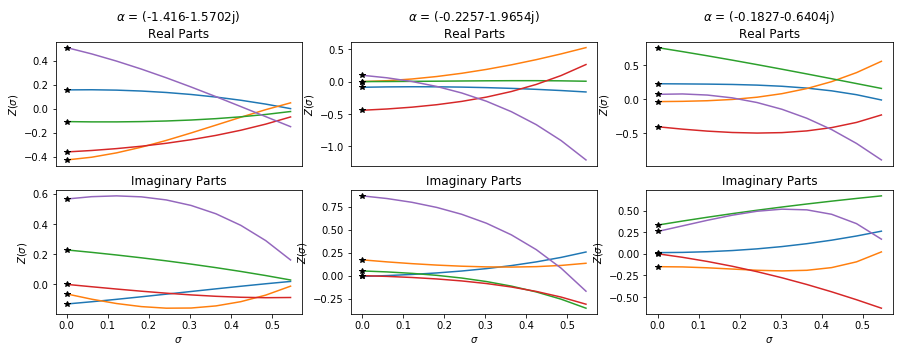

## $\lambda$ = (-0-2j)

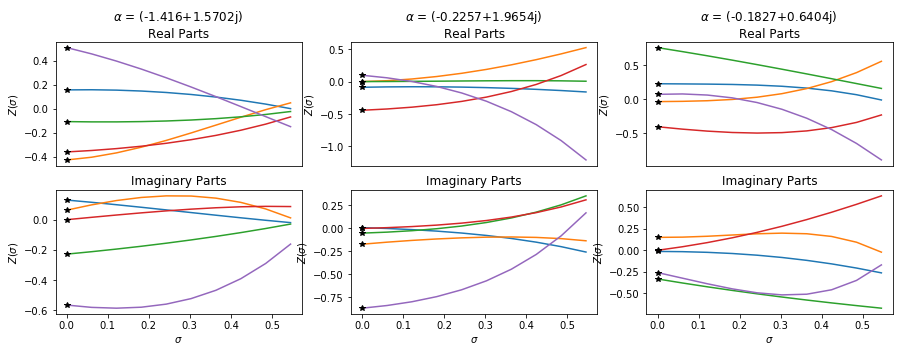

## $\lambda$ = 10j

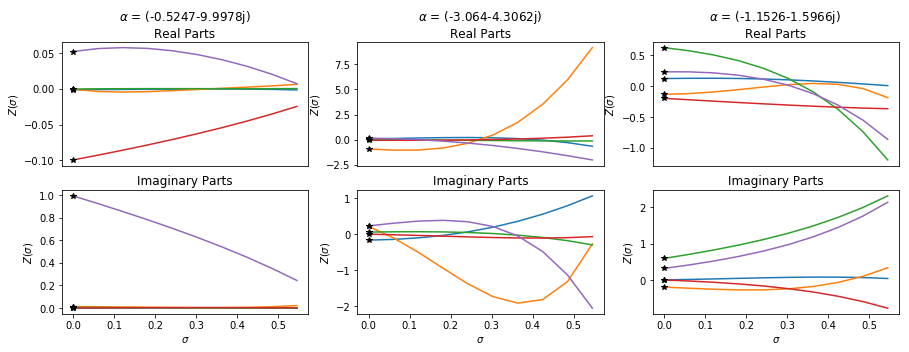

## $\lambda$ = (-0-10j)

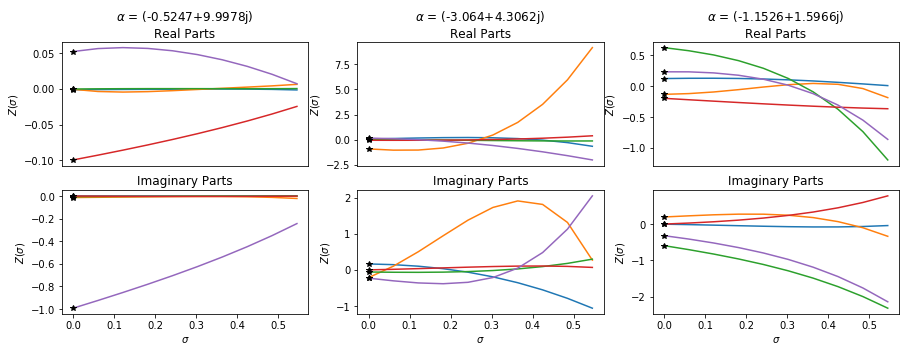

## $\lambda$ = (10+10j)

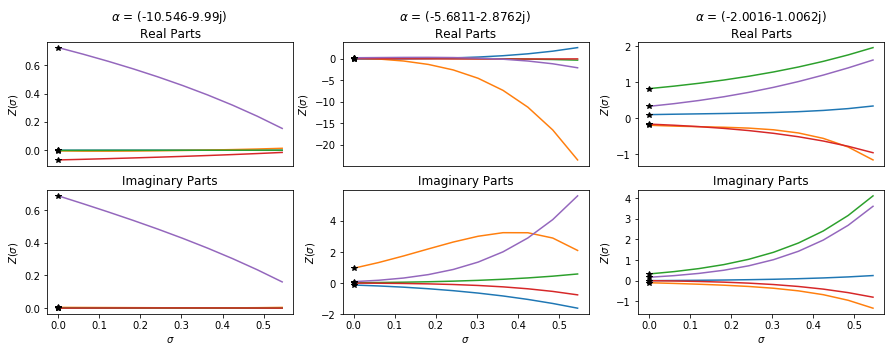

## $\lambda$ = (10-10j)

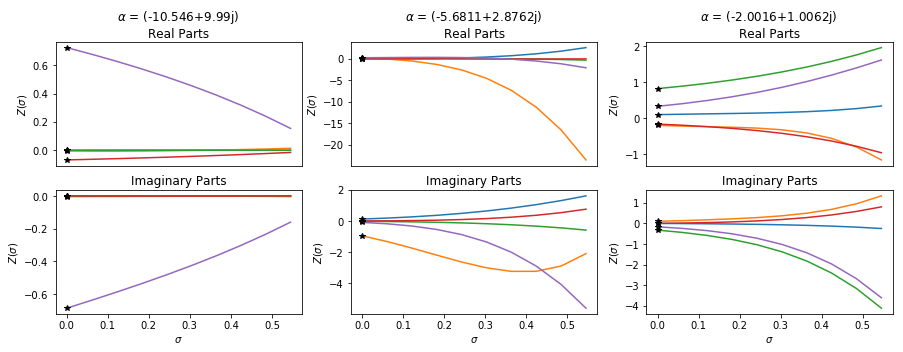

In [129]:
lambdas = [1j,-1j,2j,-2j,10j,-10j,10+10j,10-10j]
for lmbda in lambdas:
    loc = 0
    A, u_x, e_vals, e_vecs = solve_evans(lmbda)
    display(Markdown('## $\lambda$ = {}'.format(lmbda)))
    for j in range(len(e_vals)):
        if e_vals[j].real < 0:
            loc += 1
            sys_ = SystemSolve(5, 5, A, u_x, e_vals[j], e_vecs[j], False, True)
            sys_.createSys()

            sigs = np.linspace(sp,sm,10)
            W_ = np.zeros((5,len(sigs)), dtype=np.complex)
            for i,sig in enumerate(sigs):
                w_val = sys_.evalW(sig)
                W_[:,i] = w_val
                
            rp = round(e_vals[j].real,4)
            ip = round(e_vals[j].imag,4)
            eval = rp+ip*1j
            
            plt.subplot(2,3,loc)
            for i in range(len(W_[:,0])):
                plt.plot(sigs[:], -W_[i][:].real,label=i+1)
                plt.plot(0,-e_vecs[j][i].real,'*k')
       
            plt.title(r'$\alpha$ = {}'.format(eval)+ ' \nReal Parts')
            plt.ylabel(r'$Z(\sigma)$')
            plt.xticks([], [])
            
            plt.subplot(2,3,loc+3)
            for i in range(len(W_[:,0])):
                plt.plot(sigs[:], -W_[i][:].imag,label=i+1)
                plt.plot(0,-e_vecs[j][i].imag,'*k')
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$Z(\sigma)$')
            plt.title('Imaginary Parts')
        
                        
    plt.show()

### Scale out by most negative eigenvalue

In [159]:
sys1 = SystemSolve(5, 100, A, u_x, e_vals[1], e_vecs[1], False)
sys1.createSys()

In [195]:
sys1.checkBNorms()

1.05265575149428
1.09472441791299
1.00269040459294
0.971744044475284
0.992428931497529
0.943811516274721
1.02040014114996
0.984909680356782
1.31485449997527
1.49933403852601
1.92627689869161
2.40016559488057
3.05372313440788
3.89025744594995
4.97514826282238
6.39905208589642
8.24523963045894
10.6704724114583
13.8331355846322
17.9874576019423
23.4300826277063
30.5865614599230
39.9927166211037
52.3802933751945
68.7012546382698
90.2318393981186
118.654205114248
156.209819833323
205.868859229347
271.583048140463
358.601664566831
473.909076969062
626.795847157907
829.630242120519
1098.88054033758
1456.48536365821
1931.67923378941
2563.43419897712
3403.71943094506
4521.85912824250
6010.35623715321
7992.67988005648
10633.6787061061
14153.5104379459
18846.2775492594
25104.9652123949
33454.8187610483
44598.0260398347
59473.5444301923
79337.2207082550
105869.105725085
141317.219588386
188690.180318020
252015.346132392
336684.807607479
449919.198098585
601389.535668058
804051.063761278
1075261.52

[1.05265575149428,
 1.09472441791299,
 1.00269040459294,
 0.971744044475284,
 0.992428931497529,
 0.943811516274721,
 1.02040014114996,
 0.984909680356782,
 1.31485449997527,
 1.49933403852601,
 1.92627689869161,
 2.40016559488057,
 3.05372313440788,
 3.89025744594995,
 4.97514826282238,
 6.39905208589642,
 8.24523963045894,
 10.6704724114583,
 13.8331355846322,
 17.9874576019423,
 23.4300826277063,
 30.5865614599230,
 39.9927166211037,
 52.3802933751945,
 68.7012546382698,
 90.2318393981186,
 118.654205114248,
 156.209819833323,
 205.868859229347,
 271.583048140463,
 358.601664566831,
 473.909076969062,
 626.795847157907,
 829.630242120519,
 1098.88054033758,
 1456.48536365821,
 1931.67923378941,
 2563.43419897712,
 3403.71943094506,
 4521.85912824250,
 6010.35623715321,
 7992.67988005648,
 10633.6787061061,
 14153.5104379459,
 18846.2775492594,
 25104.9652123949,
 33454.8187610483,
 44598.0260398347,
 59473.5444301923,
 79337.2207082550,
 105869.105725085,
 141317.219588386,
 188690.

In [162]:
sigmas1 = np.linspace(sp,sm,10)
W1 = np.zeros((5,len(sigmas1)))
for i,sig in enumerate(sigmas1):
    w_val = sys1.evalW(sig)
    W1[:,i] = w_val

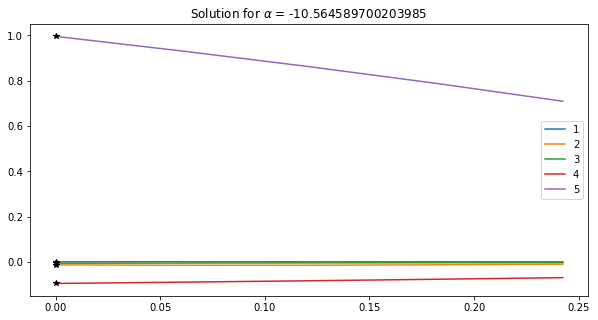

In [194]:
for i in range(len(W1[:,0])):
    plt.plot(sigmas1[:5], -W1[i][:5],label=i+1)
    plt.plot(0,-e_vecs[1][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[1]))
plt.show()

### Scale out by second most negative eigenvalue

In [20]:
sys2_1 = SystemSolve(5, 5, A, u_x, e_vals[2], e_vecs[2], False)
sys2_1.createSys()

sigmas2_1 = np.linspace(sp,sm,20)
W2_1 = np.zeros((5,len(sigmas2_1)))
for i,sig in enumerate(sigmas2_1):
    w_val = sys2_1.evalW(sig)
    W2_1[:,i] = w_val

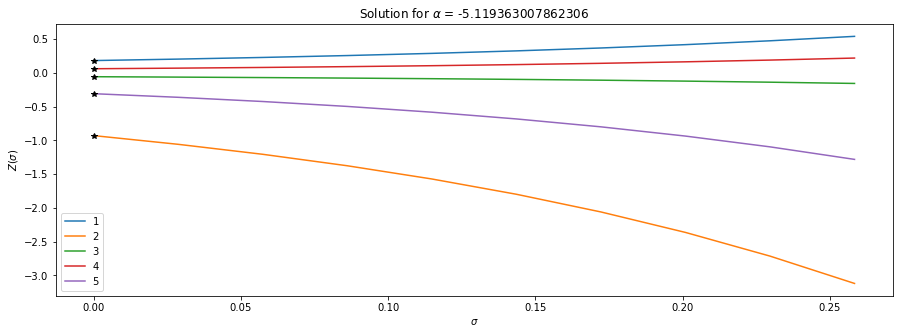

In [21]:
for i in range(len(W2_1[:,0])):
    plt.plot(sigmas2_1[:10], W2_1[i][:10],label=i+1)
    plt.plot(0,e_vecs[2][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[2]))
#plt.xlim(0,.3)
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()

In [107]:
sys2 = SystemSolve(5, 15, A, u_x, e_vals[2], e_vecs[2], False)
sys2.createSys()

In [108]:
sigmas2 = np.linspace(sp,sm,20)
W2 = np.zeros((5,len(sigmas2)))
for i,sig in enumerate(sigmas2):
    w_val = sys2.evalW(sig)
    W2[:,i] = w_val

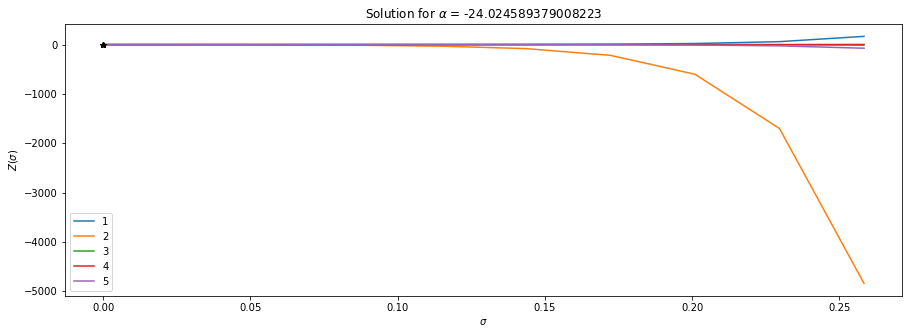

In [109]:
for i in range(len(W2[:,0])):
    plt.plot(sigmas2[:10], W2[i][:10],label=i+1)
    plt.plot(0,e_vecs[2][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[2]))
#plt.xlim(0,.3)
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()

### Scale out by third negative eigenvalue

In [19]:
sys3_1 = SystemSolve(5, 5, A, u_x, e_vals[4], e_vecs[4],False)
sys3_1.createSys()

sigmas3 = np.linspace(sp,sm,20)
W3_1 = np.zeros((5,len(sigmas3)))
for i,sig in enumerate(sigmas3):
    w_val = sys3_1.evalW(sig)
    W3_1[:,i] = w_val

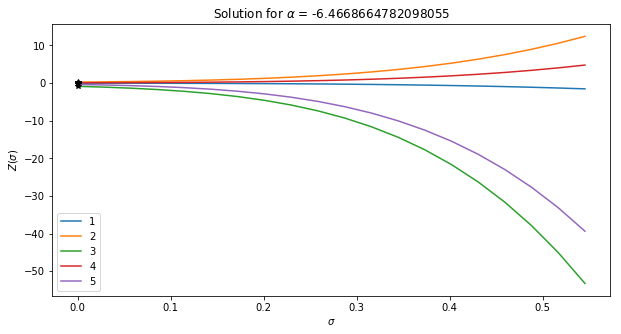

In [20]:
for i in range(len(W3_1[:,0])):
    plt.plot(sigmas3[:], W3_1[i][:],label=i+1)
    plt.plot(0,e_vecs[4][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[4]))
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()

In [35]:
sys3 = SystemSolve(5, 15, A, u_x, e_vals[4], e_vecs[4],False)
sys3.createSys()

In [36]:
sigmas3 = np.linspace(sp,sm/2,20)
W3 = np.zeros((5,len(sigmas3)))
for i,sig in enumerate(sigmas3):
    w_val = sys3.evalW(sig)
    W3[:,i] = w_val

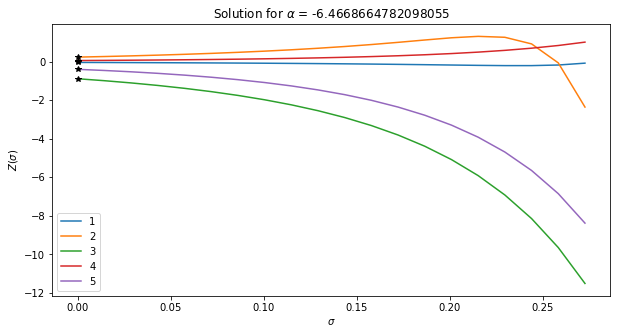

In [37]:
for i in range(len(W3[:,0])):
    plt.plot(sigmas3[:], W3[i][:],label=i+1)
    plt.plot(0,e_vecs[4][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[4]))
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()

### Experimenting with positive eigenvalues

In [182]:
sys10 = SystemSolve(5, 10, A, u_x, e_vals[0], e_vecs[0], False)
sys10.createSys()

sigmas10 = np.linspace(sp,sm,20)
W10 = np.zeros((5,len(sigmas10)))
for i,sig in enumerate(sigmas10):
    w_val = sys10.evalW(sig)
    W10[:,i] = w_val

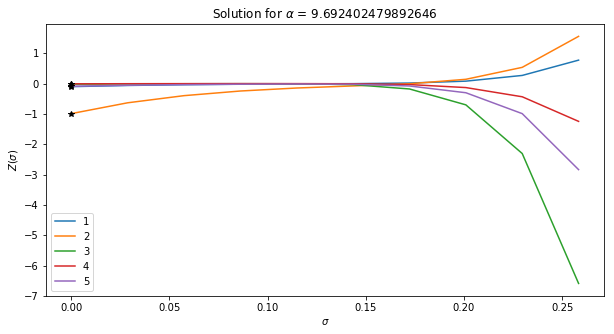

In [212]:
for i in range(len(W10[:,0])):
    plt.plot(sigmas10[:10], -W10[i][:10],label=i+1)
    plt.plot(0,-e_vecs[0][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[0]))
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()

In [188]:
sys11 = SystemSolve(5, 10, A, u_x, e_vals[3], e_vecs[3], False)
sys11.createSys()

sigmas11 = np.linspace(sp,sm,20)
W11 = np.zeros((5,len(sigmas11)))
for i,sig in enumerate(sigmas11):
    w_val = sys11.evalW(sig)
    W11[:,i] = w_val

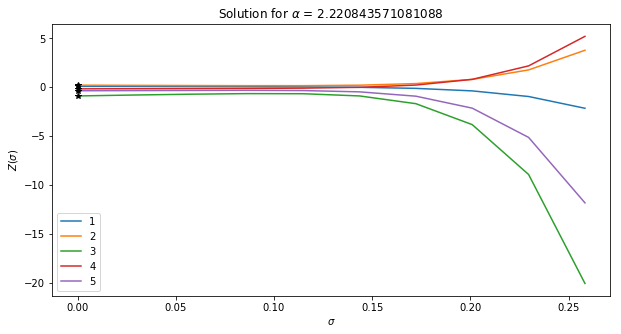

In [205]:
for i in range(len(W11[:,0])):
    plt.plot(sigmas11[:10], -W11[i][:10],label=i+1)
    plt.plot(0,-e_vecs[3][i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals[3]))
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$Z(\sigma)$')
plt.show()